In [4]:
import json
import os

import numpy as np
import pandas as pd
from matplotlib import pyplot as plt
from tqdm.notebook import tqdm

from snn.layers import SCTNLayer
from snn.resonator import test_resonator_on_chirp, lp_by_lf, freq_of_resonator
from snn.spiking_network import SpikingNetwork
from snn.spiking_neuron import create_SCTN, IDENTITY

In [15]:
filters_dir = '../filters4/clk_1536000/parameters/'

clk_freq = 1536000
resonators_parameters = []
# chosen_freqs = [111, 119, 127, 136, 145, 156, 167, 178]
for f in tqdm(os.listdir(filters_dir)):
    if f.endswith('_.json'):
        continue
    with open(f'{filters_dir}/{f}') as f:
        hp = {}
        full_parameters = json.load(f)
        f_resonator = float(full_parameters['f_resonator'])
        if f_resonator > 236:
            continue
        # if full_parameters['lf'] != 5 or int(full_parameters['freq0']//1) not in chosen_freqs:
        #     continue
        hp['f_resonator'] = f_resonator#float(full_parameters['peaks'][2])
        for i in range(4):
            hp[f'th{i}'] = full_parameters['thetas'][i]
        for i in range(5):
            hp[f'w{i}'] = full_parameters['weights'][i]
        resonators_parameters.append(hp)

df = pd.DataFrame(resonators_parameters)
df = df.set_index('f_resonator').sort_index()
df

  0%|          | 0/16 [00:00<?, ?it/s]

,th0,th1,th2,th3,w0,w1,w2,w3,w4
f_resonator,,,,,,,,,
118.440888,-2.151,-17.020,-9.344,-18.835,12.541,9.166,36.039,19.570,37.965
126.271690,-2.162,-17.048,-8.788,-17.871,17.152,14.385,34.346,18.155,35.990
135.211279,-2.170,-17.071,-8.811,-17.865,21.573,18.214,34.451,18.354,36.179
145.513091,-2.189,-17.116,-8.859,-17.951,27.547,23.924,34.161,18.541,36.431
157.514170,-2.192,-17.126,-8.869,-17.953,34.741,31.170,34.404,18.837,36.766
166.074723,-2.203,-17.159,-8.898,-17.959,42.535,38.593,34.345,18.817,36.657
179.751465,-2.215,-17.252,-8.967,-17.970,51.266,46.592,35.134,19.436,36.859
190.985932,-2.250,-17.478,-9.121,-17.992,61.707,56.822,35.780,19.660,36.635
203.718327,-2.310,-17.651,-9.262,-18.012,79.626,74.661,35.628,19.840,36.774


In [16]:
from numpy.polynomial.polynomial import Polynomial

polynom_deg = 4
for col in df.columns:
    fit = Polynomial.fit(df.index, df[col], deg=polynom_deg)
    df[f'{col}-fit'] = fit(df.index)
poly_th0 = Polynomial.fit(df.index, df['th0'], deg=polynom_deg)
poly_th1 = Polynomial.fit(df.index, df['th1'], deg=polynom_deg)
poly_th2 = Polynomial.fit(df.index, df['th2'], deg=polynom_deg)
poly_th3 = Polynomial.fit(df.index, df['th3'], deg=polynom_deg)

poly_w0 = Polynomial.fit(df.index, df['w0'], deg=polynom_deg)
poly_w1 = Polynomial.fit(df.index, df['w1'], deg=polynom_deg)
poly_w2 = Polynomial.fit(df.index, df['w2'], deg=polynom_deg)
poly_w3 = Polynomial.fit(df.index, df['w3'], deg=polynom_deg)
poly_w4 = Polynomial.fit(df.index, df['w4'], deg=polynom_deg)
df

,th0,th1,th2,th3,w0,w1,w2,w3,w4,th0-fit,th1-fit,th2-fit,th3-fit,w0-fit,w1-fit,w2-fit,w3-fit,w4-fit
f_resonator,,,,,,,,,,,,,,,,,,
118.440888,-2.151,-17.020,-9.344,-18.835,12.541,9.166,36.039,19.570,37.965,-2.147719,-17.018730,-9.240366,-18.662008,12.309130,9.065077,35.851251,19.328210,37.577729
126.271690,-2.162,-17.048,-8.788,-17.871,17.152,14.385,34.346,18.155,35.990,-2.165096,-17.053399,-8.974150,-18.171935,17.205715,14.087263,34.805762,18.623322,36.659476
135.211279,-2.170,-17.071,-8.811,-17.865,21.573,18.214,34.451,18.354,36.179,-2.176408,-17.075106,-8.813760,-17.885430,22.128483,18.961567,34.202606,18.293297,36.202139
145.513091,-2.189,-17.116,-8.859,-17.951,27.547,23.924,34.161,18.541,36.431,-2.183386,-17.093589,-8.764270,-17.796223,27.650524,24.257933,34.051194,18.332014,36.174356
157.514170,-2.192,-17.126,-8.869,-17.953,34.741,31.170,34.404,18.837,36.766,-2.190289,-17.127925,-8.819192,-17.865177,34.771916,30.995136,34.306346,18.678868,36.462372
166.074723,-2.203,-17.159,-8.898,-17.959,42.535,38.593,34.345,18.817,36.657,-2.198151,-17.171566,-8.896497,-17.951762,40.720486,36.645109,34.619676,18.993504,36.705489
179.751465,-2.215,-17.252,-8.967,-17.970,51.266,46.592,35.134,19.436,36.859,-2.221306,-17.287819,-9.037829,-18.057347,52.171737,47.650622,35.149513,19.447321,36.949167
190.985932,-2.250,-17.478,-9.121,-17.992,61.707,56.822,35.780,19.660,36.635,-2.253516,-17.431684,-9.146174,-18.071218,63.449526,58.627935,35.520690,19.706156,36.939263
203.718327,-2.310,-17.651,-9.262,-18.012,79.626,74.661,35.628,19.840,36.774,-2.306725,-17.646141,-9.254666,-18.011014,77.967145,72.885068,35.868210,19.889667,36.744105


<AxesSubplot:xlabel='f_resonator'>

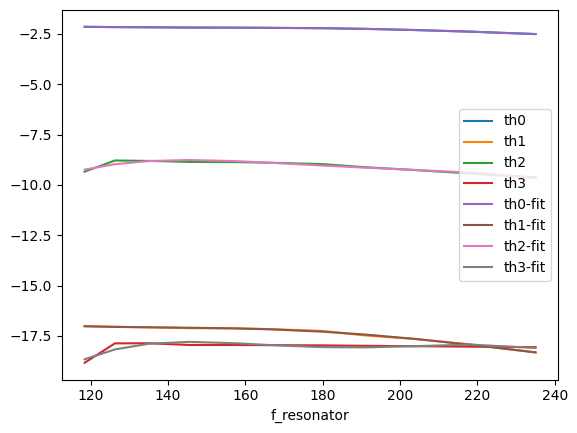

In [17]:
df[[f'th{i}' for i in range(4)] + [f'th{i}-fit' for i in range(4)]].plot()
# plt.vlines(x=580, ymin=-50, ymax=0)

<AxesSubplot:xlabel='f_resonator'>

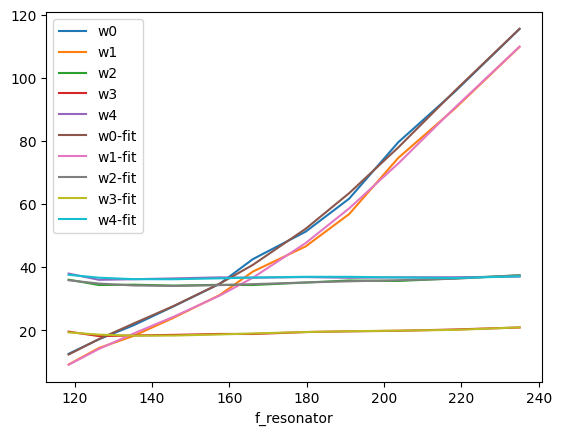

In [18]:
df[[f'w{i}' for i in range(5)] + [f'w{i}-fit' for i in range(5)]].plot()
# plt.vlines(x=580, ymin=0, ymax= 160)

In [19]:
def regression_resonator(
        freq0,
        clk_freq,
        lf,
):
    LF = lf
    LP = lp_by_lf(LF, freq0, clk_freq)
    network = SpikingNetwork(clk_freq)
    network.add_amplitude(1000)

    thetas = [poly_th0(freq0), poly_th1(freq0), poly_th2(freq0), poly_th3(freq0)]
    weights = [poly_w0(freq0), poly_w1(freq0), poly_w2(freq0), poly_w3(freq0), poly_w4(freq0)]
    print(thetas)
    print(weights)
    # Encode to pdm
    neuron = create_SCTN()
    neuron.activation_function = IDENTITY
    network.add_layer(SCTNLayer([neuron]))

    # SCTN 1
    neuron = create_SCTN()
    neuron.synapses_weights = np.array([weights[0], -weights[1]], dtype=np.float64)
    neuron.leakage_factor = LF
    neuron.leakage_period = LP
    neuron.theta = thetas[0]
    neuron.activation_function = IDENTITY
    neuron.membrane_should_reset = False
    network.add_layer(SCTNLayer([neuron]))

    for i in range(3):
        neuron = create_SCTN()
        neuron.synapses_weights = np.array([weights[2+i]], dtype=np.float64)
        neuron.leakage_factor = LF
        neuron.leakage_period = LP
        neuron.theta = thetas[1+i]
        neuron.activation_function = IDENTITY
        neuron.membrane_should_reset = False
        network.add_layer(SCTNLayer([neuron]))

    # feedback
    network.connect_by_id(4, 1)
    return network

freq0 209.29965118934183
[-2.3357877624235885, -17.75501365102154, -9.301741668470106, -17.97386785779948]
[84.73374445492672, 79.55748305234354, 36.021796213678925, 19.961459048921988, 36.64309849516854]
# 209.29965118934183 ~ peak 205.203 nid 1 snr 7.716


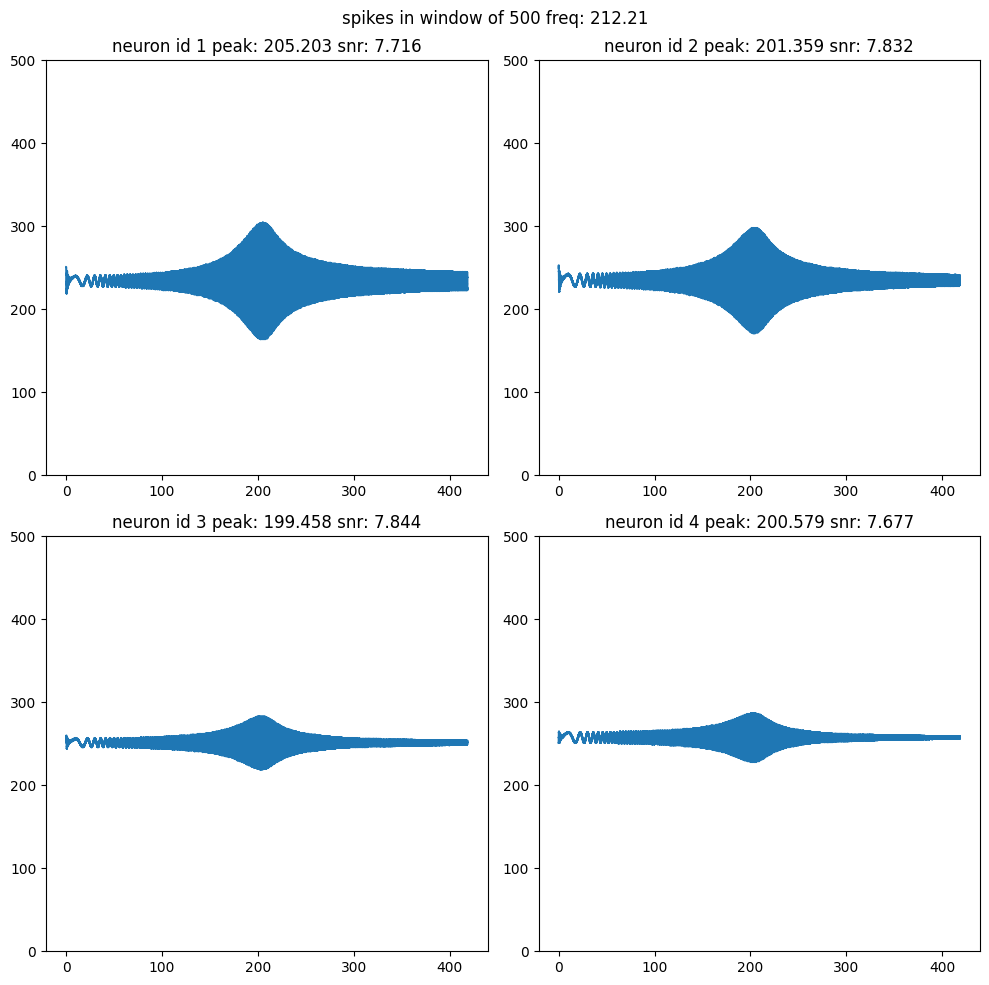

In [23]:
lf = 4
clk_freq = 1536000
# freq0 = 100 * (1.05 ** 32)
best_lp = 72#lp_by_lf(lf, freq0, clk_freq)
freq0 = freq_of_resonator(clk_freq, lf, best_lp)
print(f'freq0 {freq0}')
spikes_window = 500

res_resonator = regression_resonator(
    clk_freq=clk_freq,
    freq0=freq0,
    lf=lf,
)

for nid in range(1,5):
    res_resonator.log_out_spikes(nid)

start_freq = 0
spectrum = 2 * freq0
res_resonator.forget_logs()

step = 200 / clk_freq
test_size = int(spectrum / step)
test_resonator_on_chirp(
    res_resonator,
    start_freq=start_freq,
    step=step,
    test_size=test_size,
    clk_freq=clk_freq
)

snr = [0] * 4
peak = [0] * 4
best_lp = lp_by_lf(lf, freq0, clk_freq)
f_resonator = freq_of_resonator(clk_freq, lf, best_lp)
fig, axs = plt.subplots(2, 2, figsize=(10, 10))
fig.suptitle(f'spikes in window of {spikes_window} freq: {f_resonator:.2f}')
for nid in range(4):
    spikes_neuron = res_resonator.neurons[nid + 1]
    y_events = spikes_neuron.out_spikes()
    y_spikes = np.zeros(test_size)
    y_spikes[y_events] = 1
    y_spikes = np.convolve(y_spikes, np.ones(spikes_window, dtype=int), 'valid')
    x = np.linspace(start_freq, start_freq+spectrum, len(y_spikes))

    ax = axs[nid//2, nid%2]
    ax.set_ylim(0, spikes_window)
    ax.plot(x, y_spikes)
    snr_spikes = y_spikes[3000:]
    snr[nid] = (snr_spikes.max() - snr_spikes.min())/snr_spikes.std()
    peak[nid] = x[3000+np.argmax(snr_spikes)]
    ax.set_title(f'neuron id {nid + 1} peak: {peak[nid]:.3f} snr: {snr[nid]:.3f}')

fig.tight_layout()

nid = np.argmax(np.array(snr) / np.abs(np.array(peak) - freq0))
print(f'# {freq0} ~ peak {peak[nid]:.3f} nid {nid+1} snr {snr[nid]:.3f}')
plt.show()

freq0 2546.4790894703256
[-4774.070303347854, -6267.500033238453, -314.2079135776233, -2801.990322298822]
[-25509.662341428215, -34732.20547291297, 12103.598553297106, 1845.784860336447, 5064.622490489551]


C:\Users\User\AppData\Local\Temp\ipykernel_19332\1492419683.py:53: RuntimeWarning: invalid value encountered in scalar divide
  snr[nid] = (snr_spikes.max() - snr_spikes.min())/snr_spikes.std()
C:\Users\User\AppData\Local\Temp\ipykernel_19332\1492419683.py:53: RuntimeWarning: invalid value encountered in scalar divide
  snr[nid] = (snr_spikes.max() - snr_spikes.min())/snr_spikes.std()
C:\Users\User\AppData\Local\Temp\ipykernel_19332\1492419683.py:53: RuntimeWarning: invalid value encountered in scalar divide
  snr[nid] = (snr_spikes.max() - snr_spikes.min())/snr_spikes.std()
C:\Users\User\AppData\Local\Temp\ipykernel_19332\1492419683.py:53: RuntimeWarning: invalid value encountered in scalar divide
  snr[nid] = (snr_spikes.max() - snr_spikes.min())/snr_spikes.std()


# 2546.4790894703256 ~ peak 0.781 nid 1 snr nan


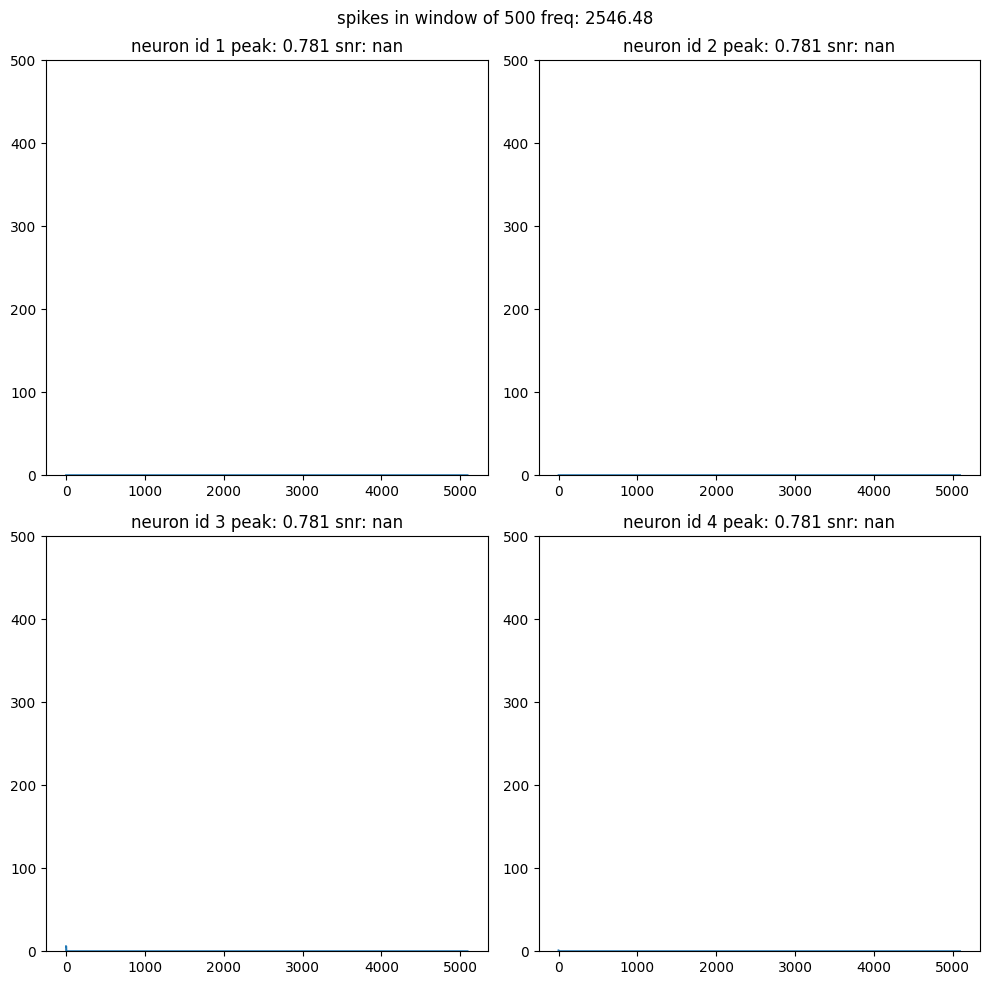

freq0 1909.8593171027442
[-1157.239407310134, -1658.8111337744317, -199.3550957478482, -693.6571569446303]
[-6440.024690721683, -8688.624489261838, 3220.644946502934, 662.9947185130258, 1284.592397657875]


C:\Users\User\AppData\Local\Temp\ipykernel_19332\1492419683.py:53: RuntimeWarning: invalid value encountered in scalar divide
  snr[nid] = (snr_spikes.max() - snr_spikes.min())/snr_spikes.std()
C:\Users\User\AppData\Local\Temp\ipykernel_19332\1492419683.py:53: RuntimeWarning: invalid value encountered in scalar divide
  snr[nid] = (snr_spikes.max() - snr_spikes.min())/snr_spikes.std()
C:\Users\User\AppData\Local\Temp\ipykernel_19332\1492419683.py:53: RuntimeWarning: invalid value encountered in scalar divide
  snr[nid] = (snr_spikes.max() - snr_spikes.min())/snr_spikes.std()
C:\Users\User\AppData\Local\Temp\ipykernel_19332\1492419683.py:53: RuntimeWarning: invalid value encountered in scalar divide
  snr[nid] = (snr_spikes.max() - snr_spikes.min())/snr_spikes.std()


# 1909.8593171027442 ~ peak 0.781 nid 1 snr nan


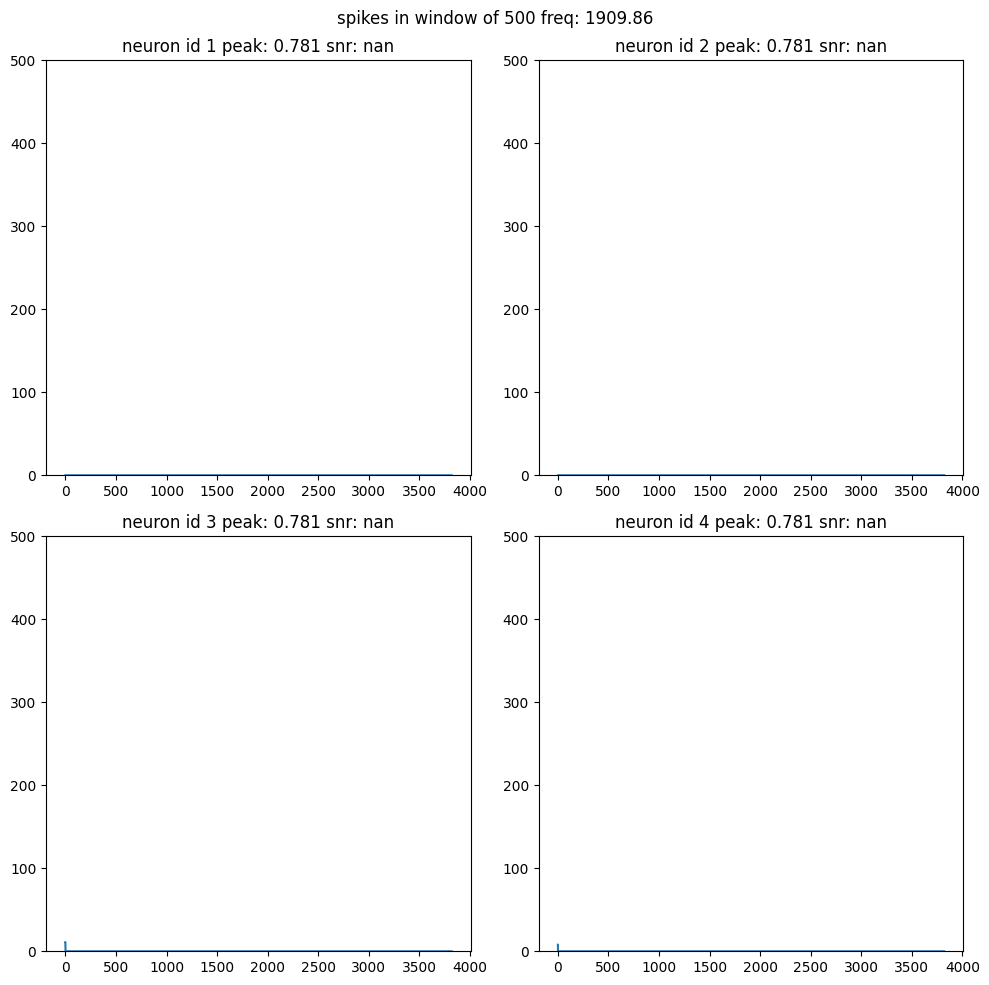

freq0 1527.8874536821952
[-364.6781614215134, -597.0728951056291, -131.25247734482645, -222.273833206606]
[-1950.0294096760392, -2665.544662111709, 1166.6068521962827, 332.1861899316219, 424.0342312395447]


C:\Users\User\AppData\Local\Temp\ipykernel_19332\1492419683.py:53: RuntimeWarning: invalid value encountered in scalar divide
  snr[nid] = (snr_spikes.max() - snr_spikes.min())/snr_spikes.std()
C:\Users\User\AppData\Local\Temp\ipykernel_19332\1492419683.py:53: RuntimeWarning: invalid value encountered in scalar divide
  snr[nid] = (snr_spikes.max() - snr_spikes.min())/snr_spikes.std()
C:\Users\User\AppData\Local\Temp\ipykernel_19332\1492419683.py:53: RuntimeWarning: invalid value encountered in scalar divide
  snr[nid] = (snr_spikes.max() - snr_spikes.min())/snr_spikes.std()
C:\Users\User\AppData\Local\Temp\ipykernel_19332\1492419683.py:53: RuntimeWarning: invalid value encountered in scalar divide
  snr[nid] = (snr_spikes.max() - snr_spikes.min())/snr_spikes.std()


# 1527.8874536821952 ~ peak 0.781 nid 1 snr nan


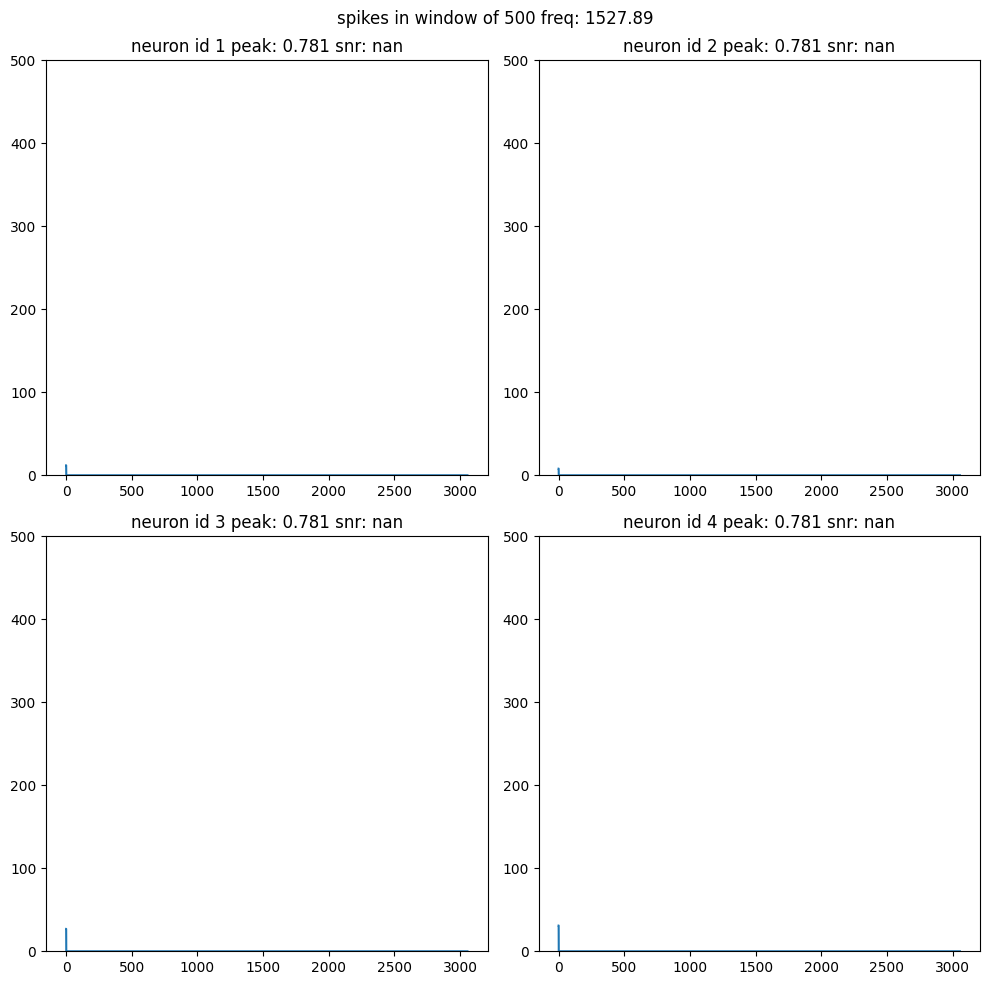

freq0 1273.2395447351628
[-139.14280298095582, -272.46353822266406, -92.83871022472152, -86.01340590204765]
[-589.6788121751172, -866.83129441951, 535.8197497725872, 205.355407601308, 170.00728498026115]


C:\Users\User\AppData\Local\Temp\ipykernel_19332\1492419683.py:53: RuntimeWarning: invalid value encountered in scalar divide
  snr[nid] = (snr_spikes.max() - snr_spikes.min())/snr_spikes.std()
C:\Users\User\AppData\Local\Temp\ipykernel_19332\1492419683.py:53: RuntimeWarning: invalid value encountered in scalar divide
  snr[nid] = (snr_spikes.max() - snr_spikes.min())/snr_spikes.std()
C:\Users\User\AppData\Local\Temp\ipykernel_19332\1492419683.py:53: RuntimeWarning: invalid value encountered in scalar divide
  snr[nid] = (snr_spikes.max() - snr_spikes.min())/snr_spikes.std()
C:\Users\User\AppData\Local\Temp\ipykernel_19332\1492419683.py:53: RuntimeWarning: invalid value encountered in scalar divide
  snr[nid] = (snr_spikes.max() - snr_spikes.min())/snr_spikes.std()


# 1273.2395447351628 ~ peak 0.781 nid 1 snr nan


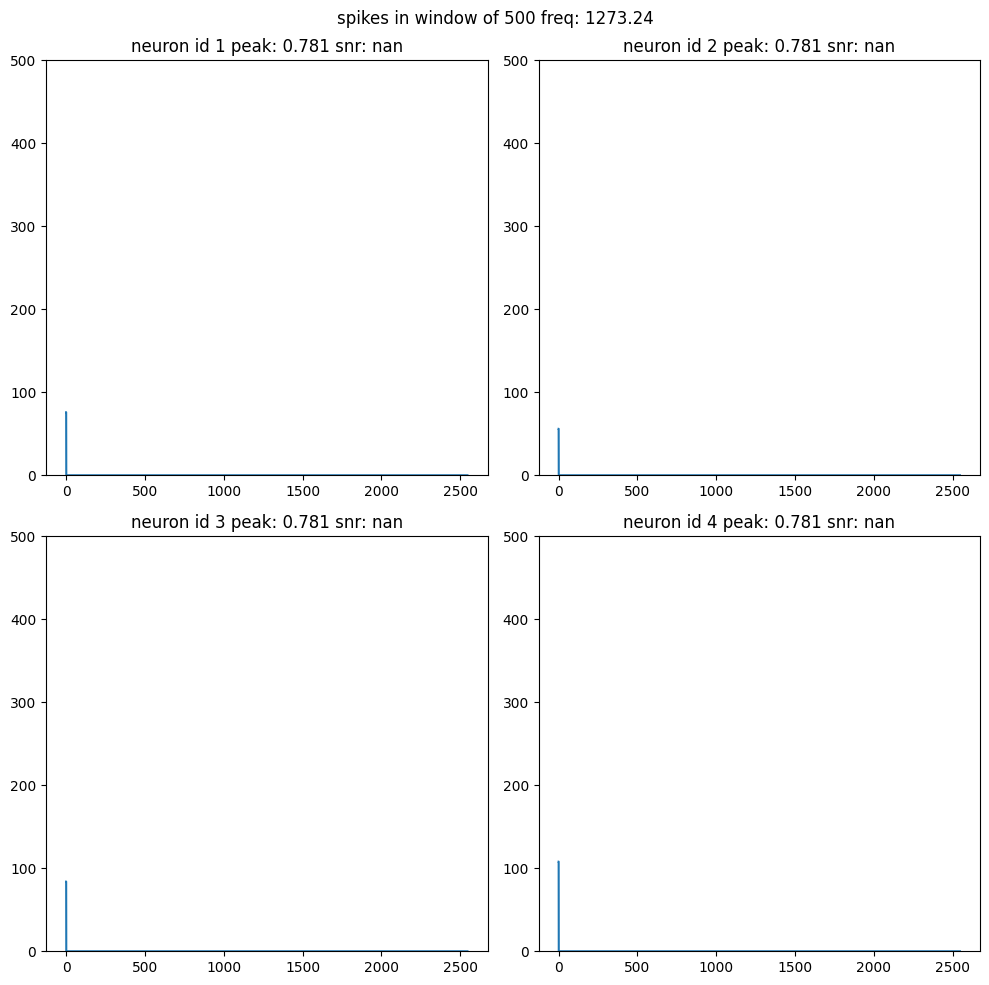

freq0 1091.348181201568
[-63.36968894248927, -151.80279252300028, -69.88553277075016, -39.88650935138287]
[-113.70510360011258, -242.49862820568256, 300.14298734593353, 145.09157898963386, 81.83334283051522]


C:\Users\User\AppData\Local\Temp\ipykernel_19332\1492419683.py:53: RuntimeWarning: invalid value encountered in scalar divide
  snr[nid] = (snr_spikes.max() - snr_spikes.min())/snr_spikes.std()
C:\Users\User\AppData\Local\Temp\ipykernel_19332\1492419683.py:53: RuntimeWarning: invalid value encountered in scalar divide
  snr[nid] = (snr_spikes.max() - snr_spikes.min())/snr_spikes.std()
C:\Users\User\AppData\Local\Temp\ipykernel_19332\1492419683.py:53: RuntimeWarning: invalid value encountered in scalar divide
  snr[nid] = (snr_spikes.max() - snr_spikes.min())/snr_spikes.std()
C:\Users\User\AppData\Local\Temp\ipykernel_19332\1492419683.py:53: RuntimeWarning: invalid value encountered in scalar divide
  snr[nid] = (snr_spikes.max() - snr_spikes.min())/snr_spikes.std()


# 1091.348181201568 ~ peak 0.781 nid 1 snr nan


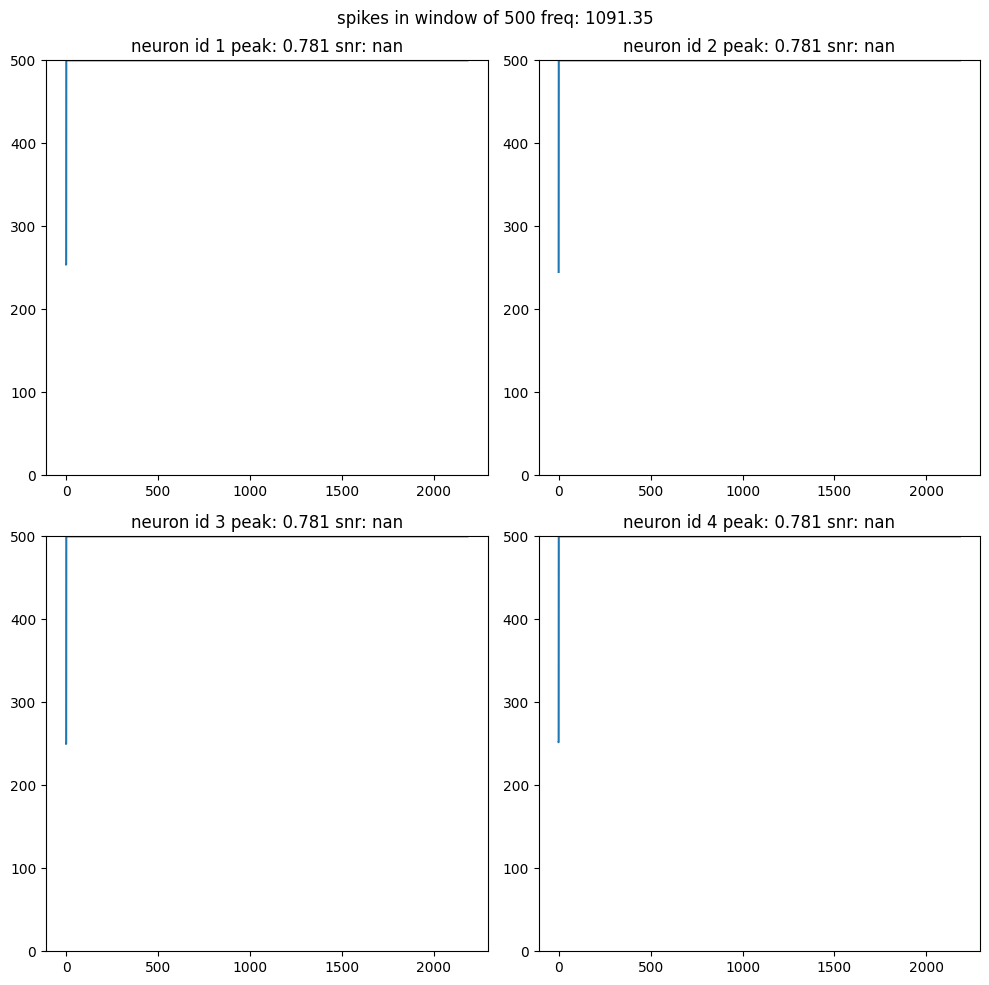

freq0 954.9296585513721
[-34.70072051270997, -99.4531041855755, -55.27110308793262, -22.557450447065328]
[65.0568313142067, -6.978977339196177, 197.32699793830062, 111.68392195332513, 47.67699348410113]
# 954.9296585513721 ~ peak 14.231 nid 4 snr 8.038


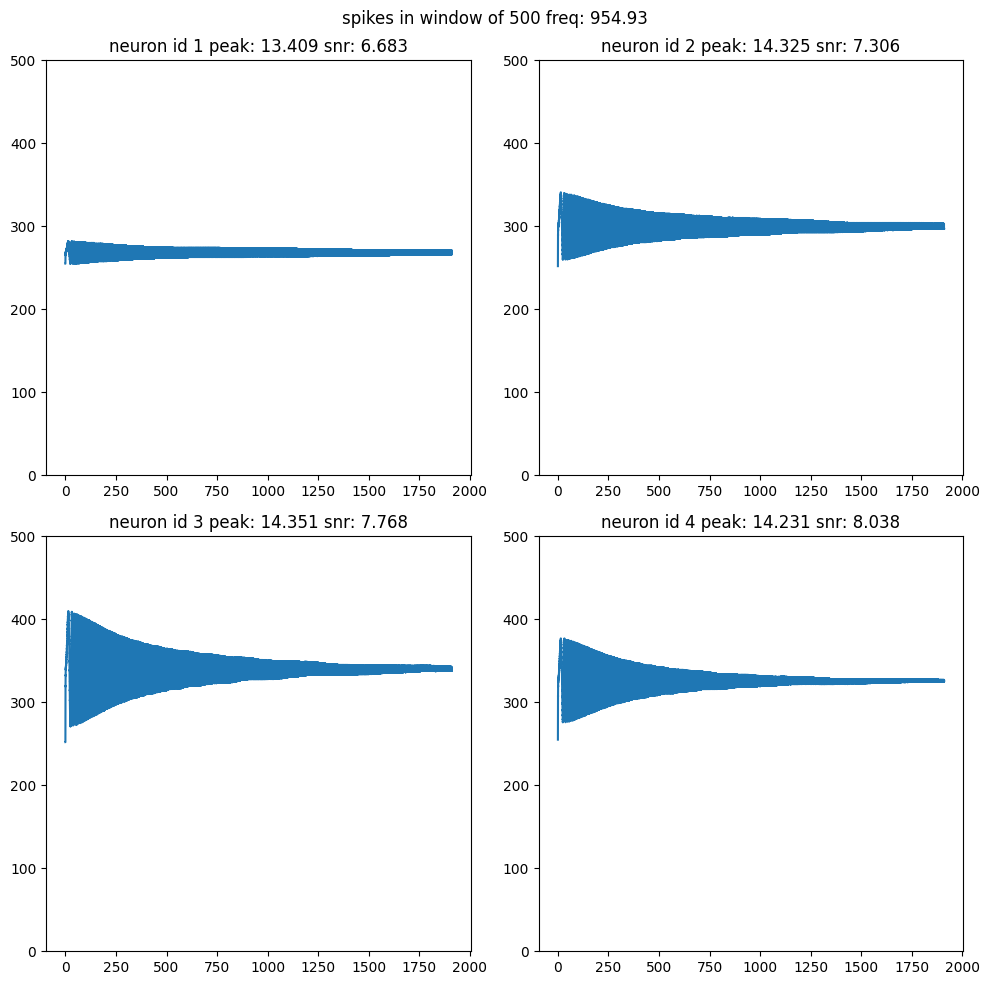

freq0 954.9296585513721
[-34.70072051270997, -99.4531041855755, -55.27110308793262, -22.557450447065328]
[65.0568313142067, -6.978977339196177, 197.32699793830062, 111.68392195332513, 47.67699348410113]
# 954.9296585513721 ~ peak 14.231 nid 4 snr 8.038


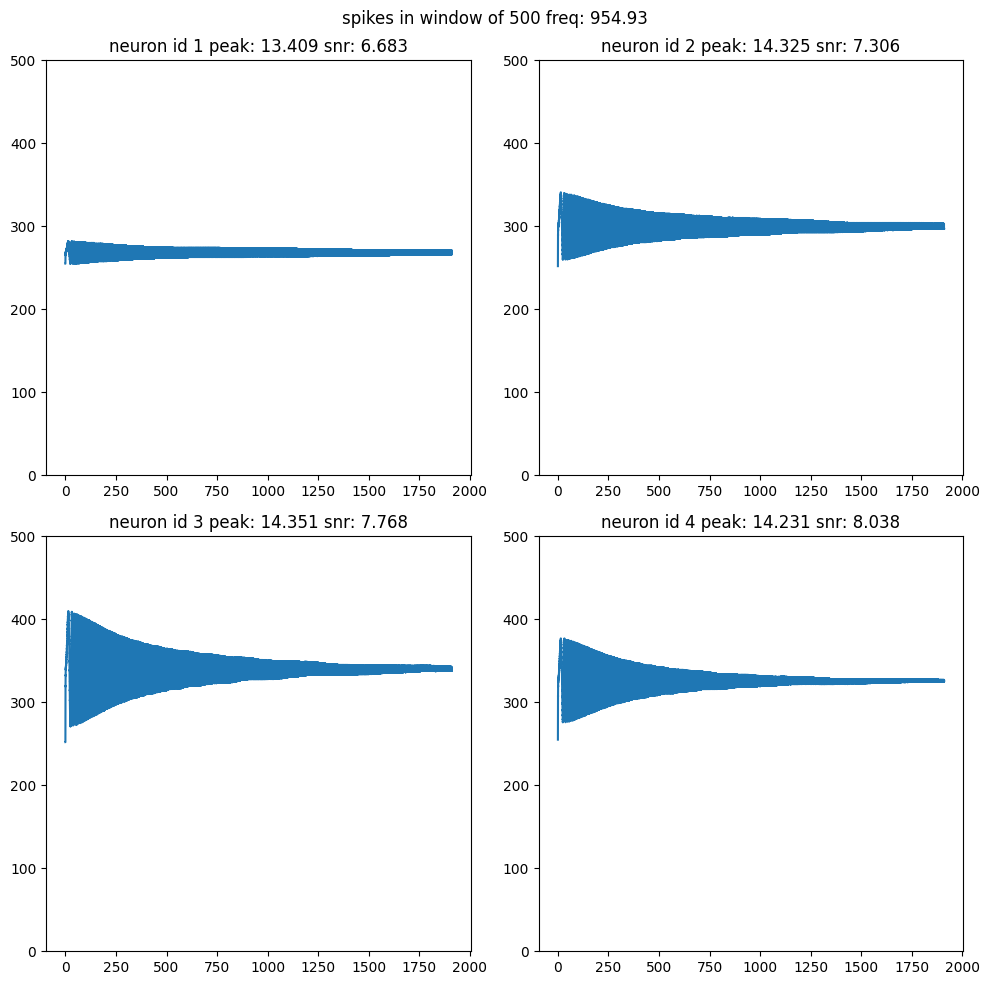

freq0 763.9437268410976
[-17.18896321478423, -58.85169010454095, -38.47909491103431, -12.530489235833587]
[153.4471080663688, 116.89093800282174, 117.03688039425256, 76.94326806784838, 26.858989467823047]
# 763.9437268410976 ~ peak 758.561 nid 1 snr 11.472


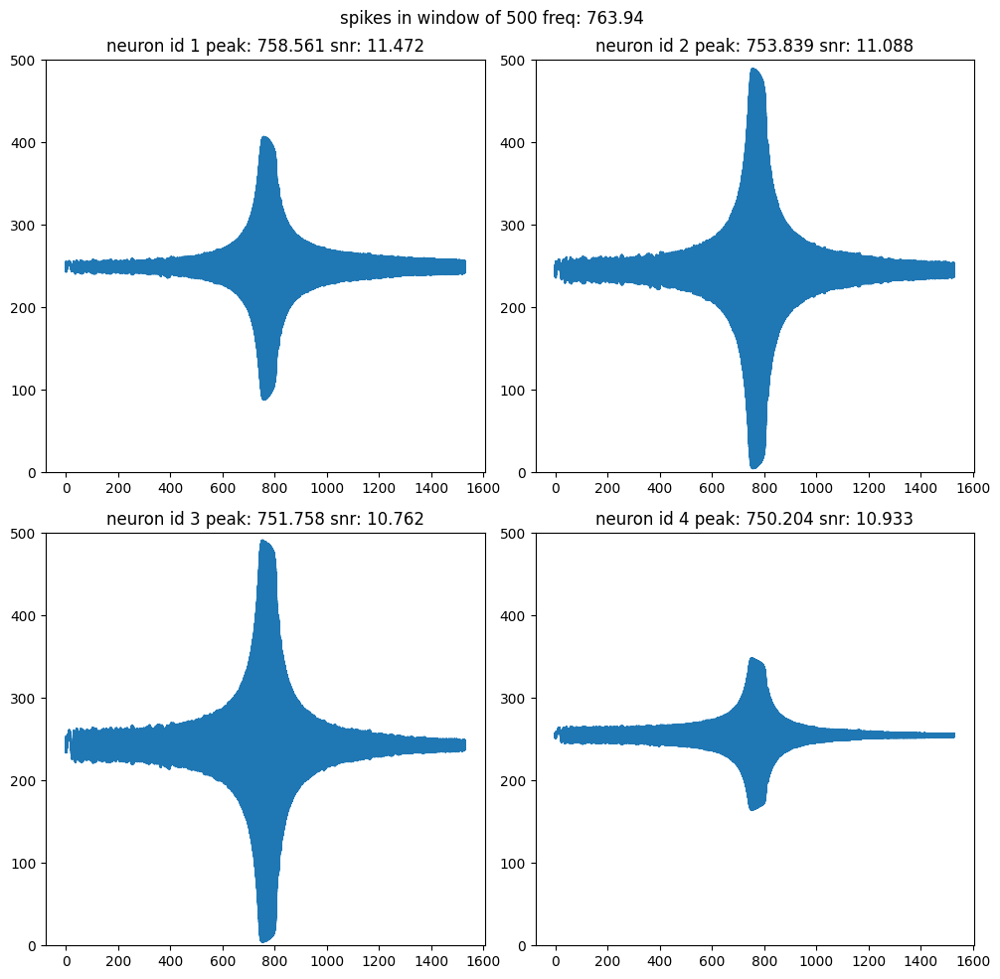

freq0 694.4942971282707
[-14.307272680397578, -49.68619202676013, -33.37140961735925, -11.136948713888398]
[156.005261137806, 125.52341694829555, 98.81150668919318, 66.8782924179898, 23.715981832291483]
# 694.4942971282707 ~ peak 692.404 nid 1 snr 11.528


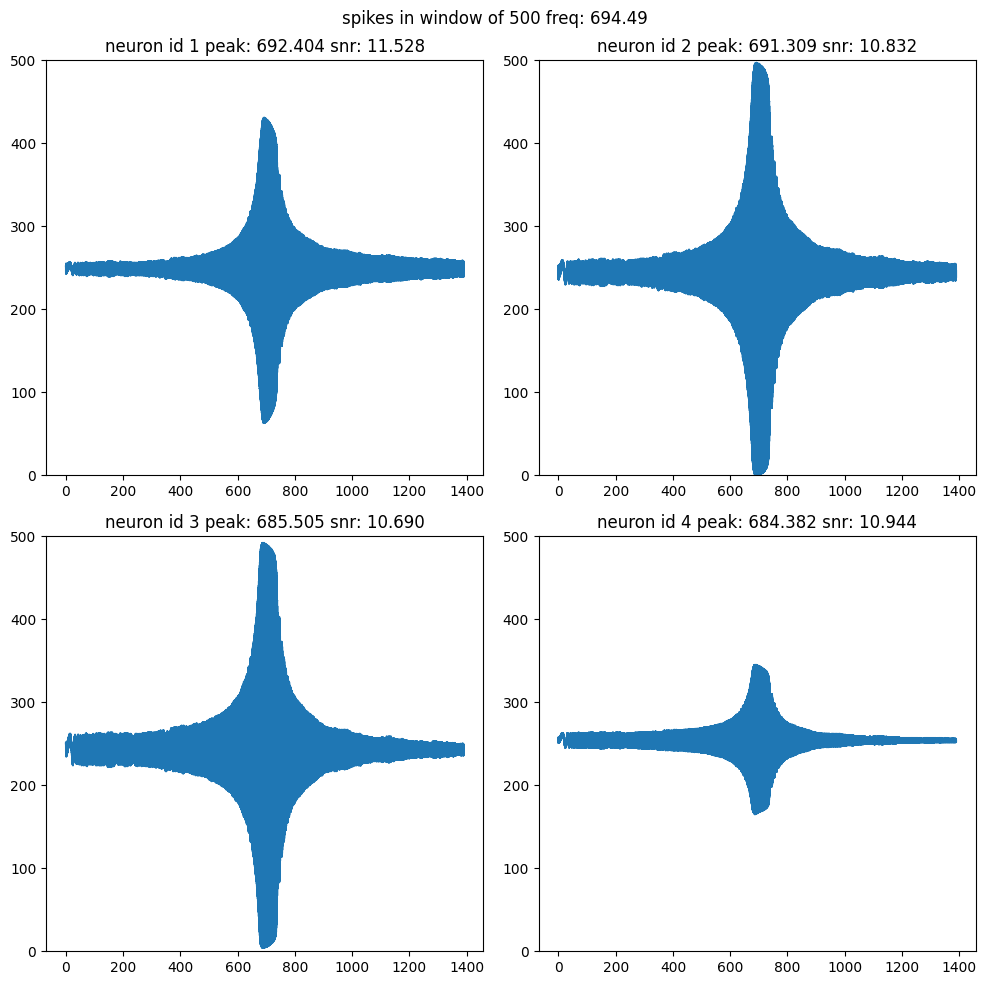

freq0 636.6197723675814
[-12.579103620541291, -43.365930965200484, -29.489727538634575, -10.420511481614167]
[150.66071998782377, 123.90145167013148, 86.2297029824752, 59.29131553885446, 22.028362749793]
# 636.6197723675814 ~ peak 633.872 nid 1 snr 11.603


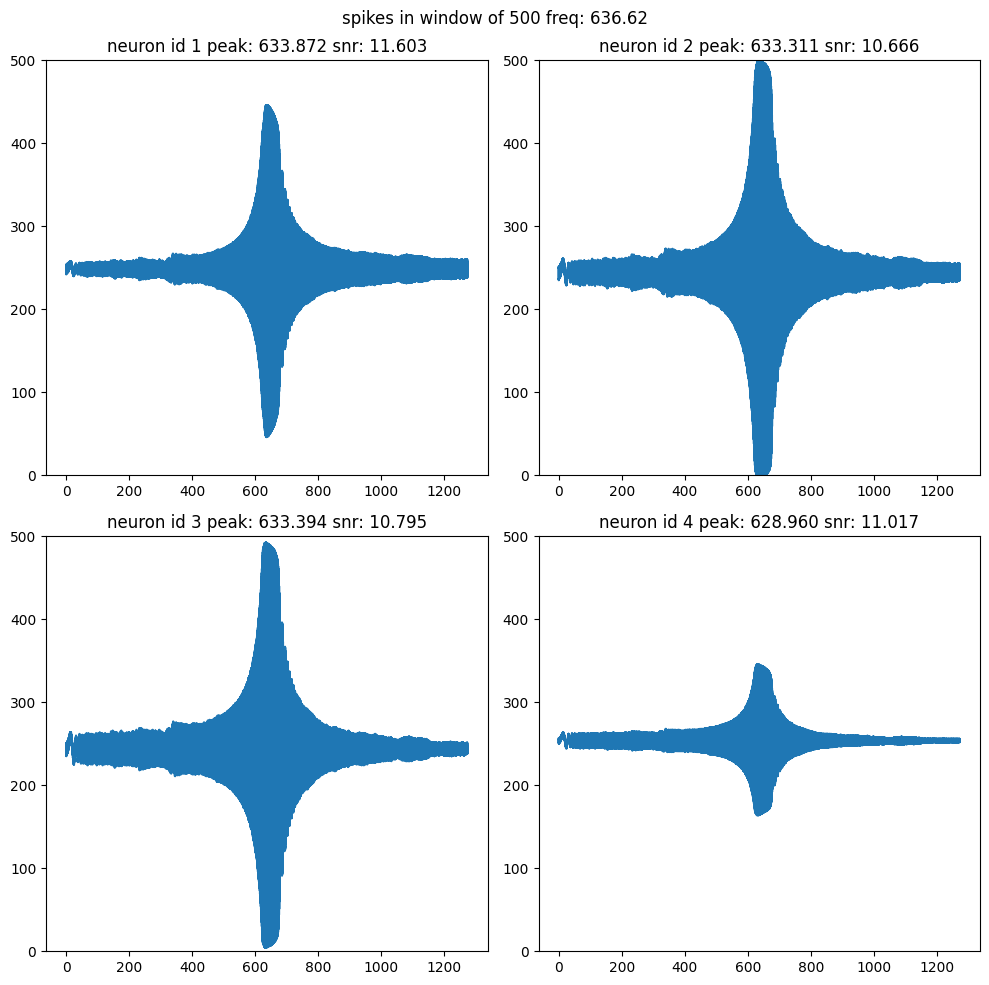

freq0 587.6490206469981
[-11.381174247112208, -38.669132900845796, -26.454993340486553, -9.98751837097181]
[142.2936397873392, 118.14662600908686, 76.88141607841624, 53.35993026719709, 20.992992659647975]
# 587.6490206469981 ~ peak 588.057 nid 1 snr 11.756


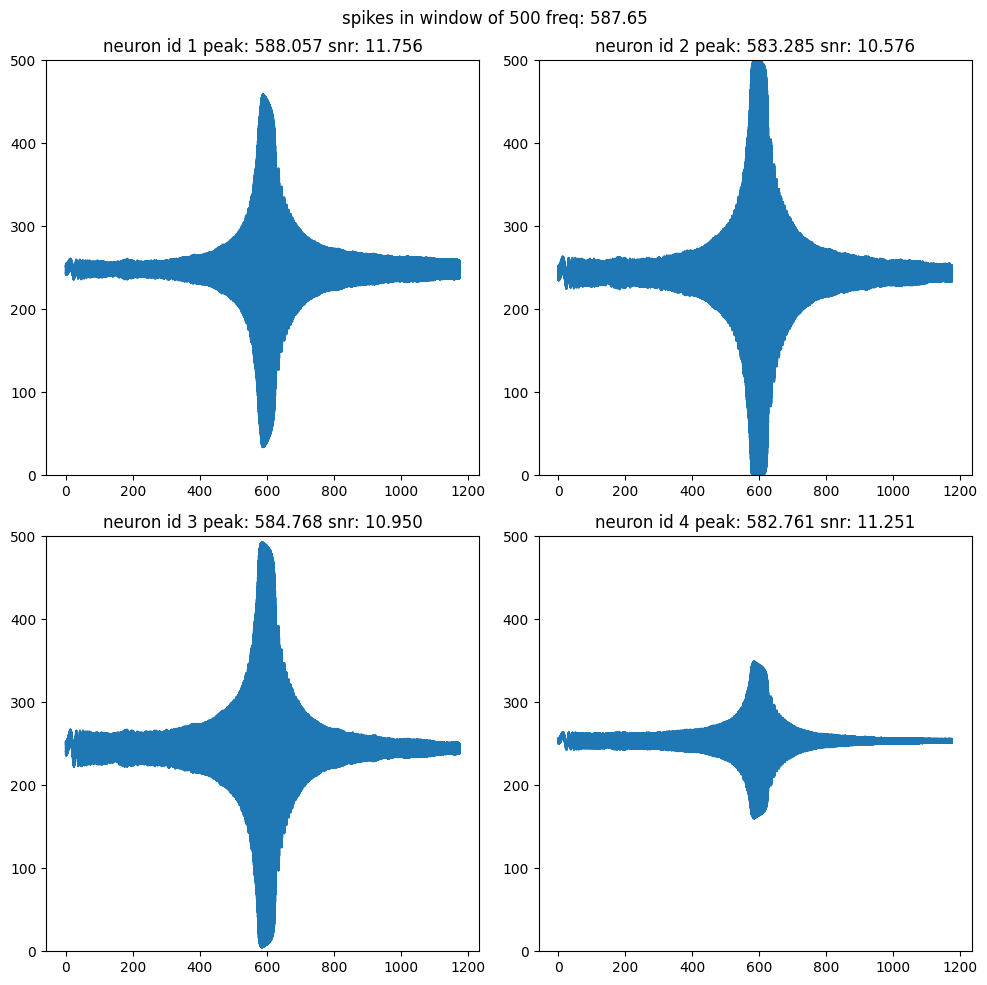

freq0 545.674090600784
[-10.444985918749985, -34.977659881884, -24.024622679070603, -9.670768405735911]
[133.09539864641286, 110.99356298550003, 69.54119453167829, 48.588969131993125, 20.25353507271294]
# 545.674090600784 ~ peak 547.173 nid 1 snr 11.750


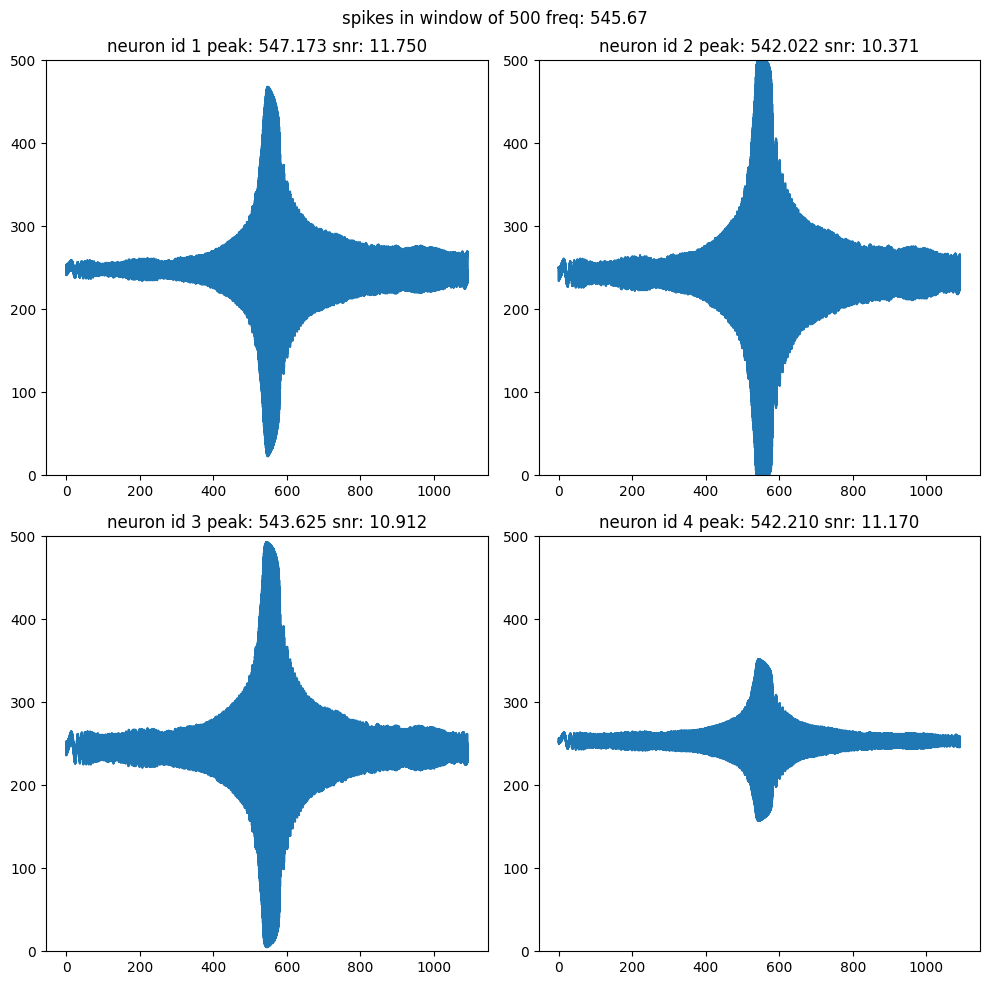

freq0 509.2958178940651
[-9.651839622529554, -31.956869550066436, -22.037840724984495, -9.399464612862108]
[124.04129477702236, 103.66337549523456, 63.54242107050847, 44.66358482203406, 19.64944449752202]
# 509.2958178940651 ~ peak 508.509 nid 2 snr 7.574


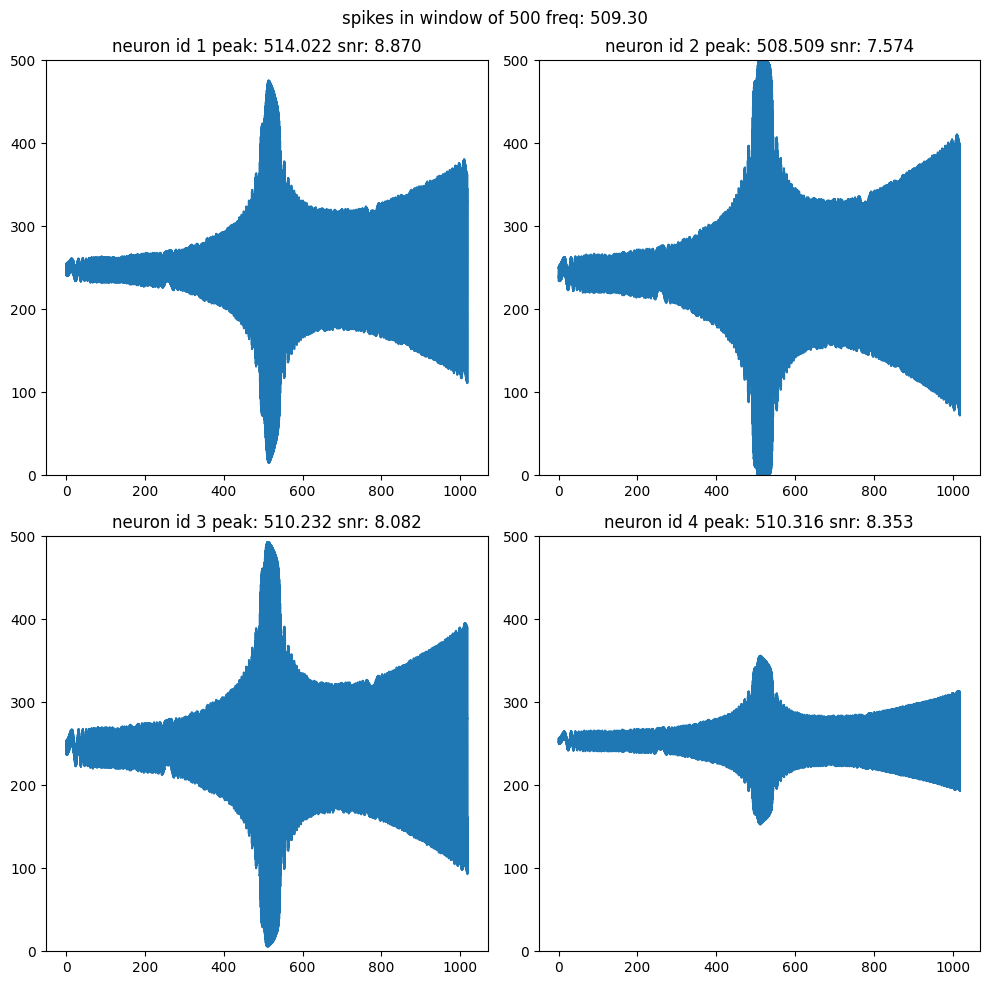

freq0 477.46482927568604
[-8.94812937255092, -29.413324698461743, -20.384763948035072, -9.144739487041551]
[115.54077813828775, 96.68042691890894, 58.49815296253728, 41.374247652716306, 19.108601051818198]
# 477.46482927568604 ~ peak 478.536 nid 1 snr 6.018


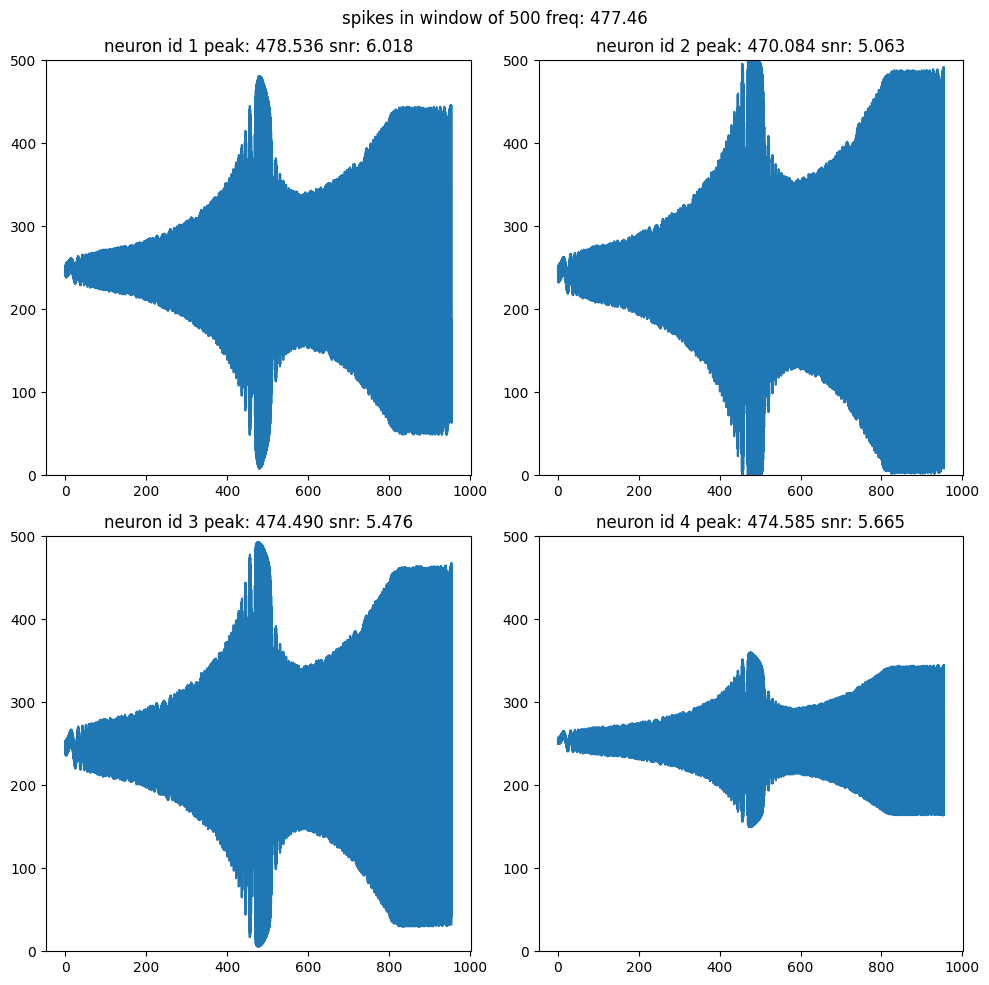

freq0 449.37866284770445
[-8.309008737390332, -27.22789799313323, -18.988222101189404, -8.896012149231495]
[107.7367668410228, 90.24361752660381, 54.169345255387334, 38.576069654822376, 18.59950147317856]
# 449.37866284770445 ~ peak 448.278 nid 2 snr 5.669


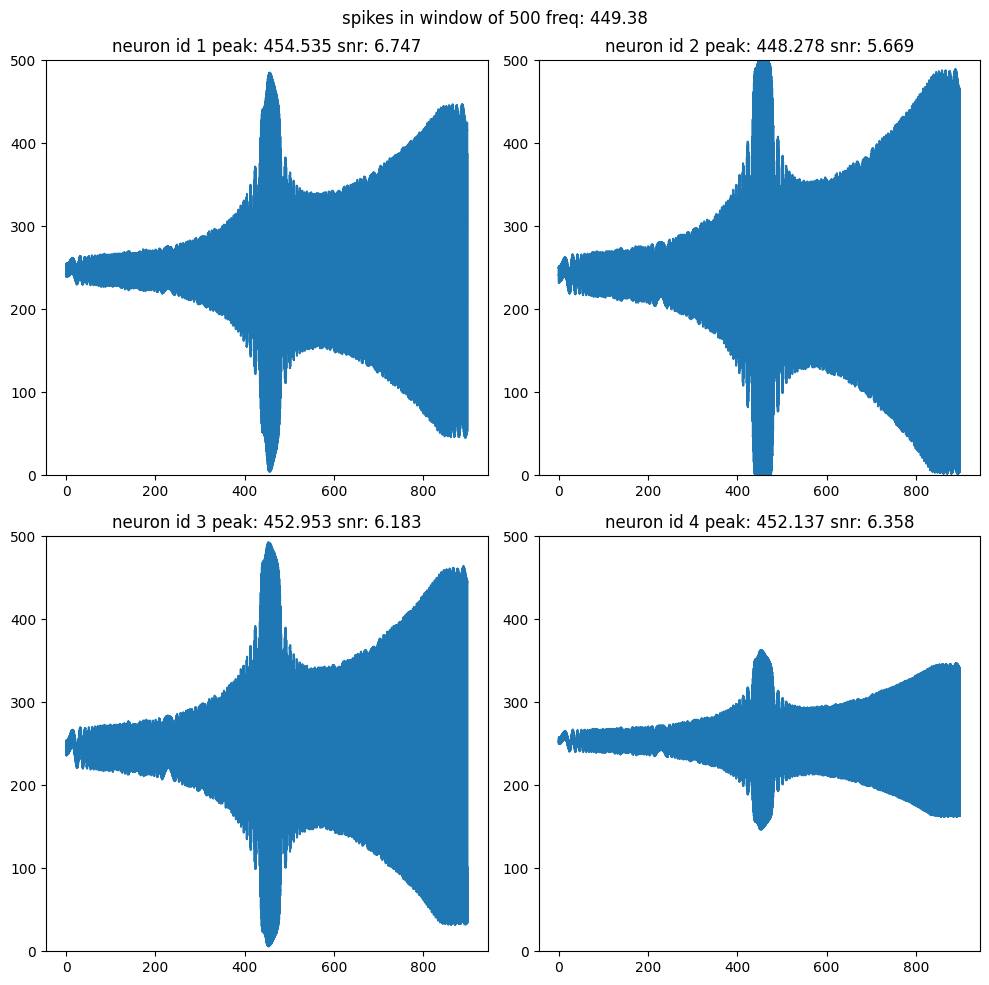

freq0 449.37866284770445
[-8.309008737390332, -27.22789799313323, -18.988222101189404, -8.896012149231495]
[107.7367668410228, 90.24361752660381, 54.169345255387334, 38.576069654822376, 18.59950147317856]
# 449.37866284770445 ~ peak 448.278 nid 2 snr 5.669


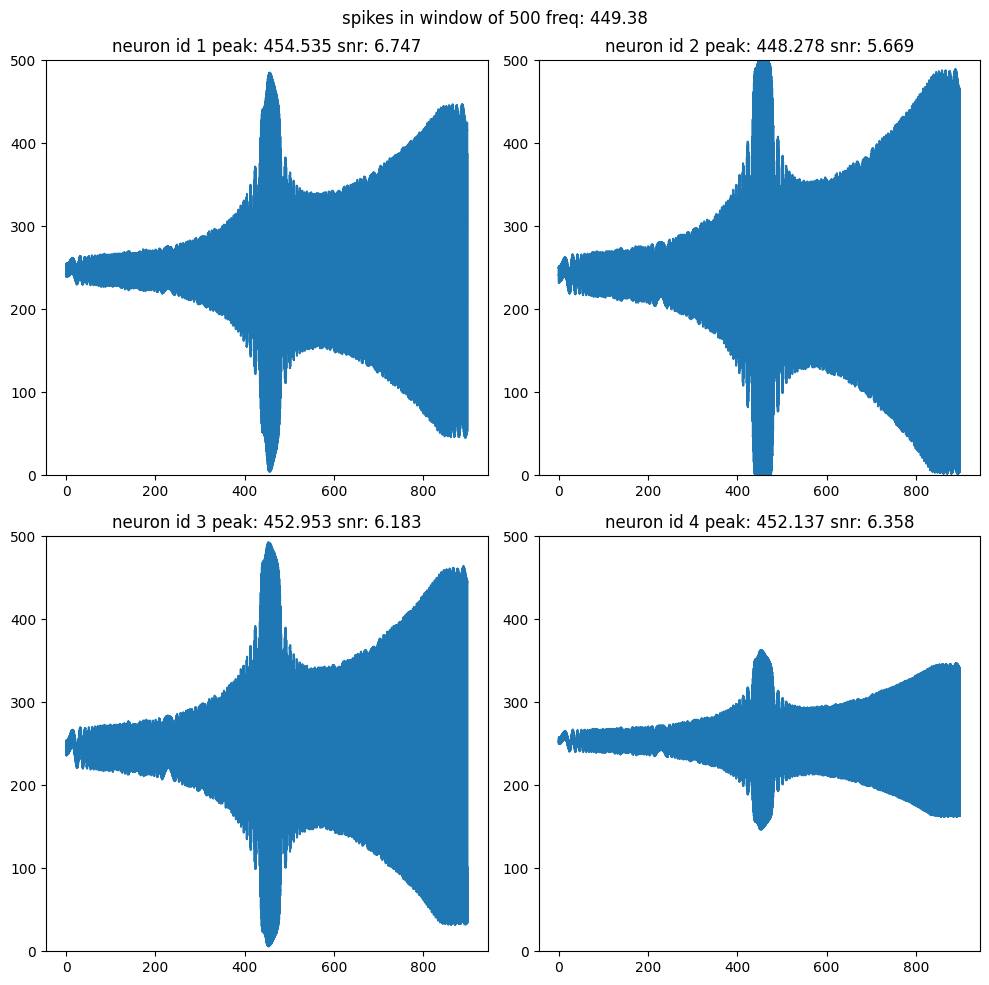

freq0 402.0756457058409
[-7.181822960804485, -23.643920211194697, -16.75737123884708, -8.408473877413076]
[94.23661555101366, 79.13065738425226, 47.08013366418172, 34.06674930503552, 17.633712748061438]
# 402.0756457058409 ~ peak 401.199 nid 2 snr 10.074


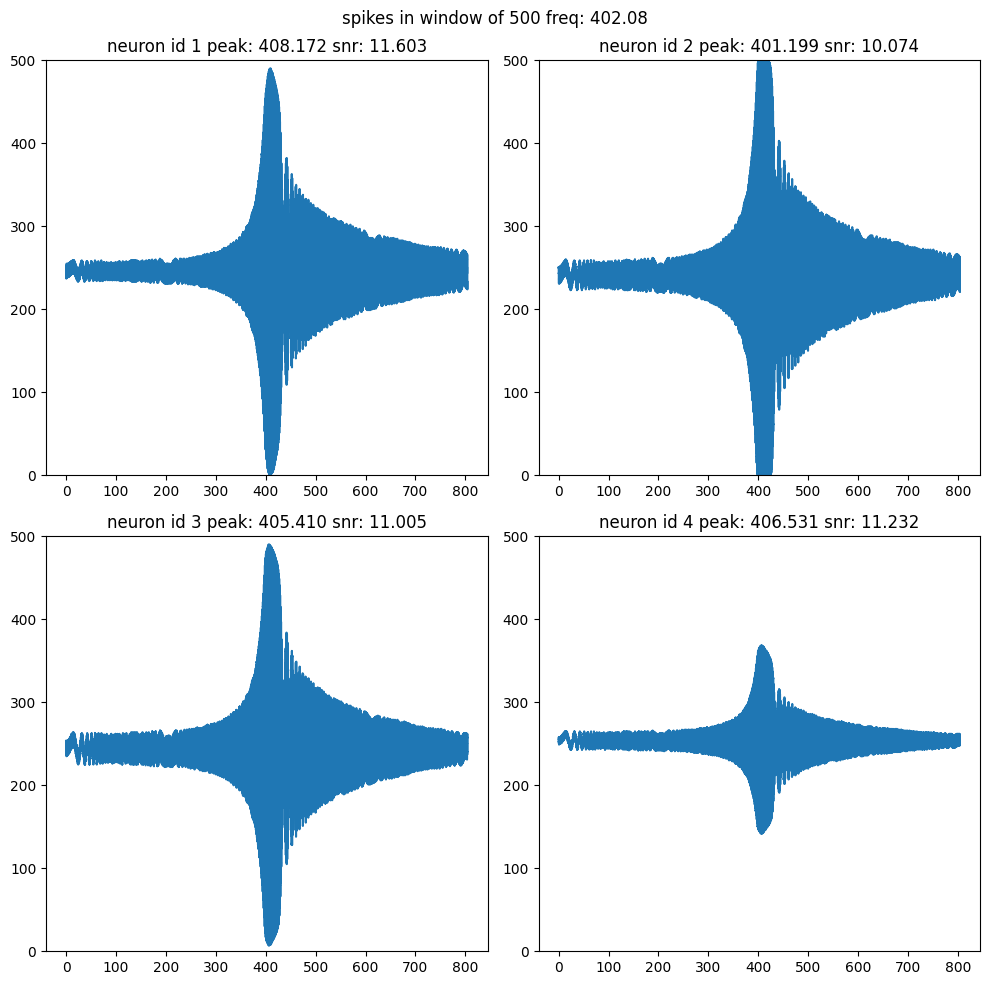

freq0 381.9718634205488
[-6.683241819725314, -22.152593009726427, -15.851663320954128, -8.171262403943386]
[88.44426355914416, 74.38591411359103, 44.1331824581097, 32.22251016547919, 17.17187654505906]
# 381.9718634205488 ~ peak 380.741 nid 2 snr 10.532


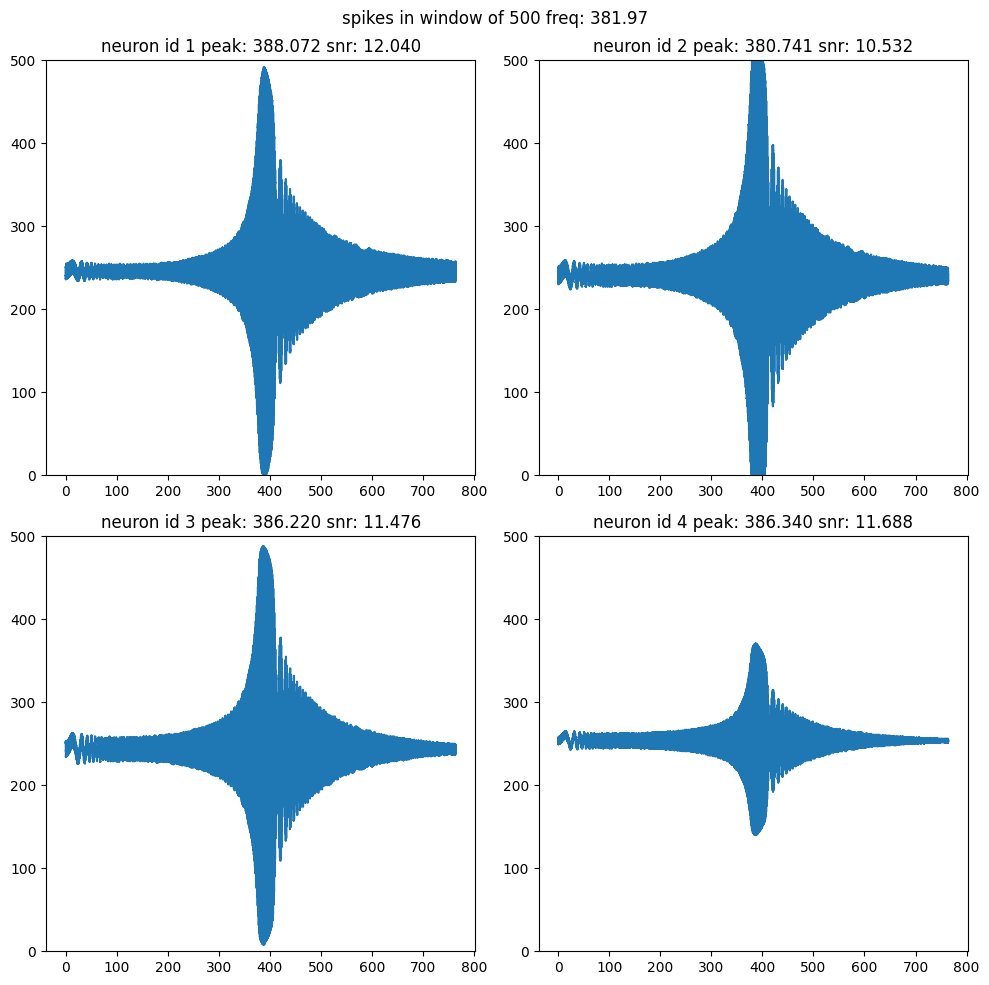

freq0 363.78272706718934
[-6.223603142104653, -20.819304557516443, -15.05224806637936, -7.9402758066184465]
[83.2058664968958, 70.10969439300366, 41.49953444706797, 30.589029767138804, 16.724401971931346]
# 363.78272706718934 ~ peak 363.554 nid 2 snr 10.730


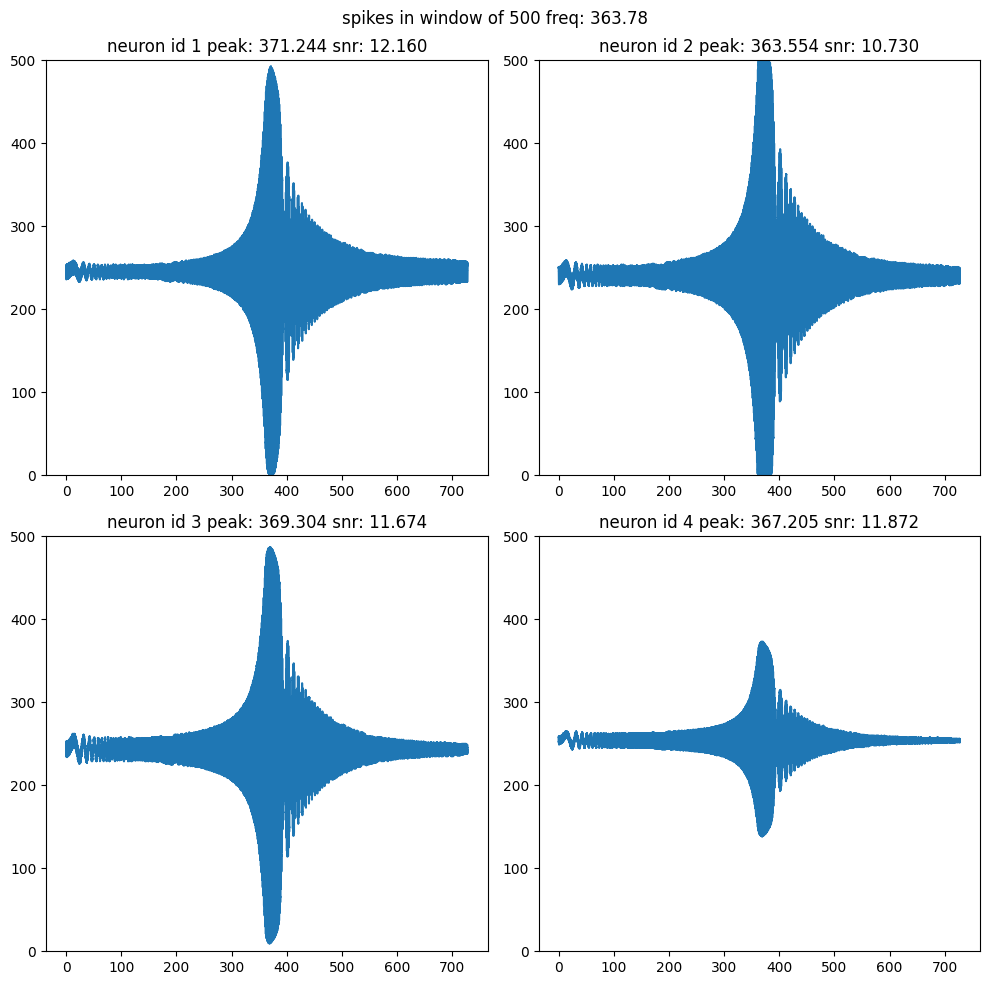

freq0 347.24714856413533
[-5.800258366528324, -19.621120493233384, -14.341058720852017, -7.716708727880805]
[78.45848395776262, 66.24598374121433, 39.133262370151115, 29.13209651235984, 16.292191560292896]
# 347.24714856413533 ~ peak 347.830 nid 2 snr 10.845


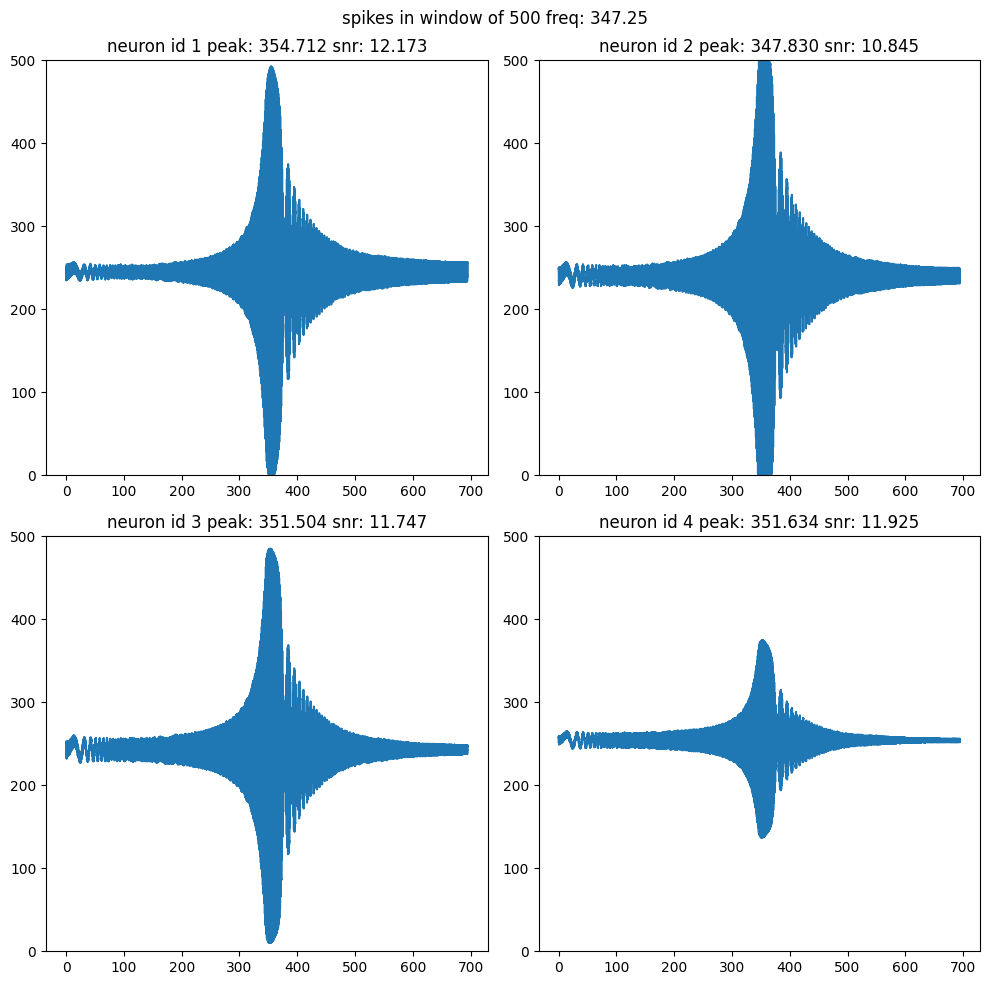

freq0 332.14944645265115
[-5.410723637433474, -18.539677075861057, -13.703900147691197, -7.50143471890666]
[74.14432408939551, 62.74319711588515, 36.99767883690424, 27.8245836942675, 15.876037319210427]
# 332.14944645265115 ~ peak 332.543 nid 2 snr 10.962


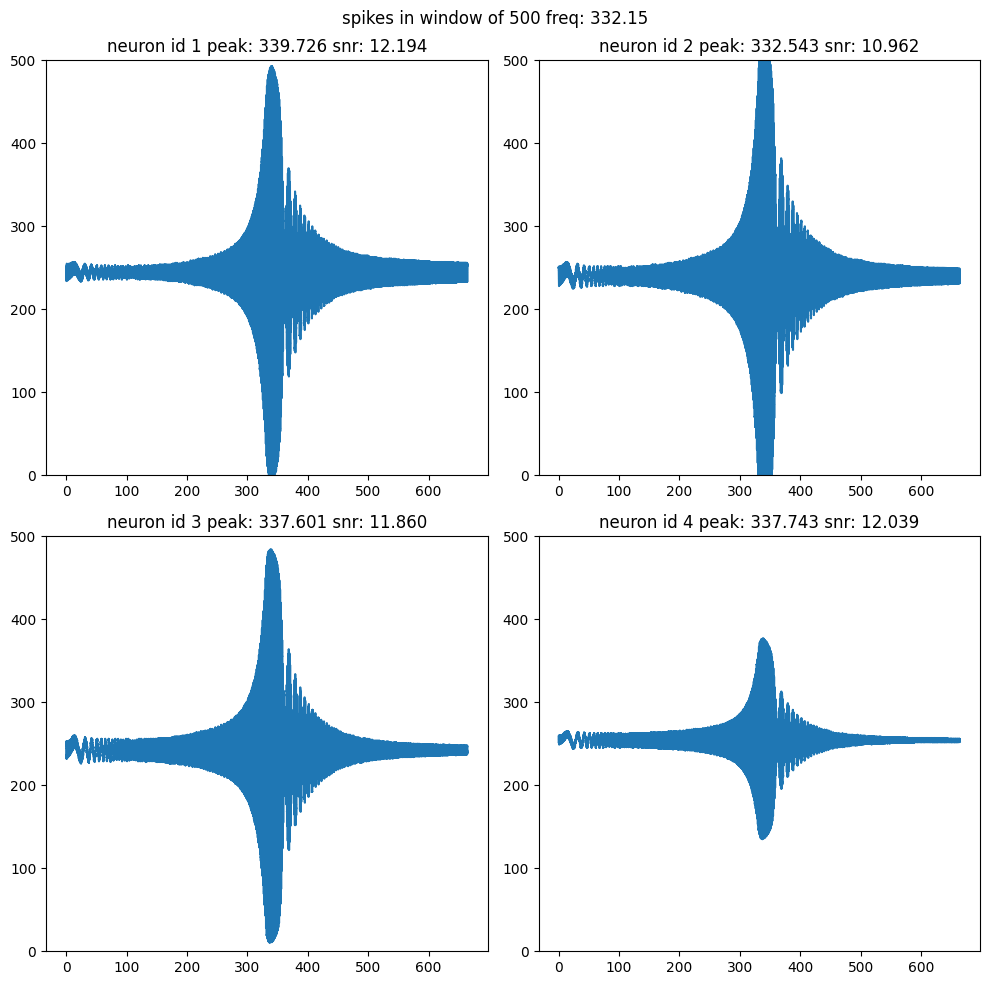

freq0 318.3098861837907
[-5.052604314693697, -17.55996050005695, -13.12947401699005, -7.2950133848638785]
[70.21183918409558, 59.555523335837535, 35.06286120736199, 26.644688908092476, 15.476467790831087]
# 318.3098861837907 ~ peak 320.315 nid 2 snr 11.061


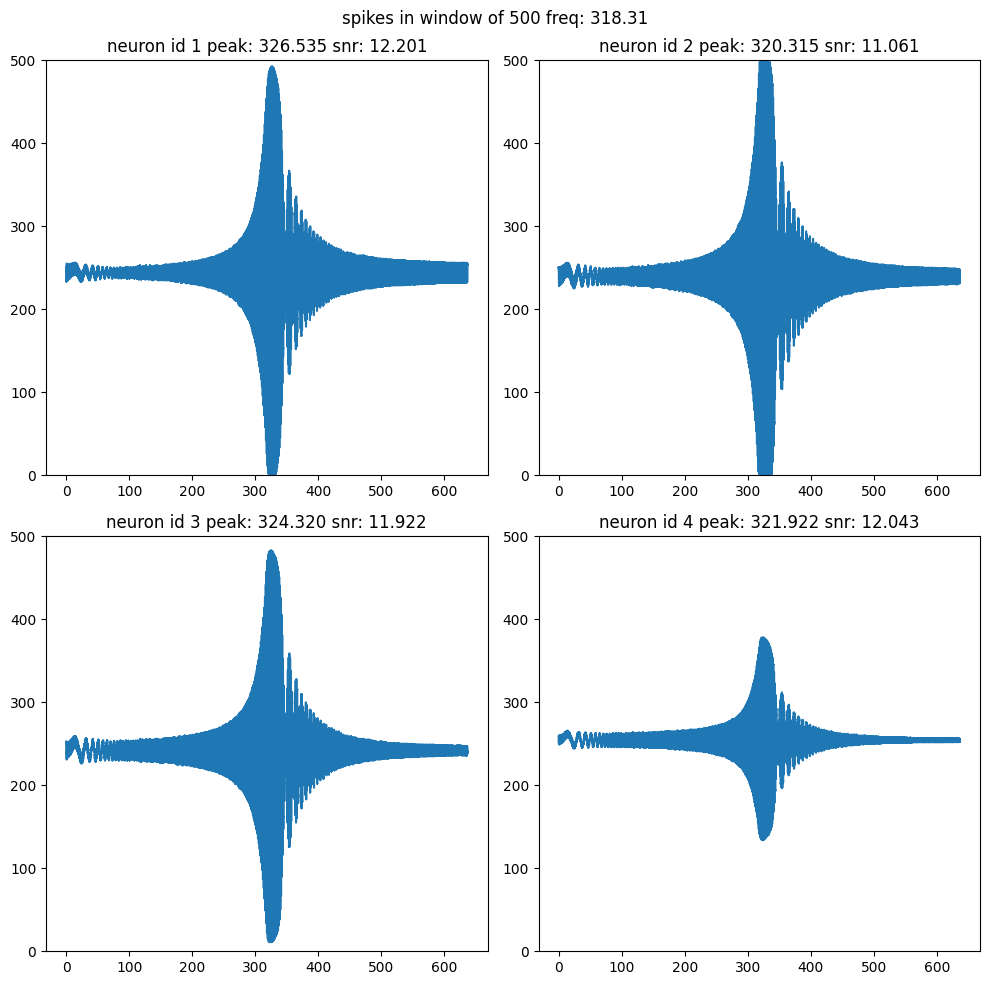

freq0 305.577490736439
[-4.723584584143962, -16.669492747282863, -12.608680991969454, -7.097736086087659]
[66.61577100634281, 56.643063974540425, 33.30399811278097, 25.574677559646858, 15.093723401153254]
# 305.577490736439 ~ peak 307.584 nid 2 snr 11.139


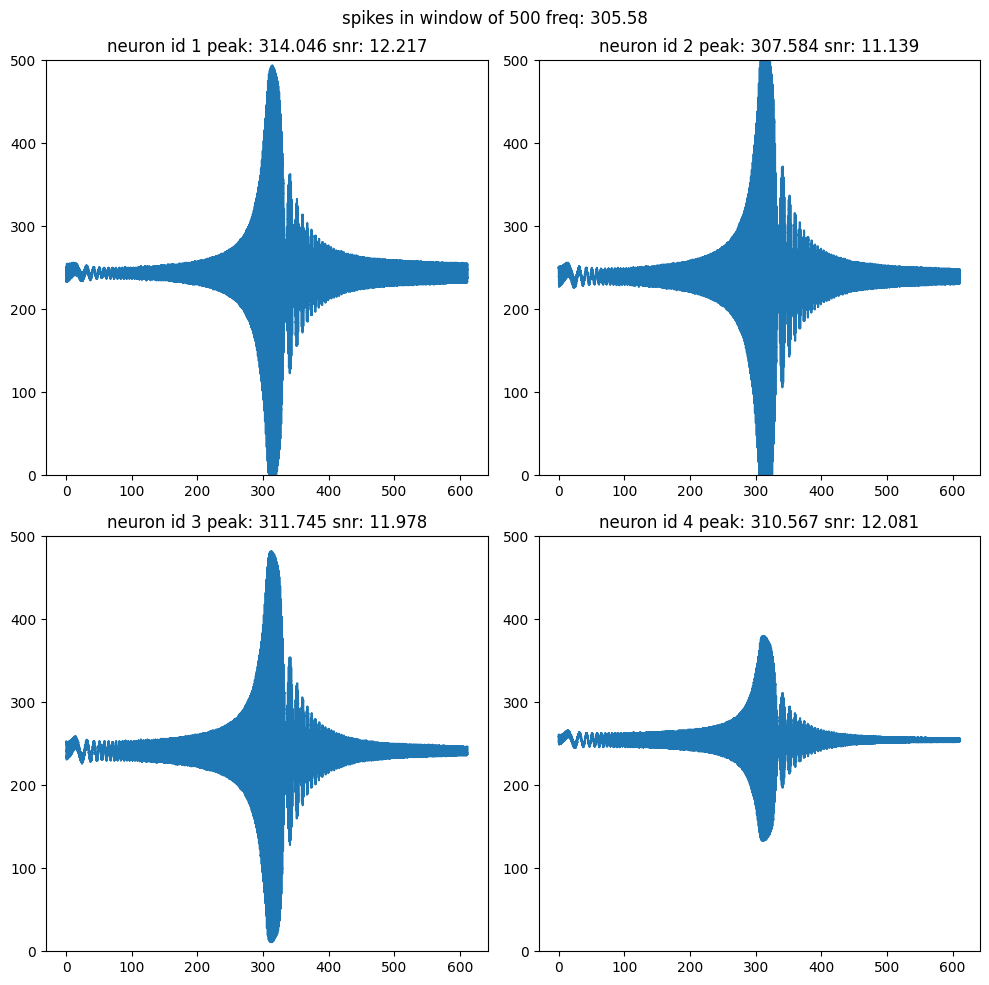

freq0 293.82451032349906
[-4.421439478551577, -15.857767929966148, -12.134113296474943, -6.9096808091985125]
[63.316719439266606, 53.97143198431944, 31.700244123452563, 24.59996889988445, 14.727785756330036]
# 293.82451032349906 ~ peak 297.028 nid 2 snr 11.211


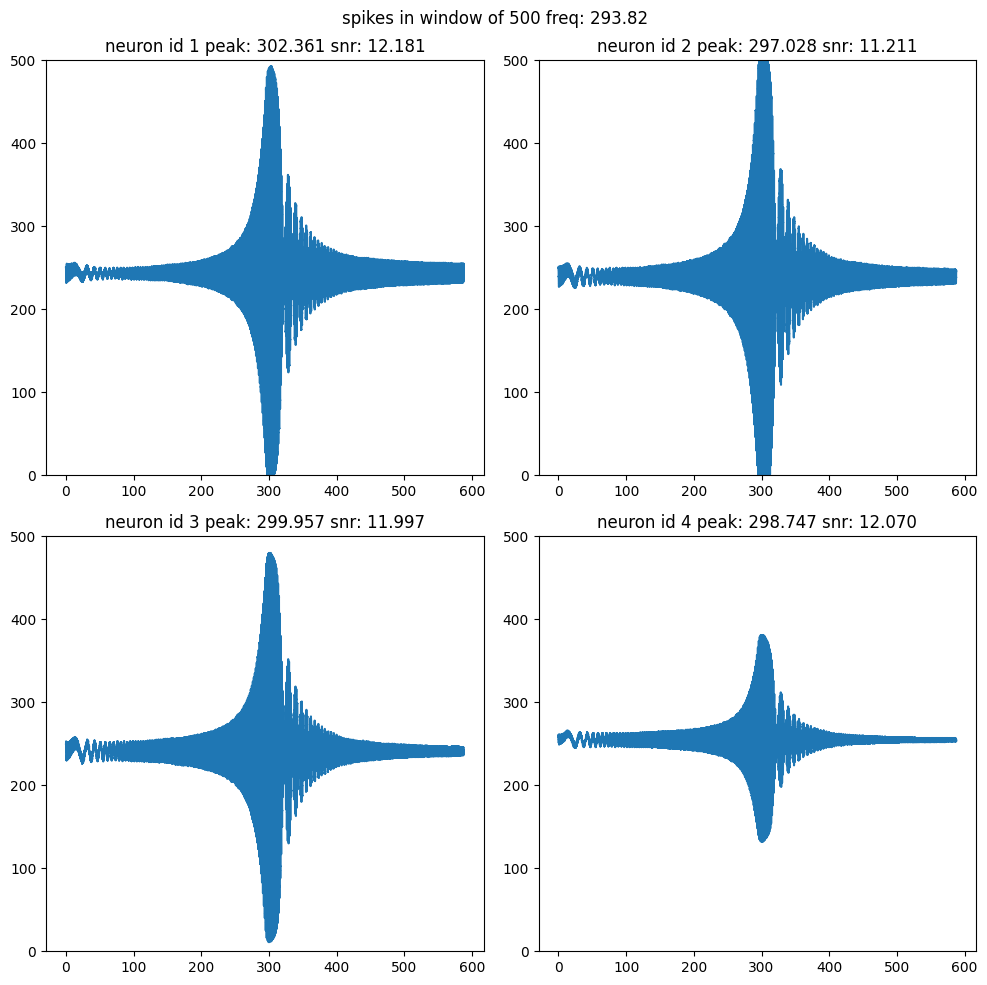

freq0 293.82451032349906
[-4.421439478551577, -15.857767929966148, -12.134113296474943, -6.9096808091985125]
[63.316719439266606, 53.97143198431944, 31.700244123452563, 24.59996889988445, 14.727785756330036]
# 293.82451032349906 ~ peak 297.028 nid 2 snr 11.211


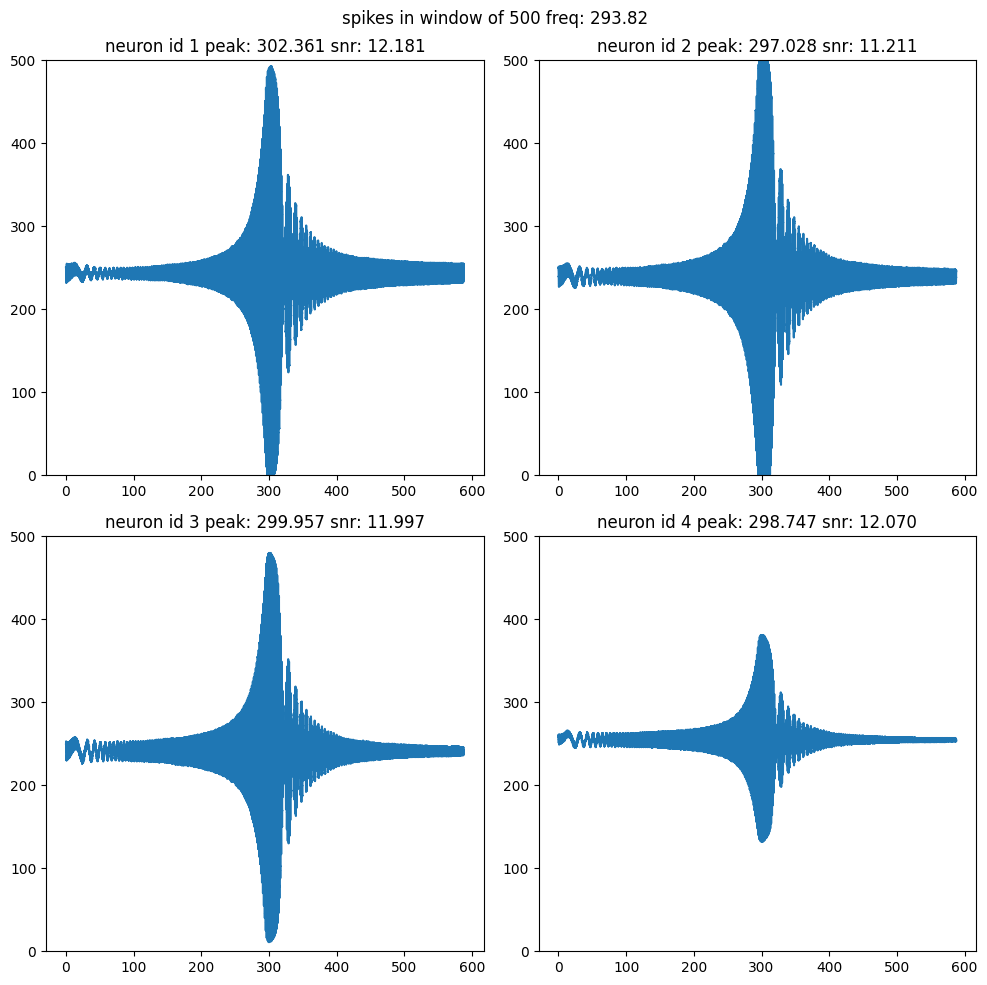

freq0 272.837045300392
[-3.889421216804014, -14.436066882009127, -11.300328853545157, -6.560783778924386]
[57.47762615921019, 49.236971826263954, 28.889805957403528, 22.890016467790574, 14.045250542565746]
# 272.837045300392 ~ peak 277.576 nid 2 snr 11.373


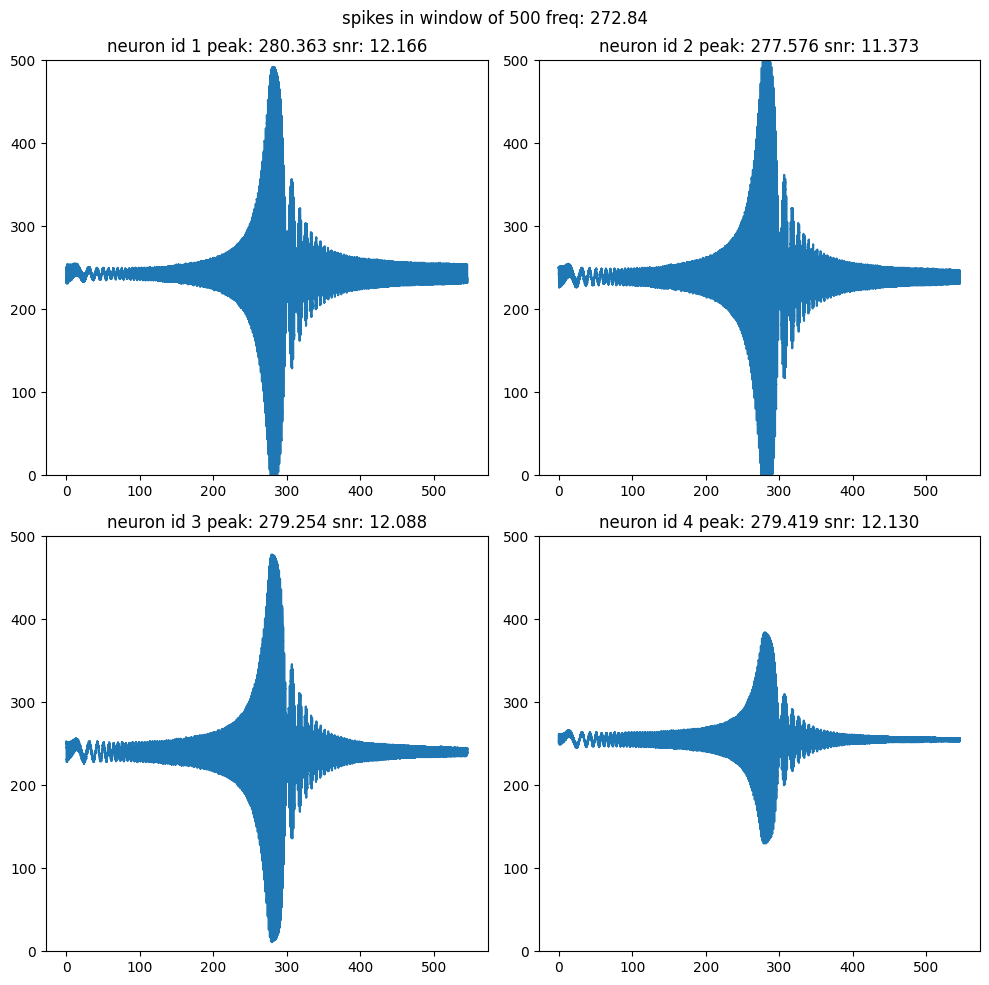

freq0 263.4288713245164
[-3.655680554631091, -13.811799437738394, -10.931830919178836, -6.399457199317189]
[54.88241582874714, 47.127323753171474, 27.65488737226298, 22.1360876636473, 13.72775316629858]
# 263.4288713245164 ~ peak 268.827 nid 2 snr 11.444


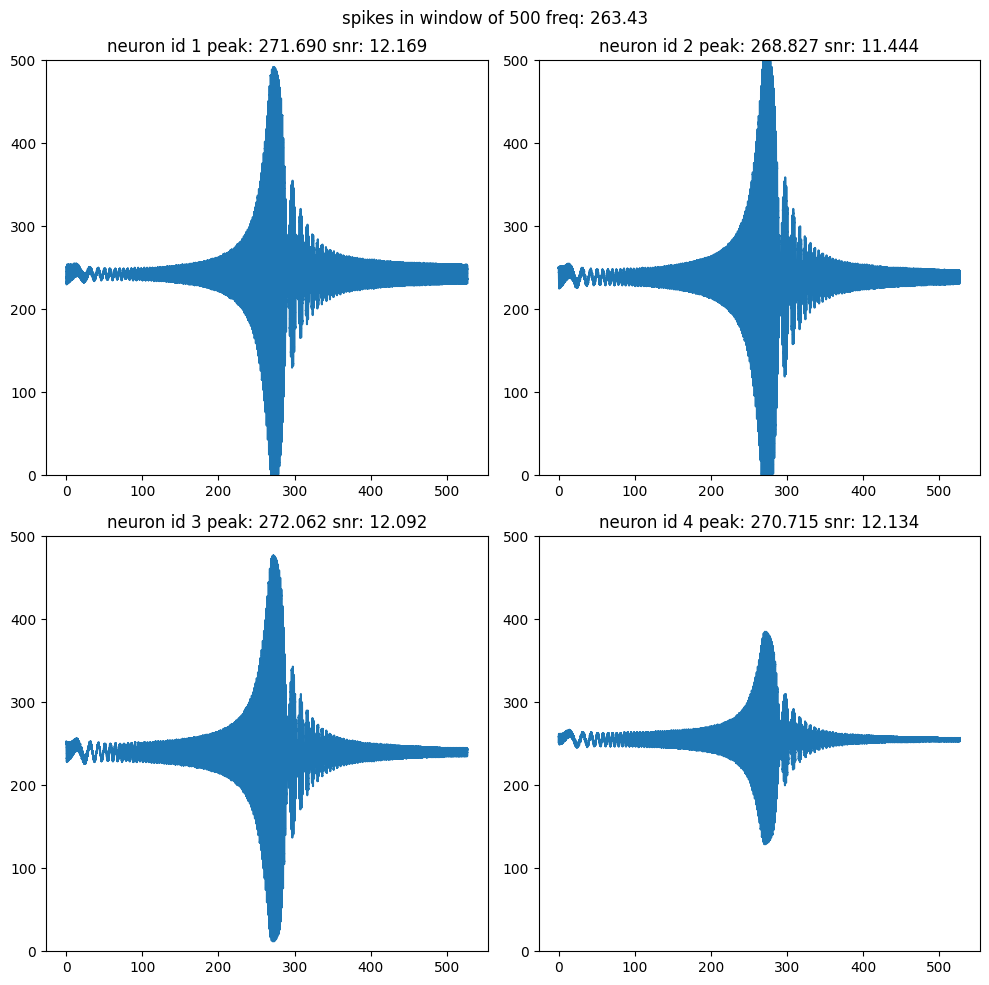

freq0 254.64790894703256
[-3.441091022716662, -13.23729070420946, -10.590621813241896, -6.246446408709179]
[52.47270092423985, 45.16369540003733, 26.517796680129358, 21.439405710355746, 13.425344745416098]
# 254.64790894703256 ~ peak 261.311 nid 2 snr 11.537


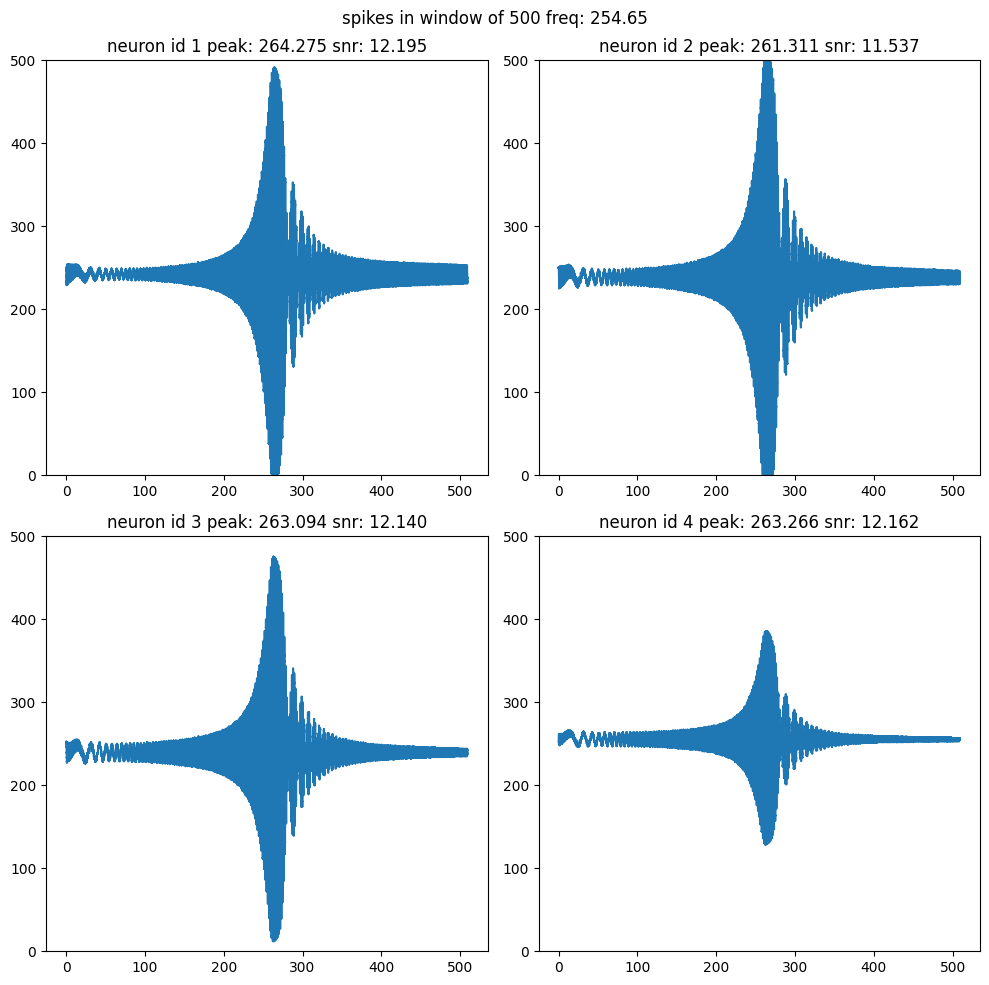

freq0 254.64790894703256
[-3.441091022716662, -13.23729070420946, -10.590621813241896, -6.246446408709179]
[52.47270092423985, 45.16369540003733, 26.517796680129358, 21.439405710355746, 13.425344745416098]
# 254.64790894703256 ~ peak 261.311 nid 2 snr 11.537


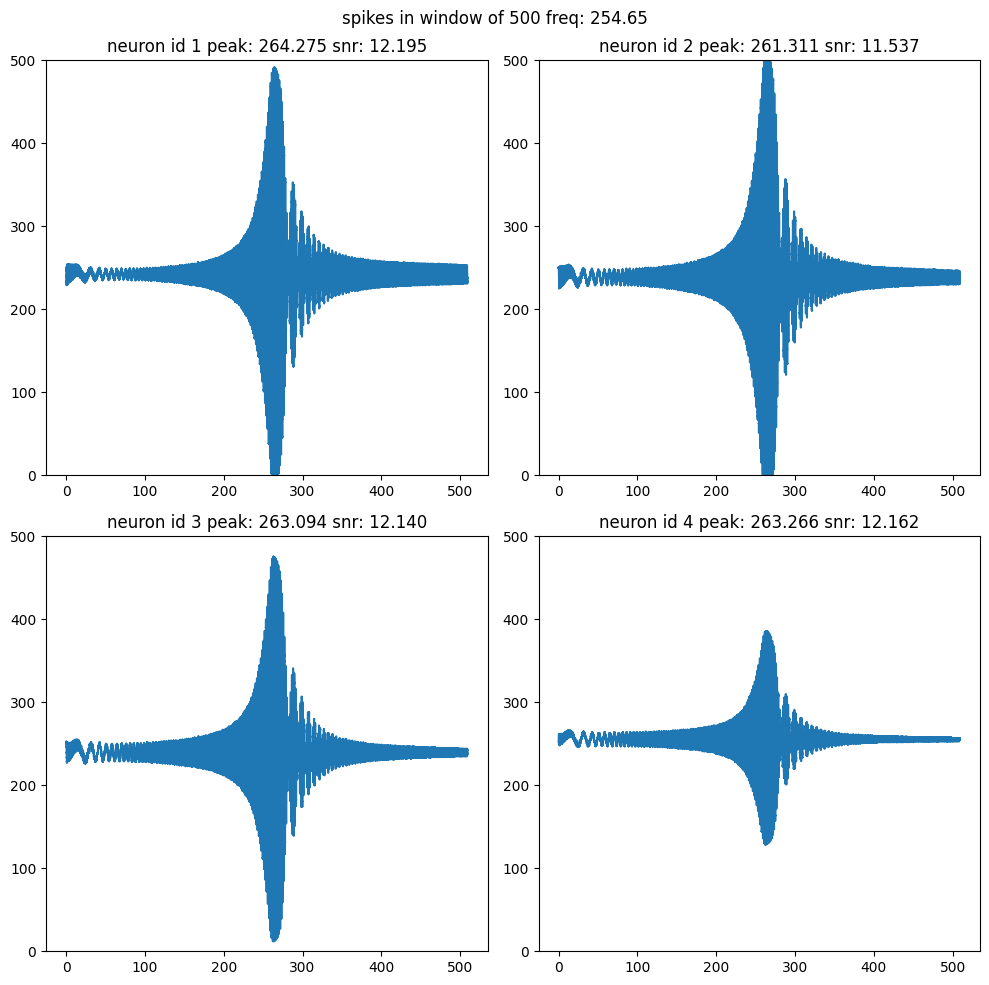

freq0 238.73241463784302
[-3.0630646872518925, -12.218062974297348, -9.978400991144138, -5.963872243504667]
[48.13511615285549, 41.613110029508185, 24.4987304160001, 20.193781138760418, 12.863214511073235]
# 238.73241463784302 ~ peak 247.219 nid 2 snr 11.717


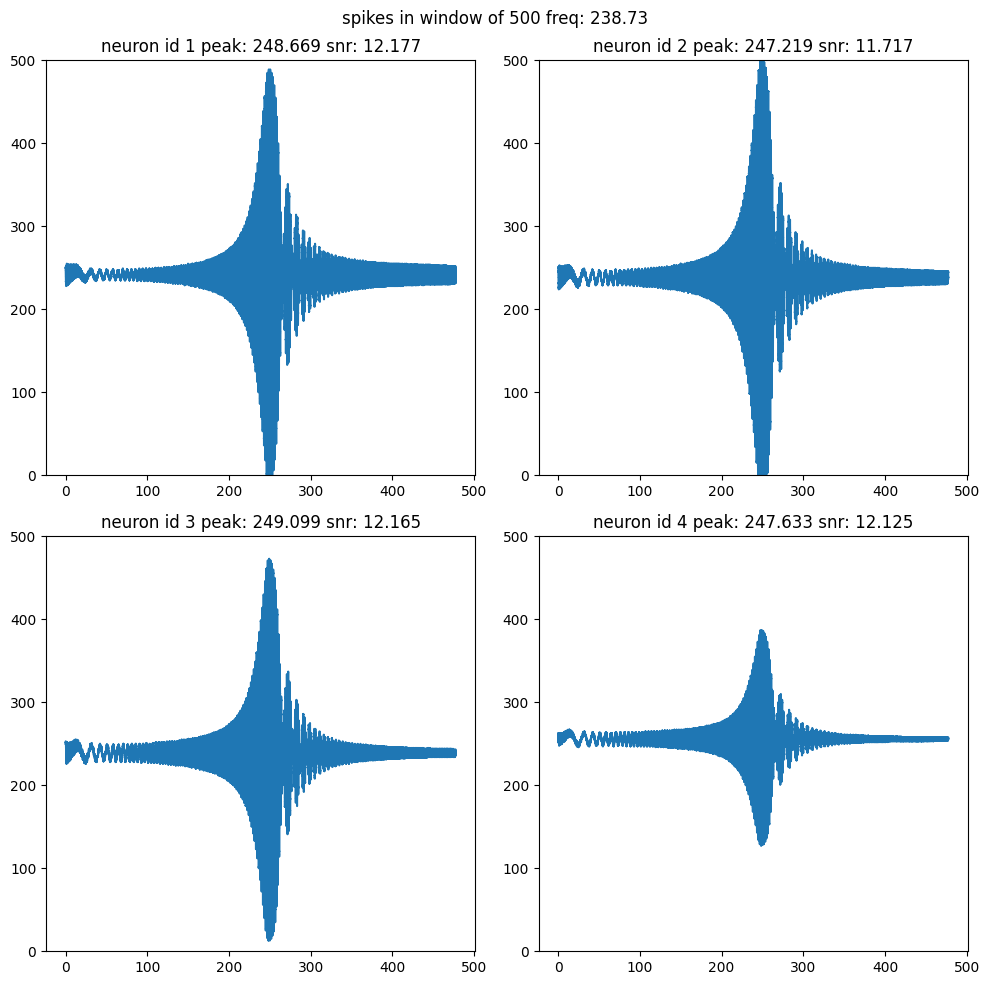

freq0 231.49809904275685
[-2.8967903095385292, -11.765054338698587, -9.70257591615599, -5.833527697675066]
[46.17578372124506, 40.00061500512378, 23.600450314058758, 19.63485869495407, 12.602153220987326]
# 231.49809904275685 ~ peak 242.188 nid 1 snr 12.171


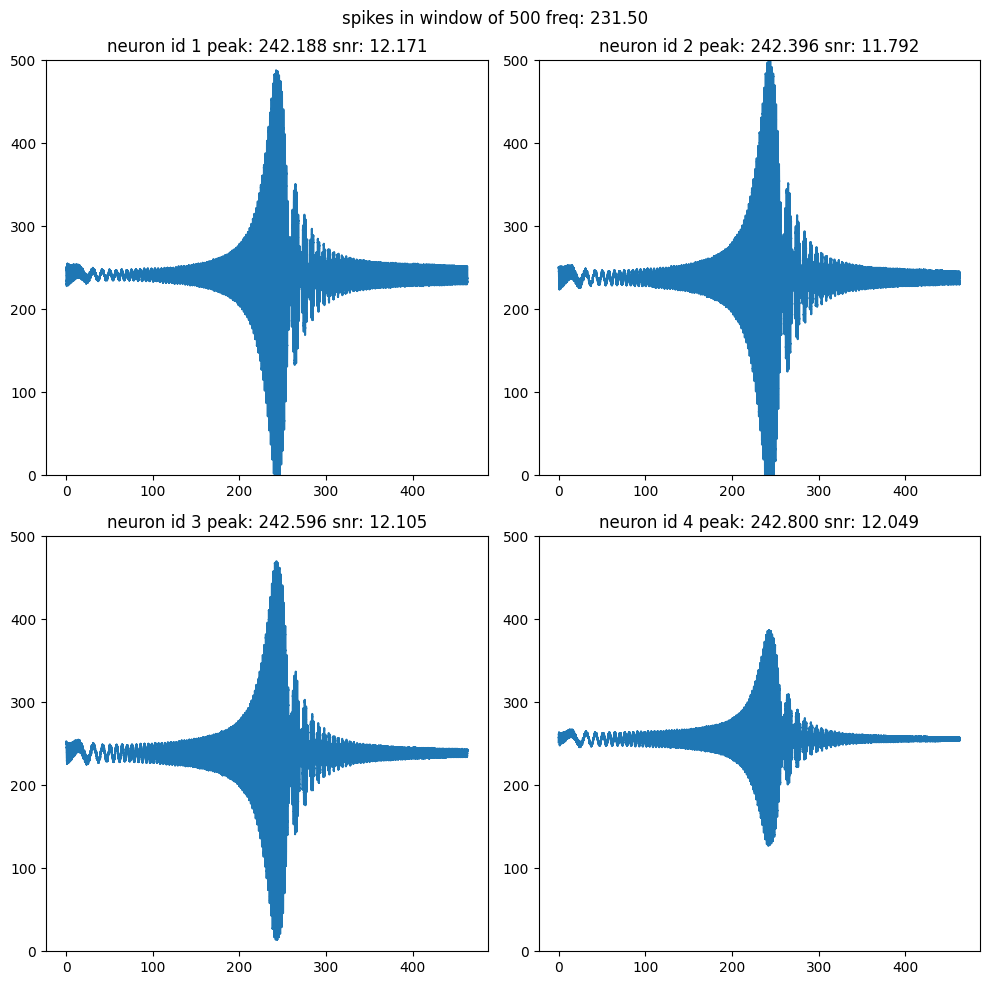

freq0 224.68933142385222
[-2.7439793519085045, -11.345059344293137, -9.444273896571042, -5.709956638990477]
[44.33835156655673, 38.48243175188387, 22.76705736212186, 19.11295960773998, 12.3535325634463]
# 224.68933142385222 ~ peak 235.939 nid 3 snr 12.088


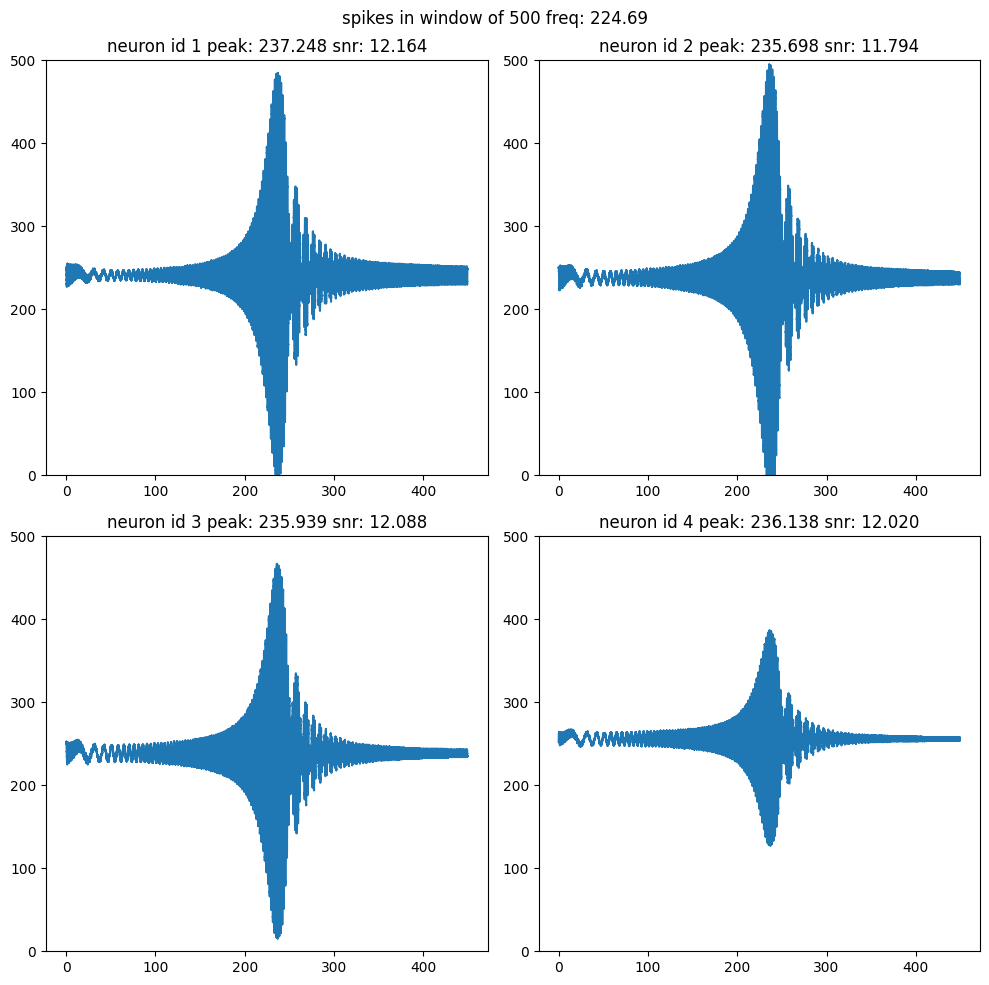

freq0 218.26963624031362
[-2.6034958763486404, -10.955038347169852, -9.20182060666339, -5.592777427757957]
[42.61152738659246, 37.04961450005513, 21.992582643844276, 18.62456506251598, 12.11669531796269]
# 218.26963624031362 ~ peak 230.381 nid 1 snr 12.130


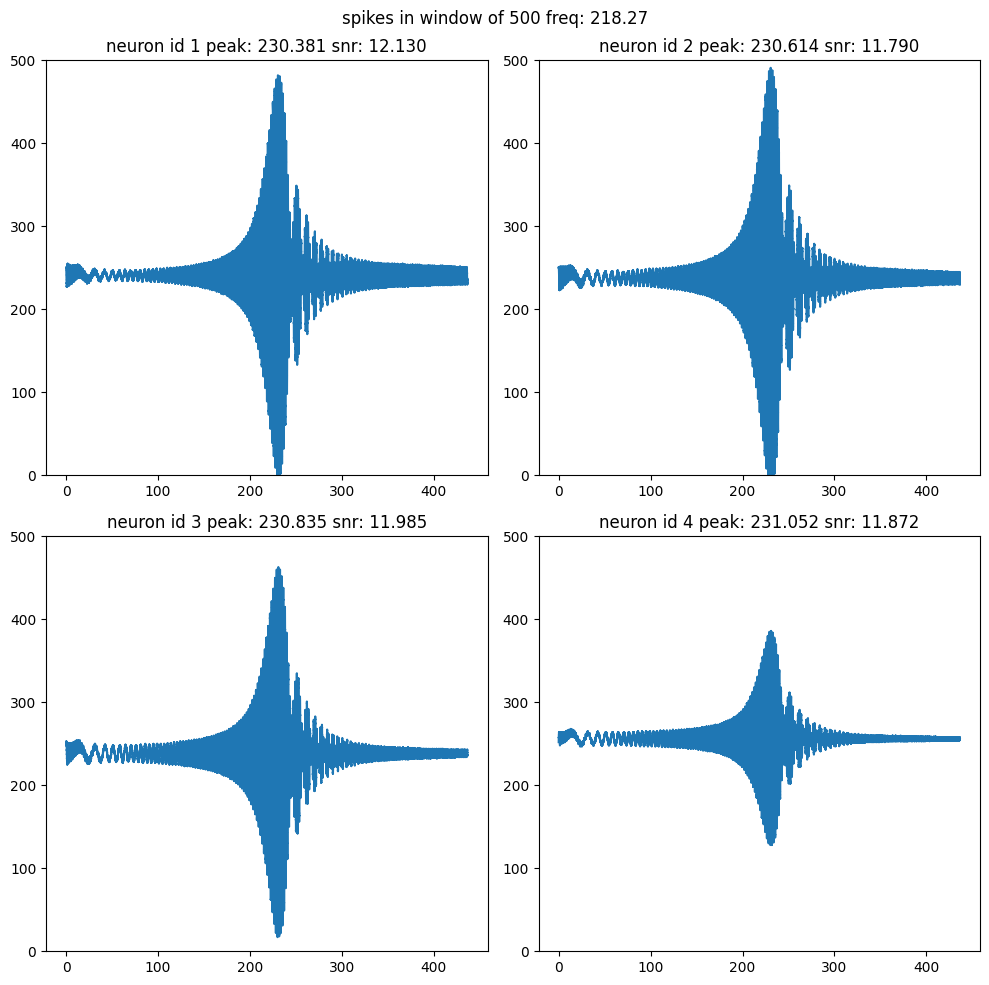

freq0 218.26963624031362
[-2.6034958763486404, -10.955038347169852, -9.20182060666339, -5.592777427757957]
[42.61152738659246, 37.04961450005513, 21.992582643844276, 18.62456506251598, 12.11669531796269]
# 218.26963624031362 ~ peak 230.381 nid 1 snr 12.130


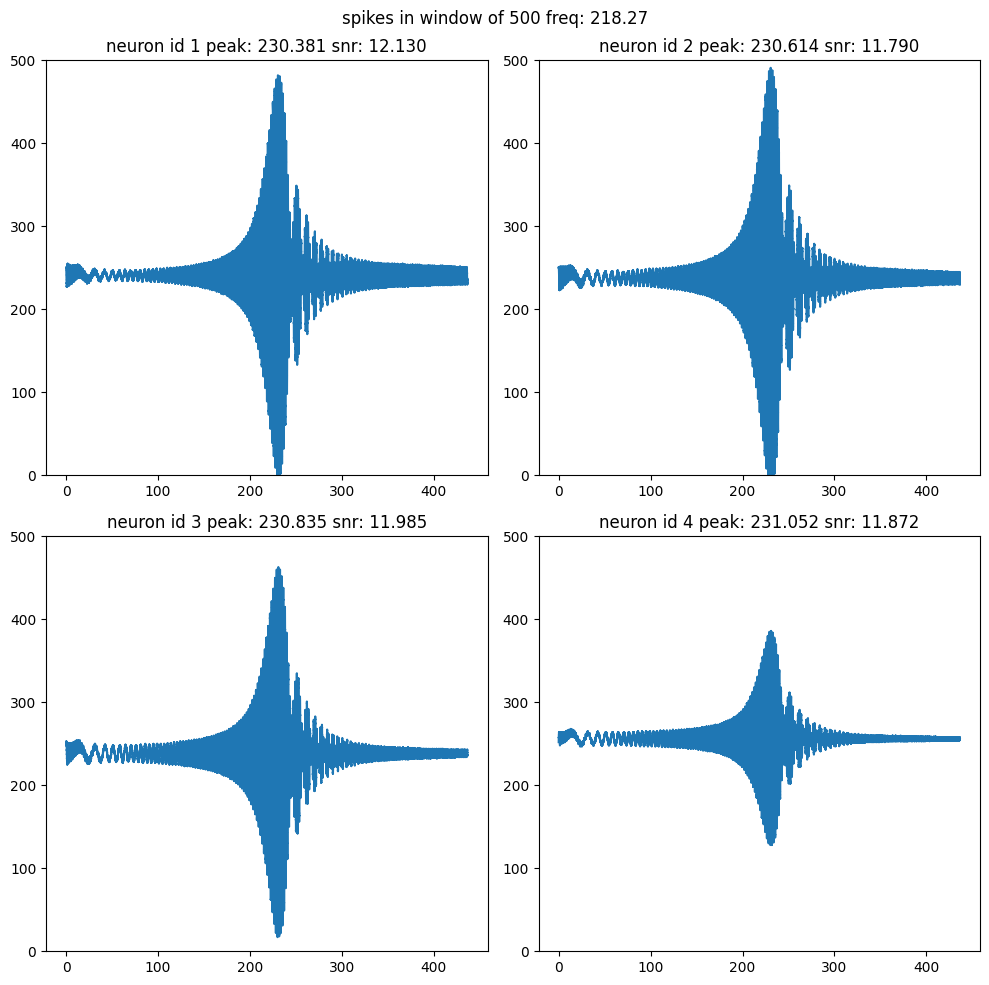

freq0 206.47127752462097
[-2.3554563919324636, -10.254403605077012, -8.758785271834903, -5.3761345215971446]
[39.45103751525831, 34.40975907435249, 20.59975100762623, 17.736301600485877, 11.675845765963878]
# 206.47127752462097 ~ peak 219.780 nid 1 snr 11.965


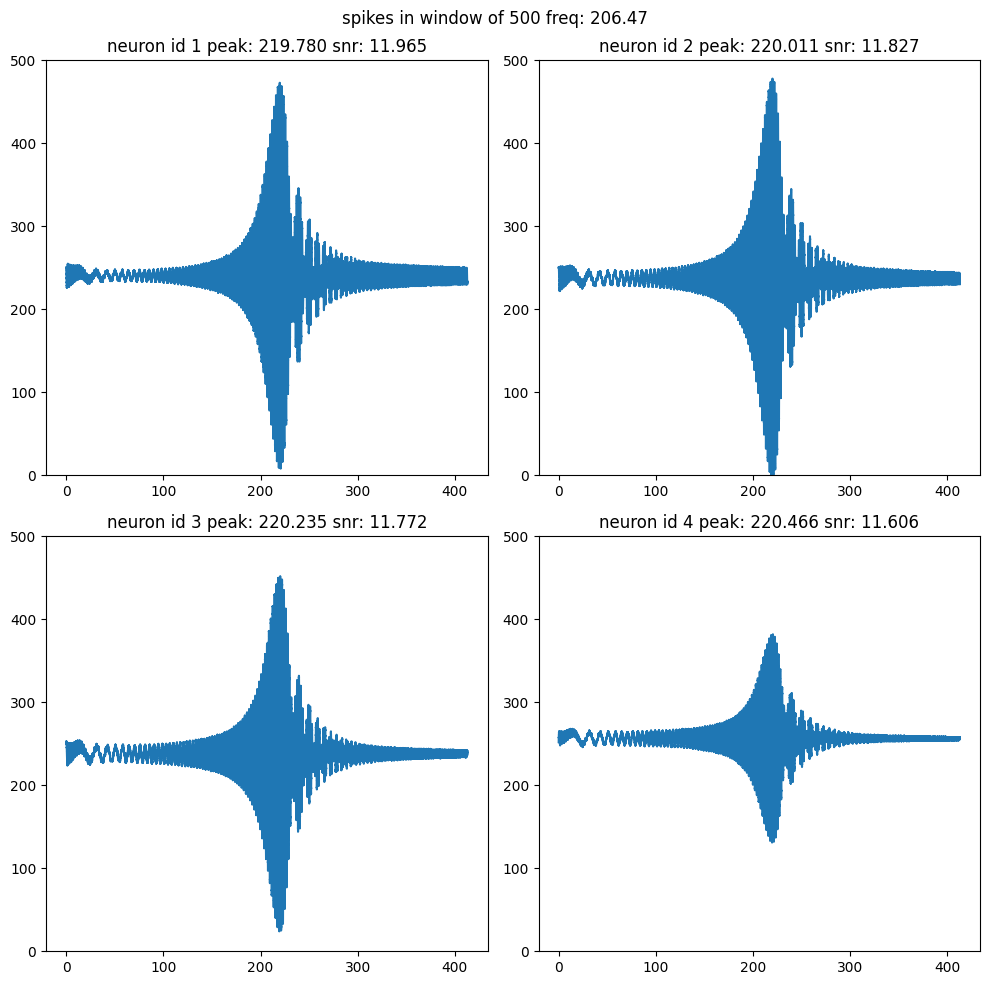

freq0 201.03782285292044
[-2.246094011853619, -9.939229024503, -8.55578515661776, -5.275980799981197]
[38.000761703021126, 33.18981802585236, 19.97244630985031, 17.331302032607248, 11.470634183385432]
# 201.03782285292044 ~ peak 214.229 nid 1 snr 11.753


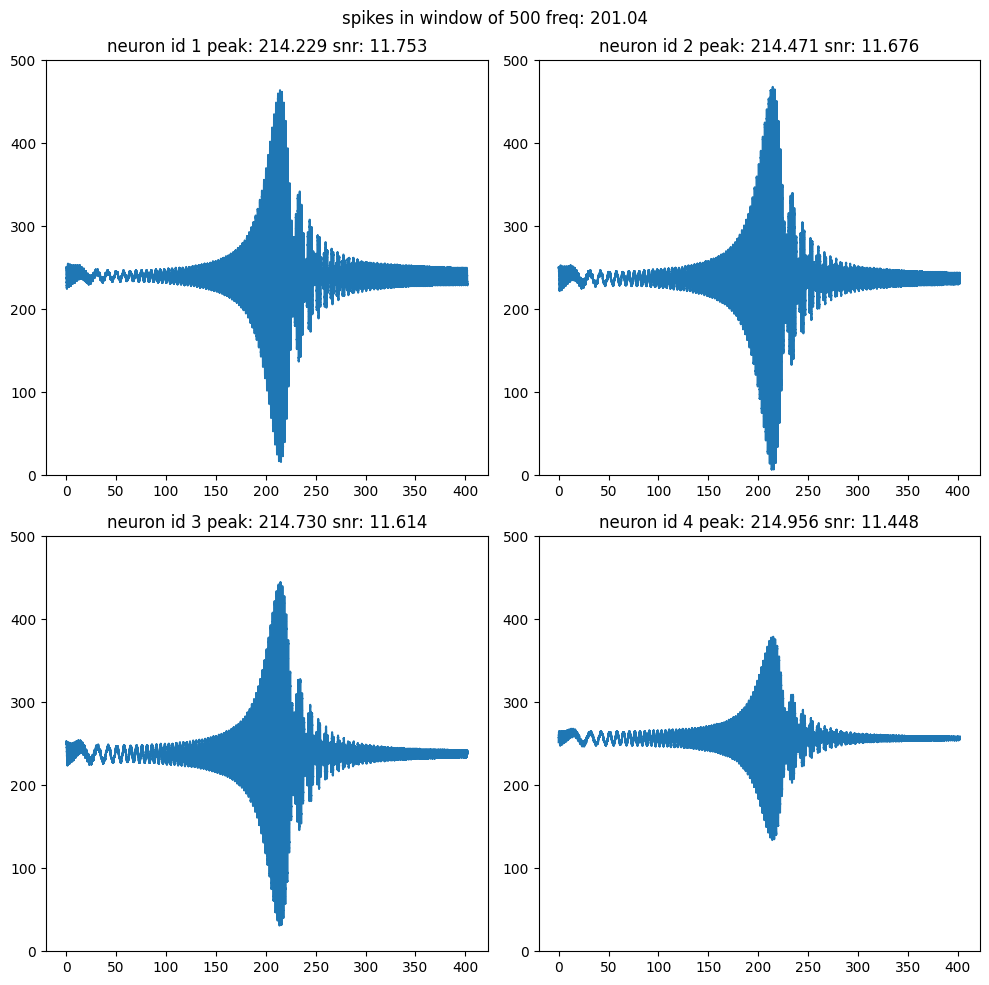

freq0 195.88300688233272
[-2.1454315421303356, -9.644837555754368, -8.363748934648717, -5.18084119182476]
[36.6275828634562, 32.02917977452304, 19.38602726939836, 16.949449107413013, 11.274811751092905]
# 195.88300688233272 ~ peak 208.535 nid 1 snr 11.609


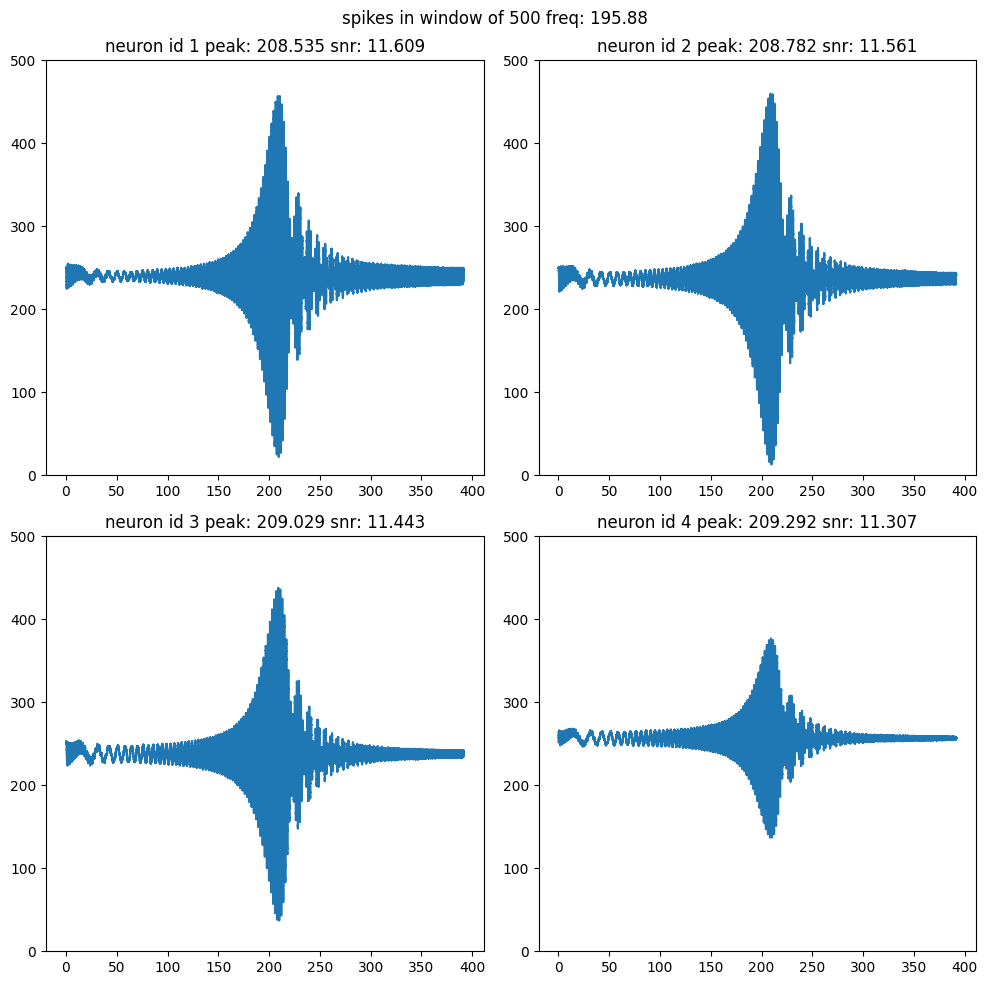

freq0 190.9859317102744
[-2.052754265682066, -9.369498262412813, -8.181784651145156, -5.090414760255247]
[35.32530239471945, 30.92310617169754, 18.837099714376443, 16.588837323207553, 11.087850018403563]
# 190.9859317102744 ~ peak 203.440 nid 4 snr 11.166


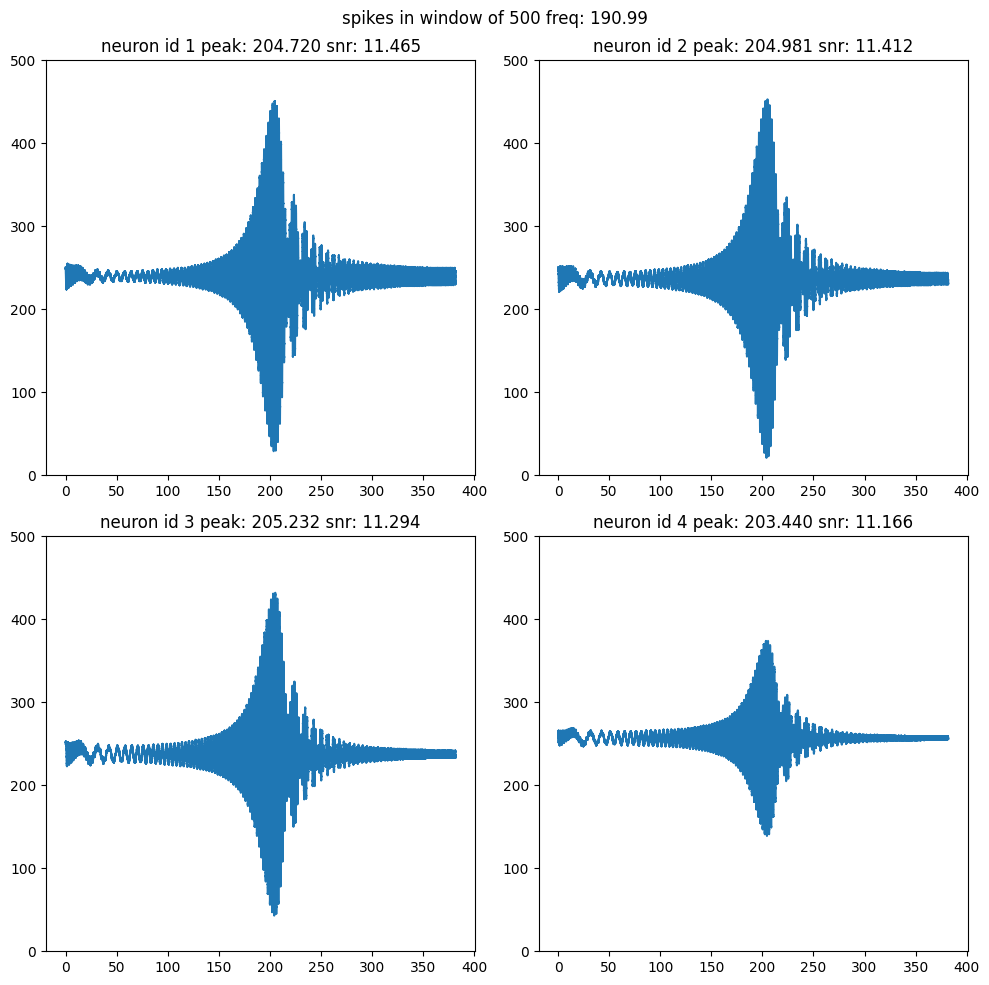

freq0 186.32773825392627
[-1.9674110207459439, -9.111653759564241, -8.00909656755651, -5.004418317054988]
[34.088373153810245, 29.867379007801453, 18.322610076443265, 16.247763456758634, 10.909249634775215]
# 186.32773825392627 ~ peak 198.702 nid 1 snr 11.309


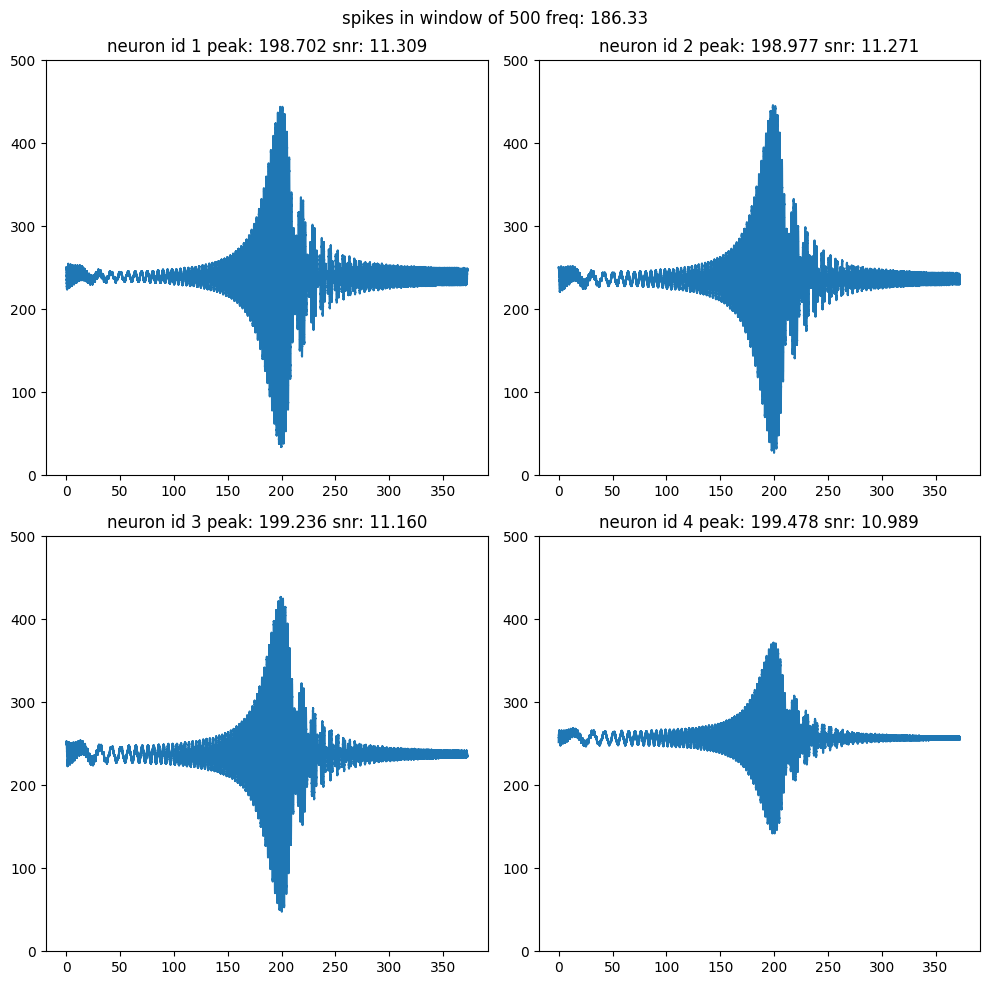

freq0 181.89136353359467
[-1.888808378949447, -8.869899930959113, -7.844972363394961, -4.922585978356974]
[32.91181711627762, 28.85823011475601, 17.839805430553277, 15.924700480425297, 10.738539825573273]
# 181.89136353359467 ~ peak 194.666 nid 1 snr 11.208


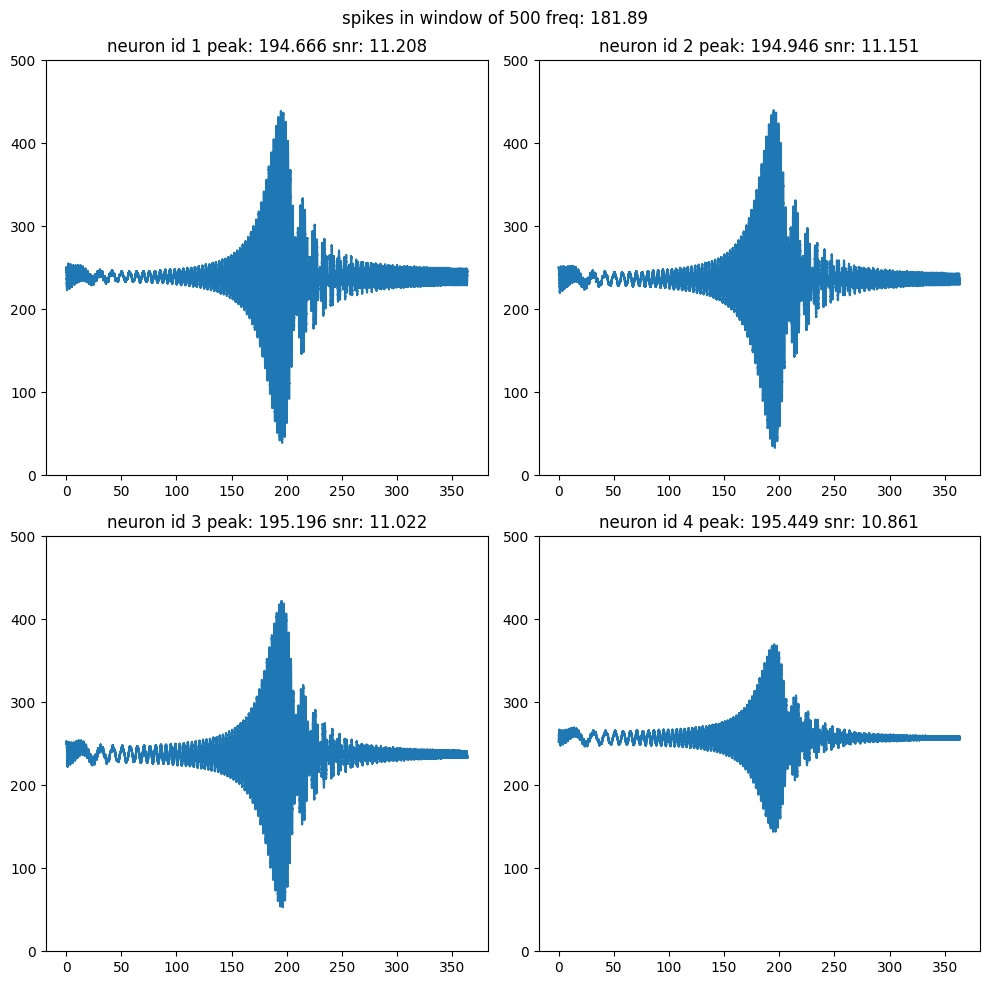

freq0 181.89136353359467
[-1.888808378949447, -8.869899930959113, -7.844972363394961, -4.922585978356974]
[32.91181711627762, 28.85823011475601, 17.839805430553277, 15.924700480425297, 10.738539825573273]
# 181.89136353359467 ~ peak 194.666 nid 1 snr 11.208


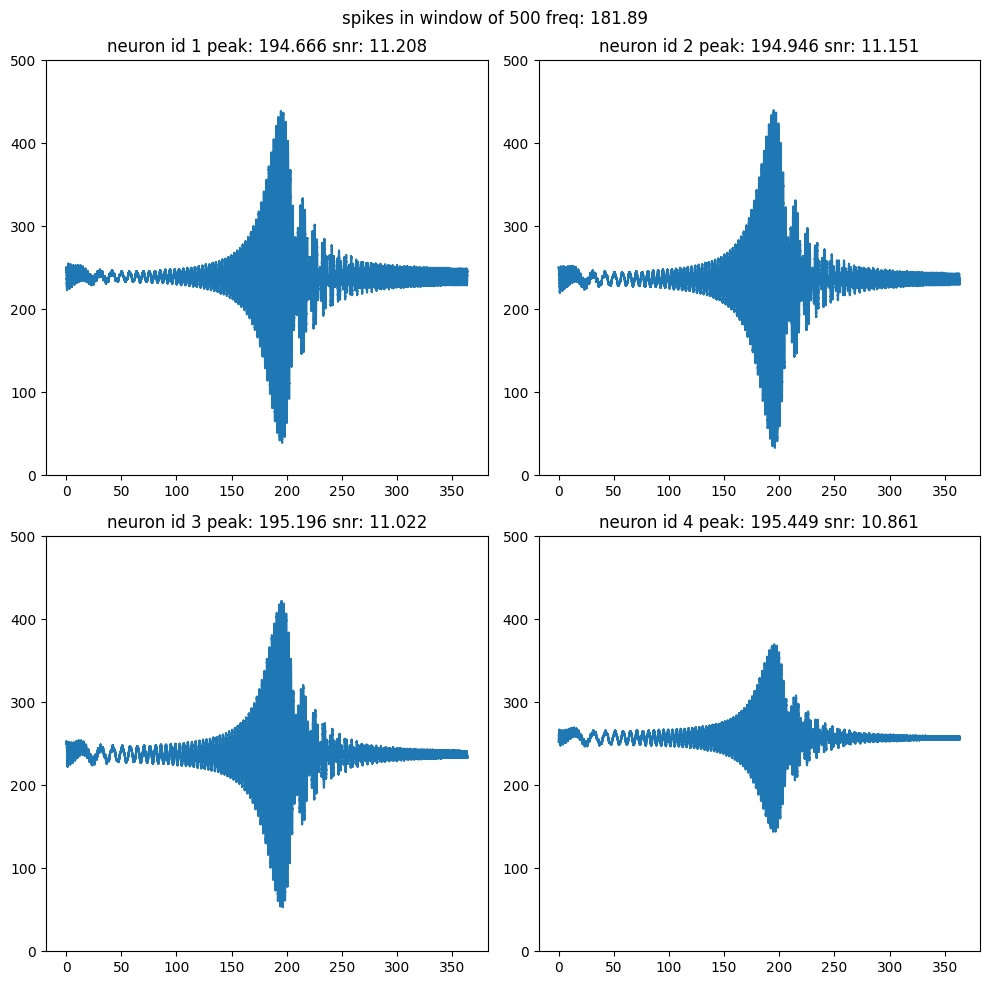

freq0 173.62357428206766
[-1.7497082884973967, -8.429711029999153, -7.5399202796626135, -4.770432716040228]
[30.722345300882253, 26.96649867617971, 16.959539655609877, 15.327250435280082, 10.419046365557172]
# 173.62357428206766 ~ peak 186.242 nid 1 snr 10.907


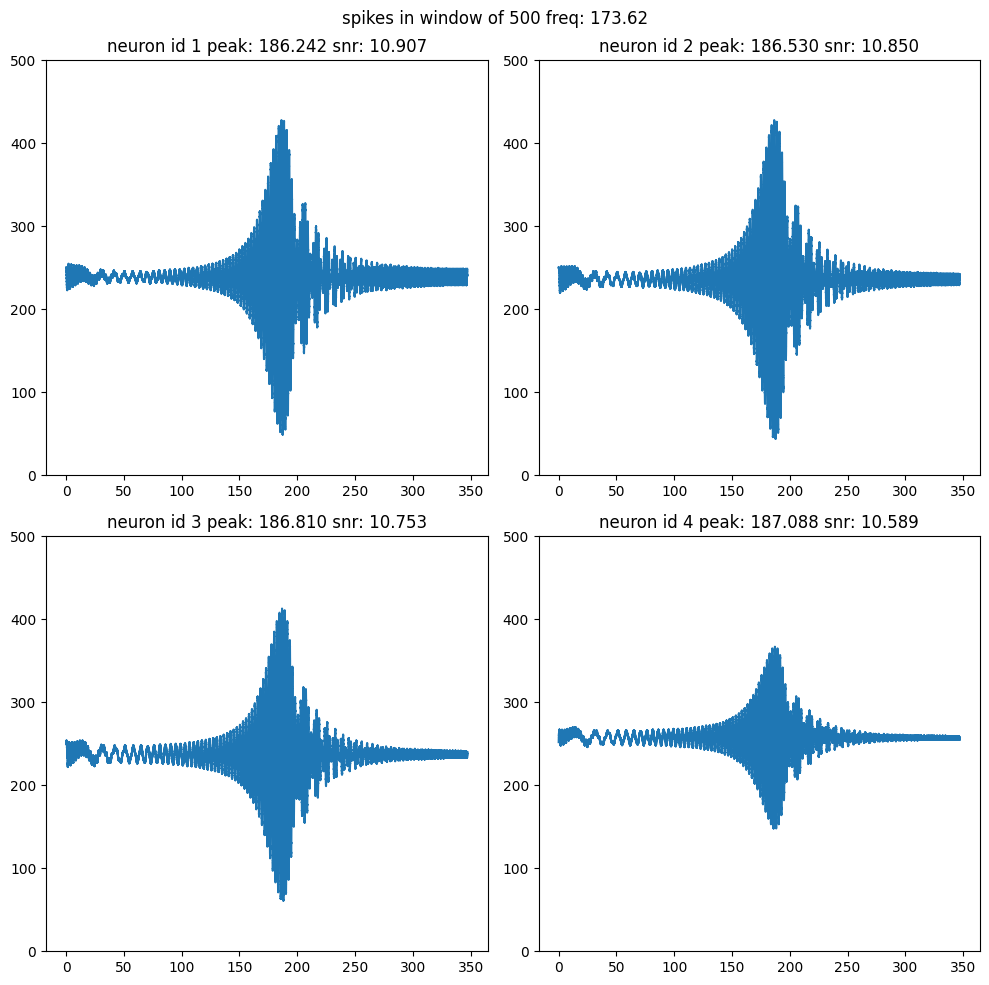

freq0 169.76527263135503
[-1.6882668960288978, -8.229087059968295, -7.397895640807727, -4.6996603586062236]
[29.70173320320646, 26.078140790606078, 16.55778668694413, 15.050506700649098, 10.269455336098858]
# 169.76527263135503 ~ peak 182.167 nid 2 snr 10.689


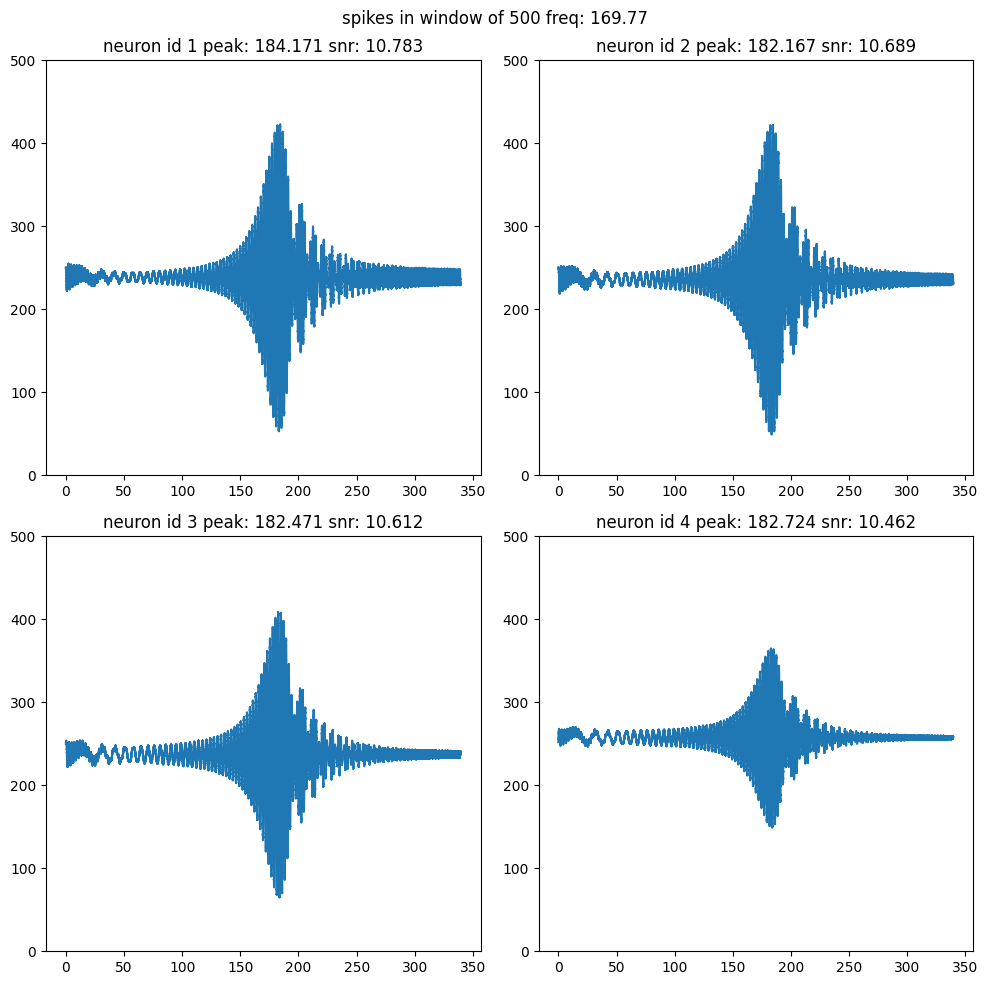

freq0 166.07472322632557
[-1.631669758447985, -8.040151016589979, -7.2622269131760895, -4.632147579443188]
[28.72600468952122, 25.224731184954706, 16.17908602173066, 14.787030435319277, 10.126137619490816]
# 166.07472322632557 ~ peak 179.756 nid 1 snr 10.672


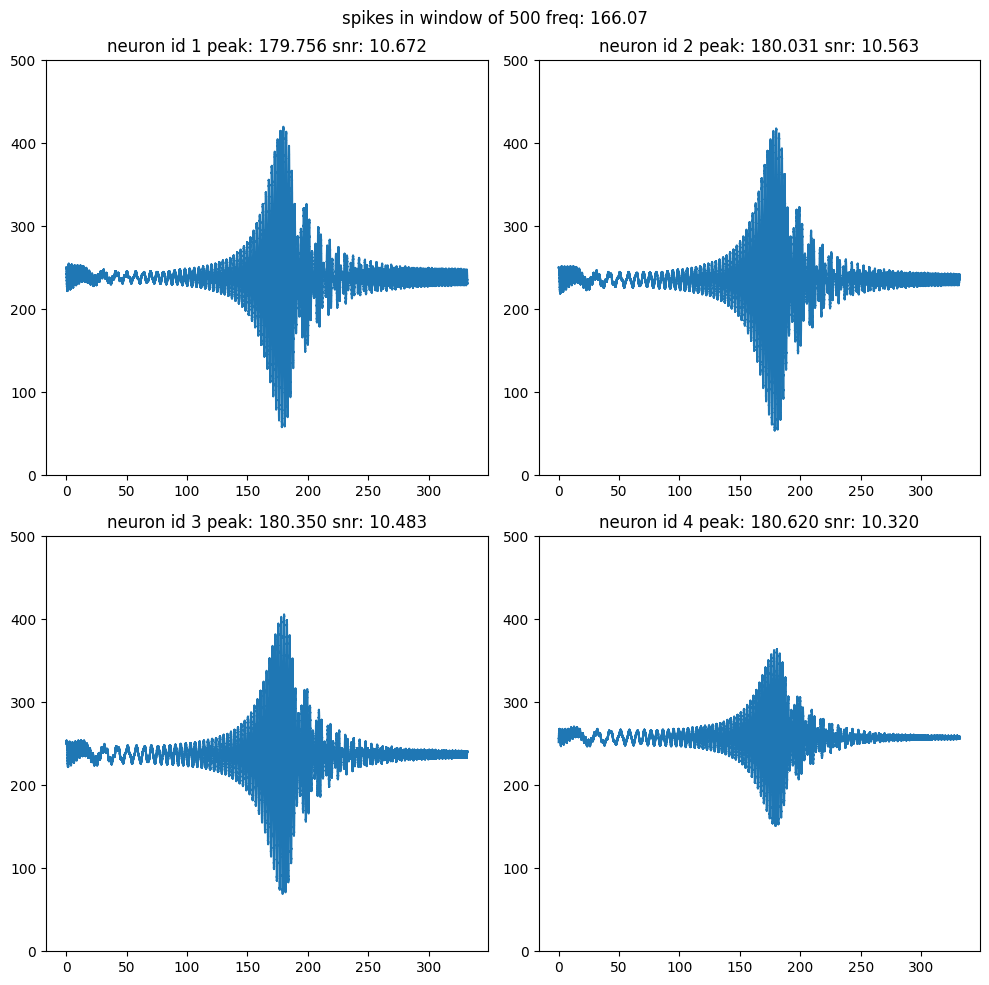

freq0 162.54121847682927
[-1.5795409183006877, -7.862042741270859, -7.1324858911623945, -4.56770391416079]
[27.792148139584214, 24.404022526153717, 15.82175068112316, 14.535900926989367, 9.988749204779243]
# 162.54121847682927 ~ peak 175.185 nid 1 snr 10.520


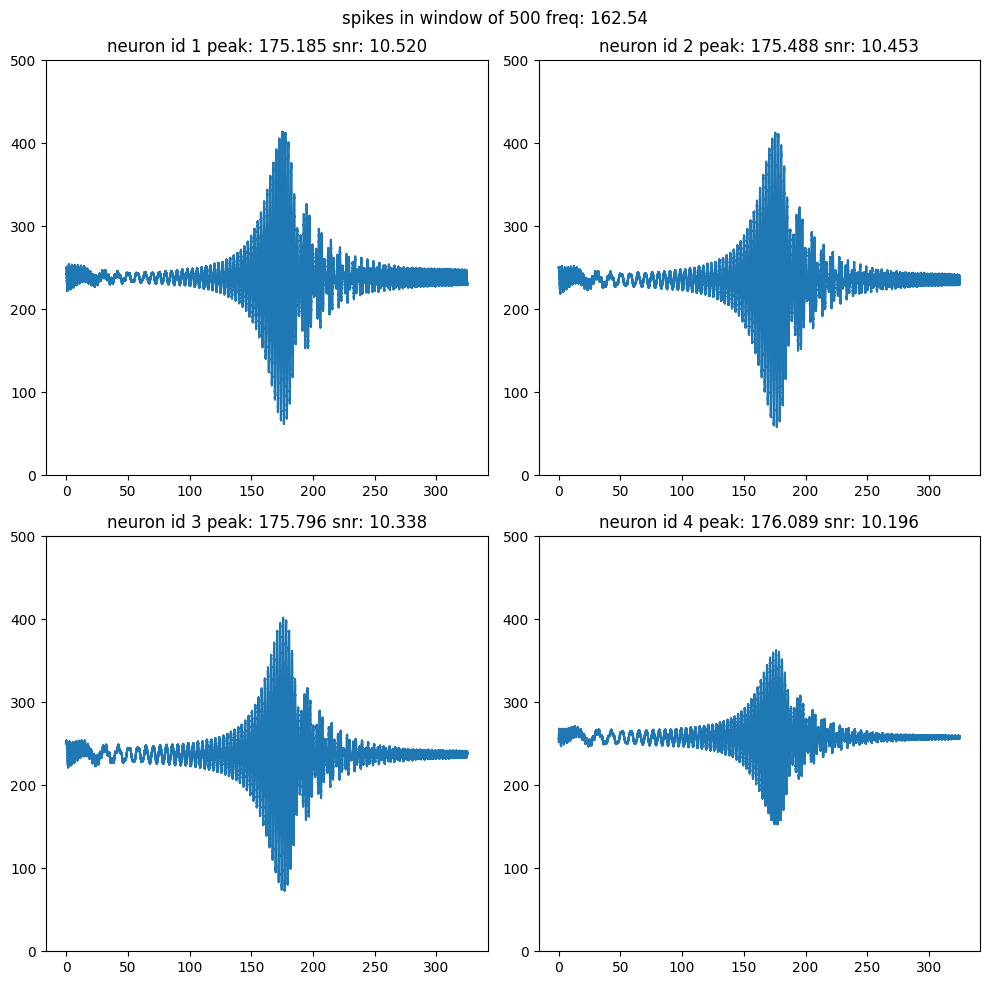

freq0 159.15494309189535
[-1.5315365327948633, -7.693978386723453, -7.0082827457613295, -4.506151478124368]
[26.897420487312374, 23.613970588109837, 15.48424311833692, 14.296280127382605, 9.856967576447126]
# 159.15494309189535 ~ peak 171.423 nid 4 snr 10.062


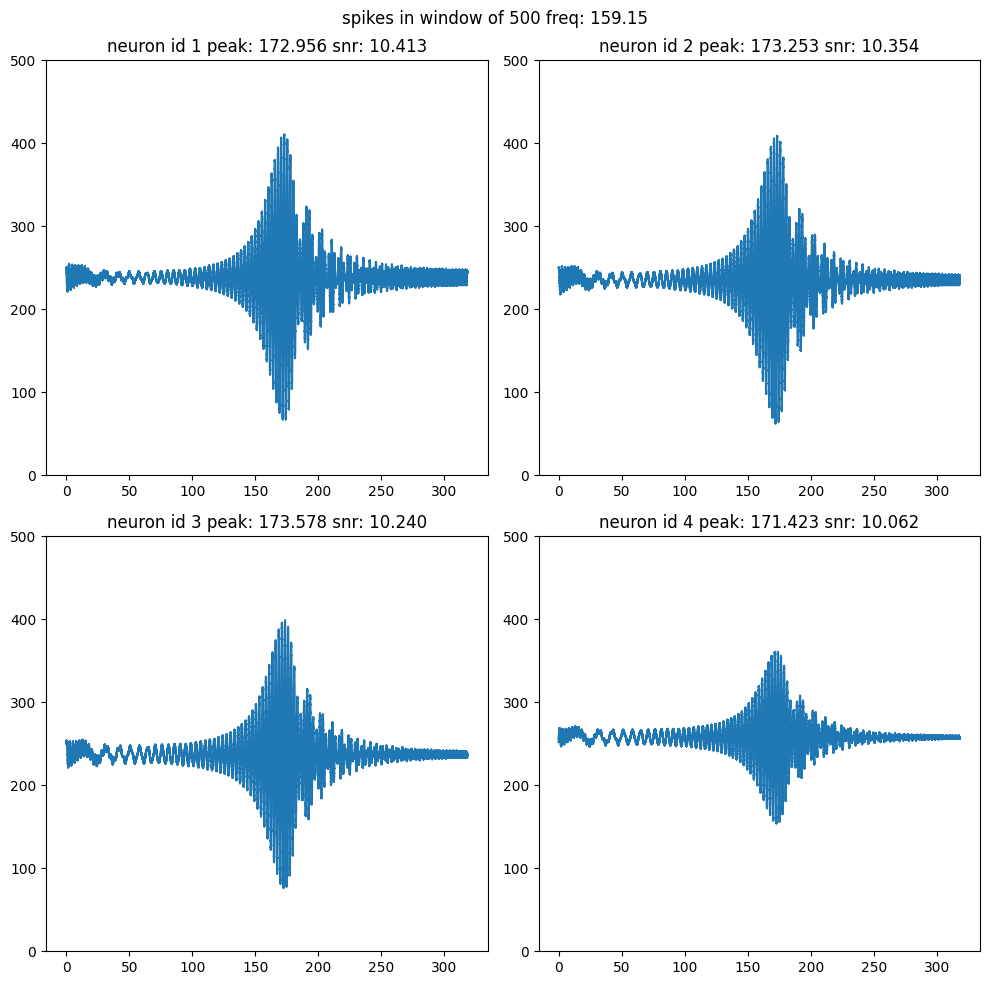

freq0 159.15494309189535
[-1.5315365327948633, -7.693978386723453, -7.0082827457613295, -4.506151478124368]
[26.897420487312374, 23.613970588109837, 15.48424311833692, 14.296280127382605, 9.856967576447126]
# 159.15494309189535 ~ peak 171.423 nid 4 snr 10.062


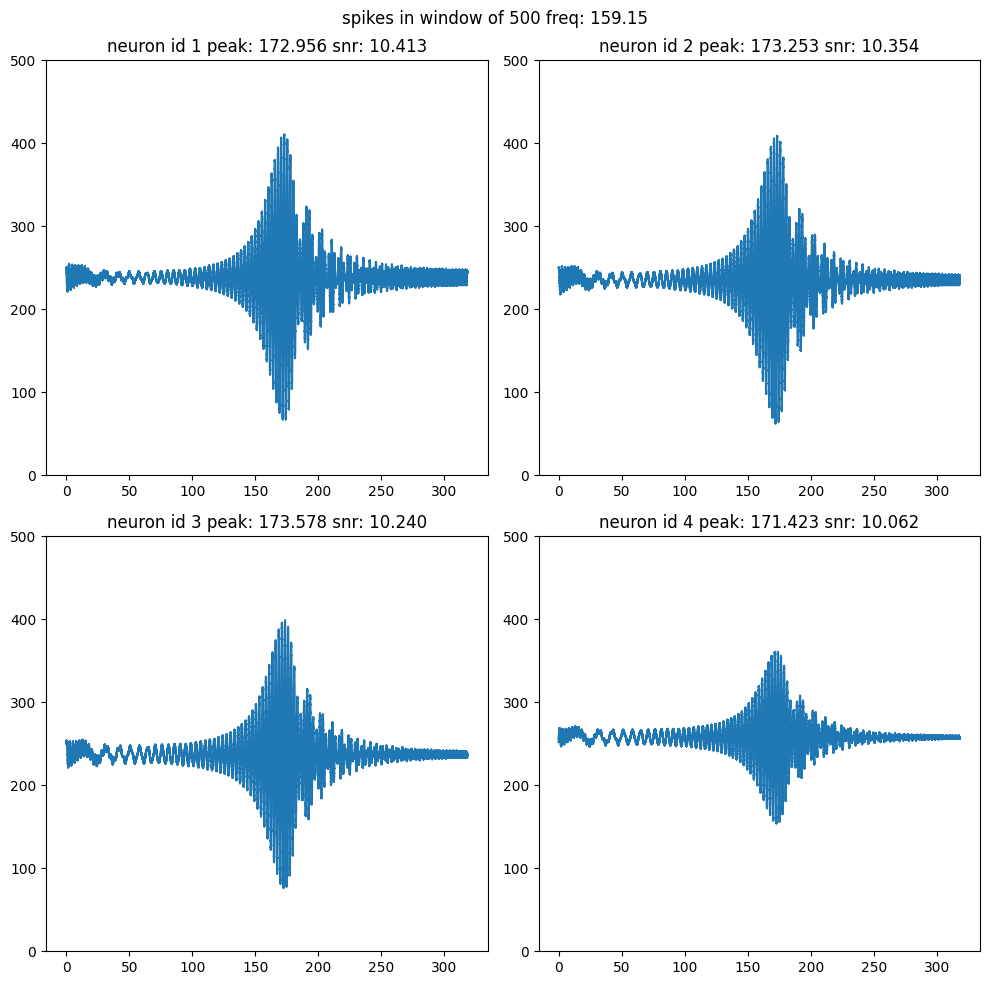

freq0 152.7887453682195
[-1.4466687330907435, -7.385181209315357, -6.775097622195332, -4.39106678498601]
[25.2155499085454, 22.118539278127038, 14.863217357629416, 13.848572717889496, 9.609034330662174]
# 152.7887453682195 ~ peak 165.822 nid 1 snr 10.186


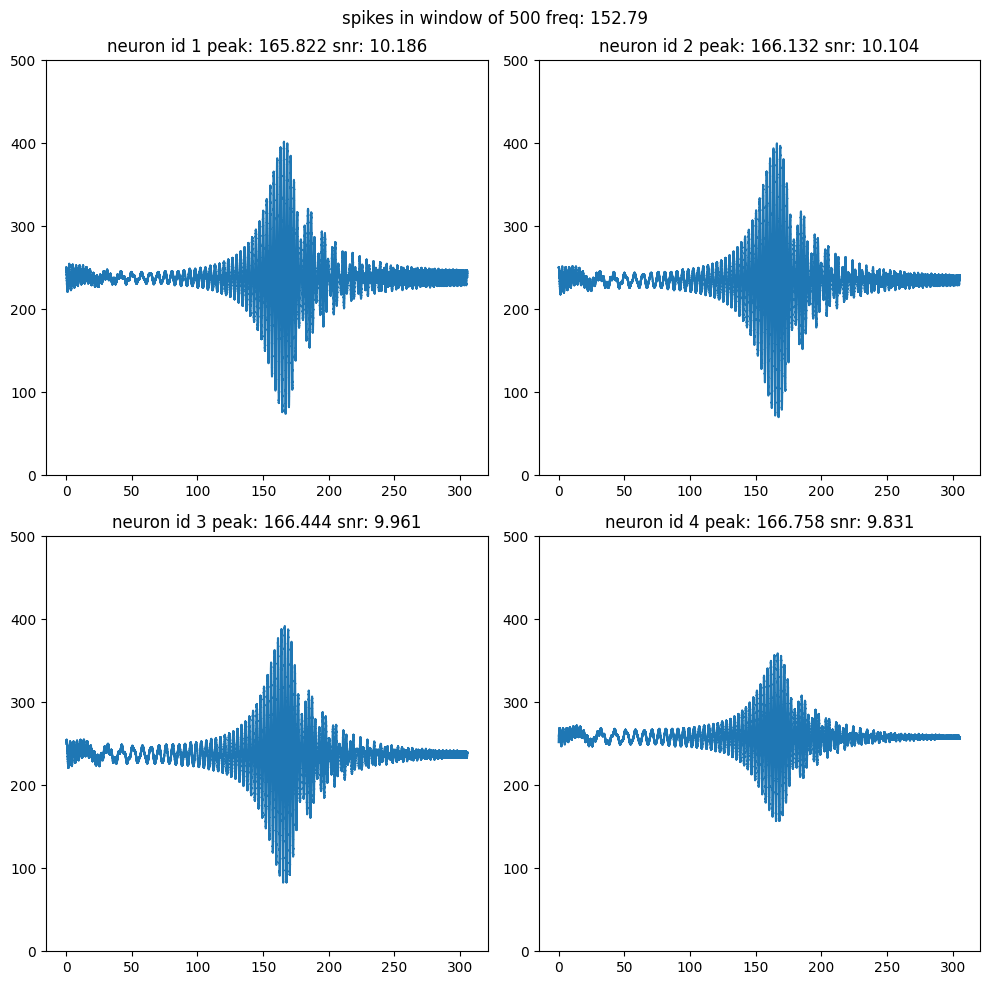

freq0 149.7928876159015
[-1.4092527982928607, -7.2431957754301735, -6.665492205678053, -4.337234471922801]
[24.424017467160013, 21.409893131604605, 14.577240955255565, 13.63914762012066, 9.492333662536721]
# 149.7928876159015 ~ peak 163.418 nid 1 snr 10.065


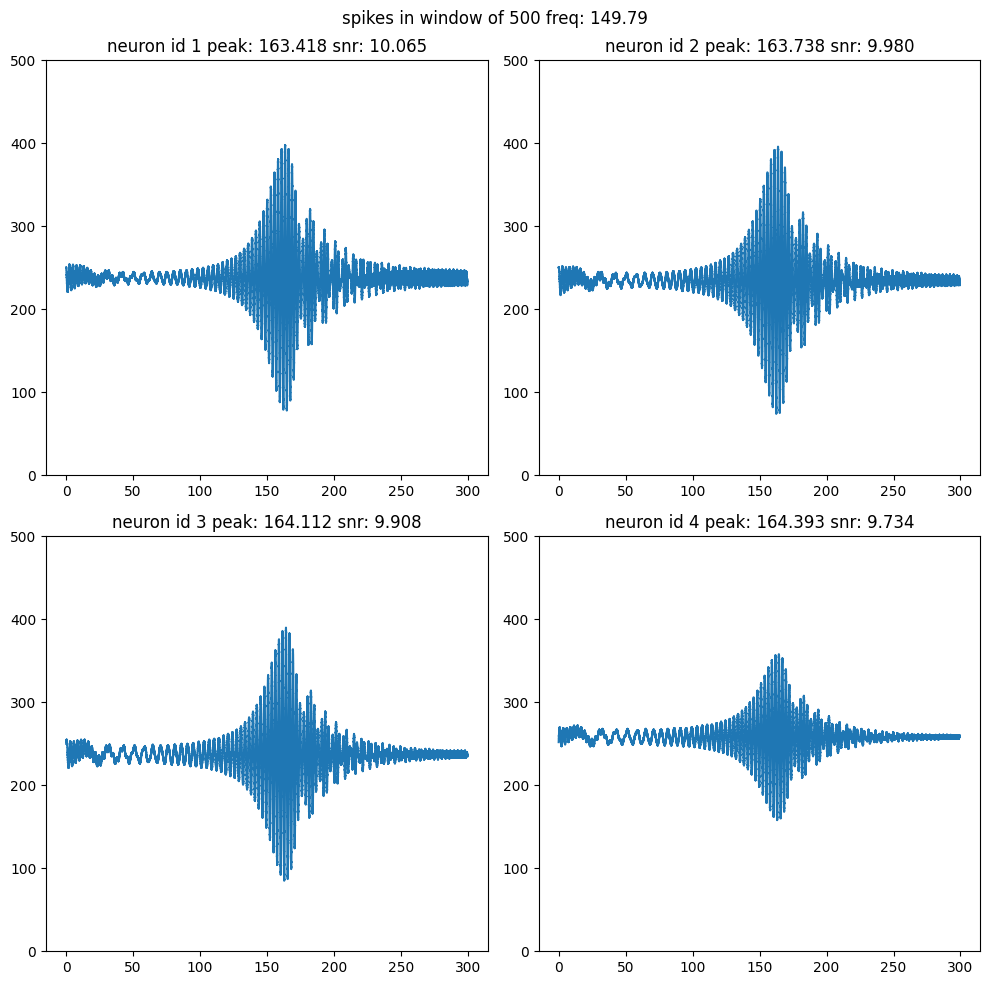

freq0 146.91225516174953
[-1.3748516534917288, -7.108737431942739, -6.560171741878008, -4.285691822254898]
[23.662792800757103, 20.725337536294603, 14.306153188601712, 13.438541321652743, 9.38013931402995]
# 146.91225516174953 ~ peak 160.977 nid 1 snr 9.946


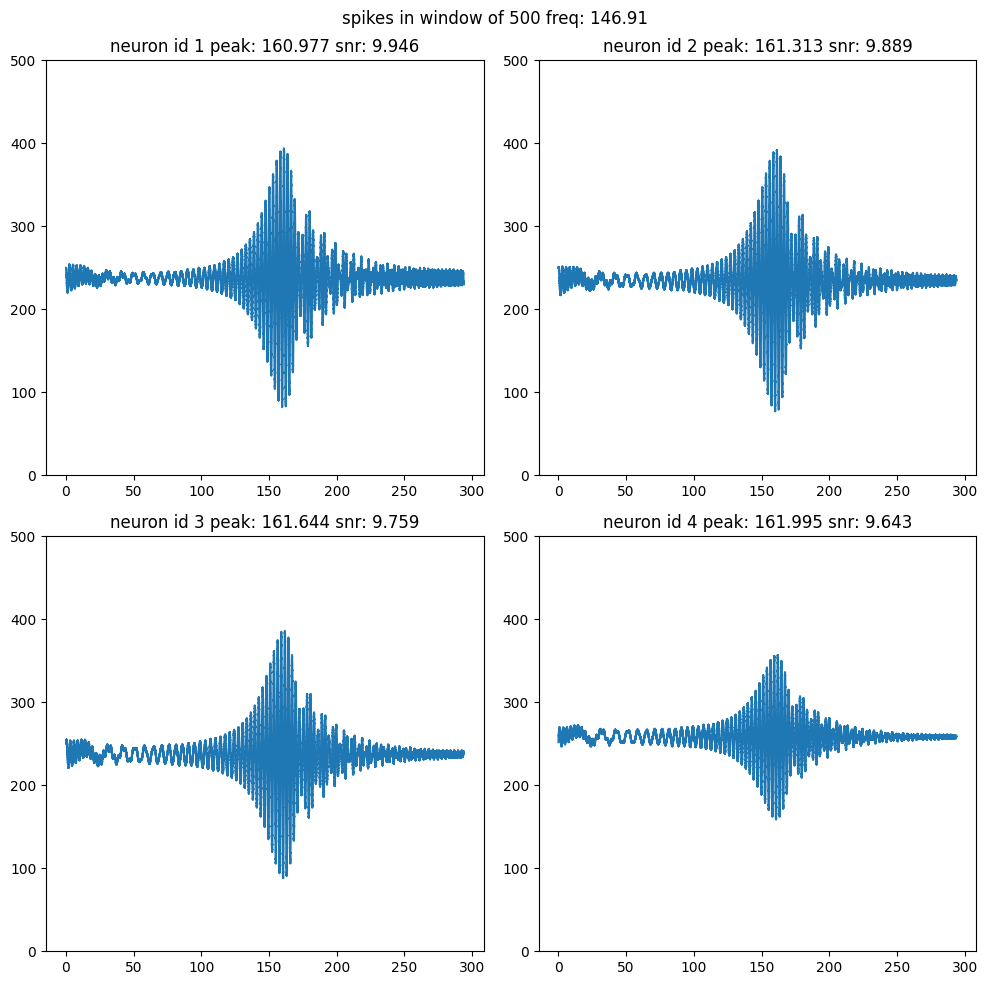

freq0 144.14032581907503
[-1.3432427023030584, -6.981302396549058, -6.458884350554731, -4.2363123070823026]
[22.930102348440542, 20.06355135457587, 14.048964818462075, 13.246214321285606, 9.27221766430591]
# 144.14032581907503 ~ peak 156.783 nid 4 snr 9.501


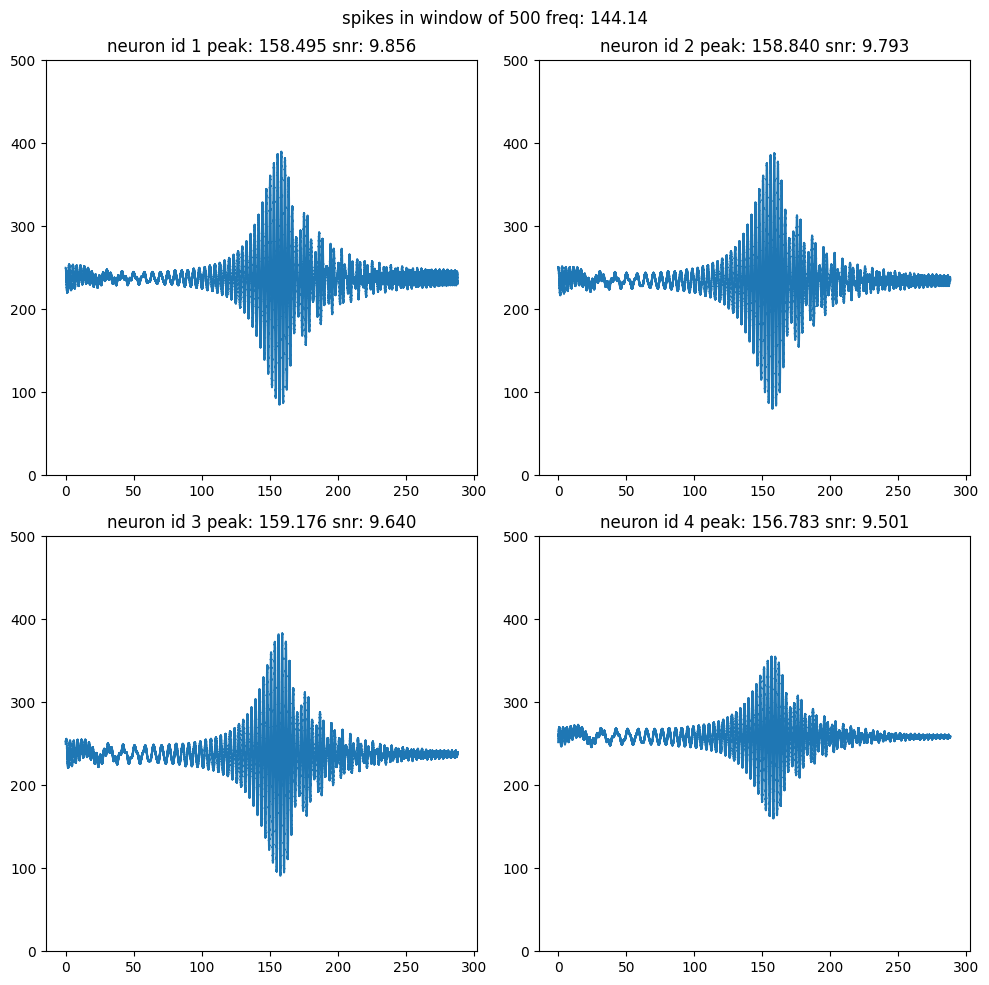

freq0 144.14032581907503
[-1.3432427023030584, -6.981302396549058, -6.458884350554731, -4.2363123070823026]
[22.930102348440542, 20.06355135457587, 14.048964818462075, 13.246214321285606, 9.27221766430591]
# 144.14032581907503 ~ peak 156.783 nid 4 snr 9.501


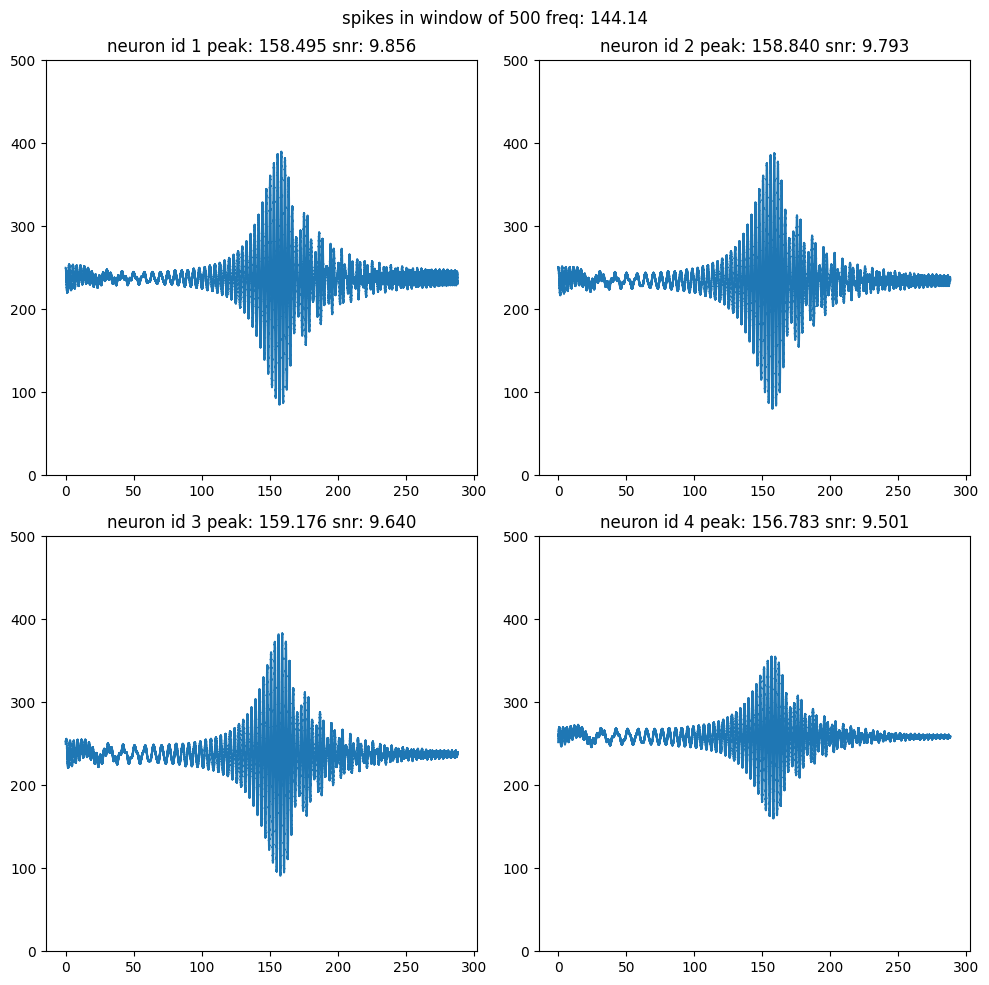

freq0 138.8988594256541
[-1.287599637886344, -6.7456868167856285, -6.267497910951761, -4.14357716185055]
[21.543910946955506, 18.803504036111264, 13.57272027252391, 12.88445012284582, 9.068329225011256]
# 138.8988594256541 ~ peak 151.620 nid 4 snr 9.330


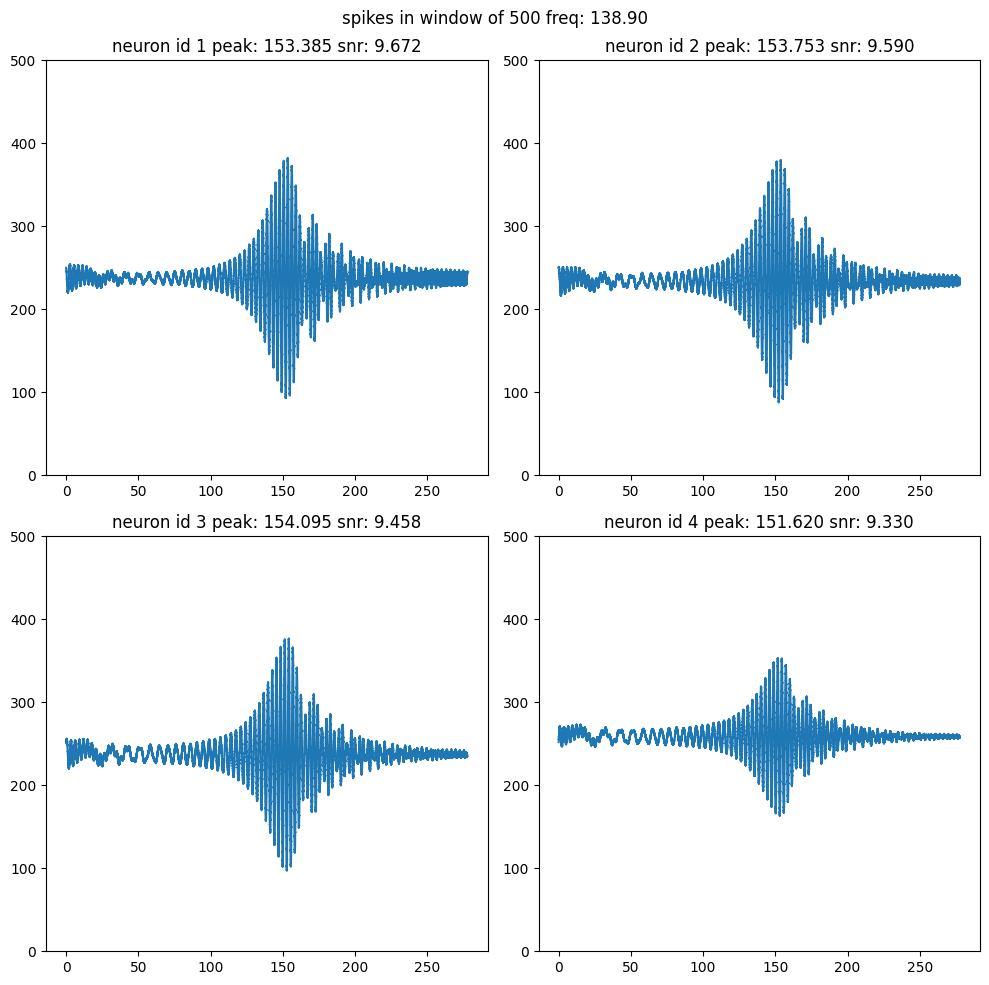

freq0 136.418522650196
[-1.2632042873271603, -6.6366873022663135, -6.176986216781664, -4.100007363992234]
[20.887505090692002, 18.203072633515795, 13.352054858537997, 12.714131872255201, 8.971963594437774]
# 136.418522650196 ~ peak 148.981 nid 4 snr 9.215


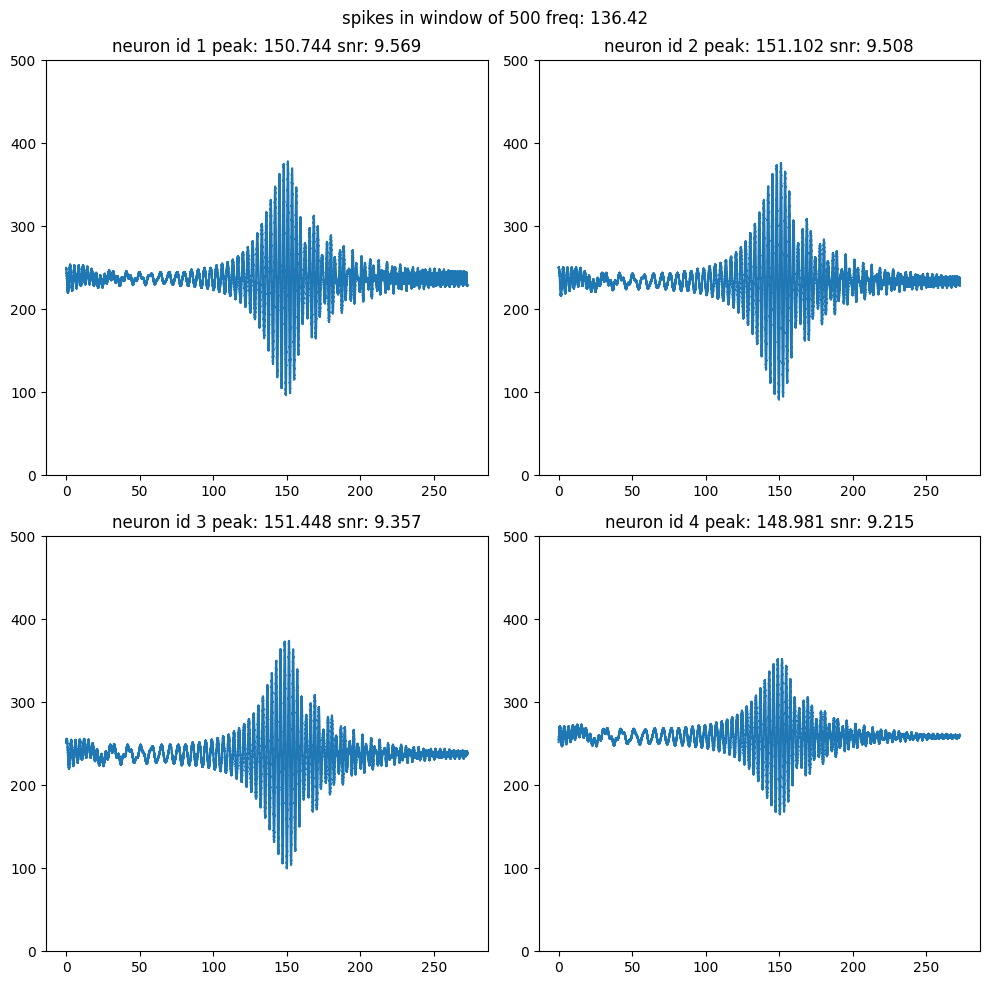

freq0 134.02521523528029
[-1.2408758787603986, -6.533066666136605, -6.089679103469489, -4.058171317795903]
[20.25380109956511, 17.621053225140884, 13.142057669471328, 12.550323877437407, 8.879071223771076]
# 134.02521523528029 ~ peak 148.047 nid 1 snr 9.481


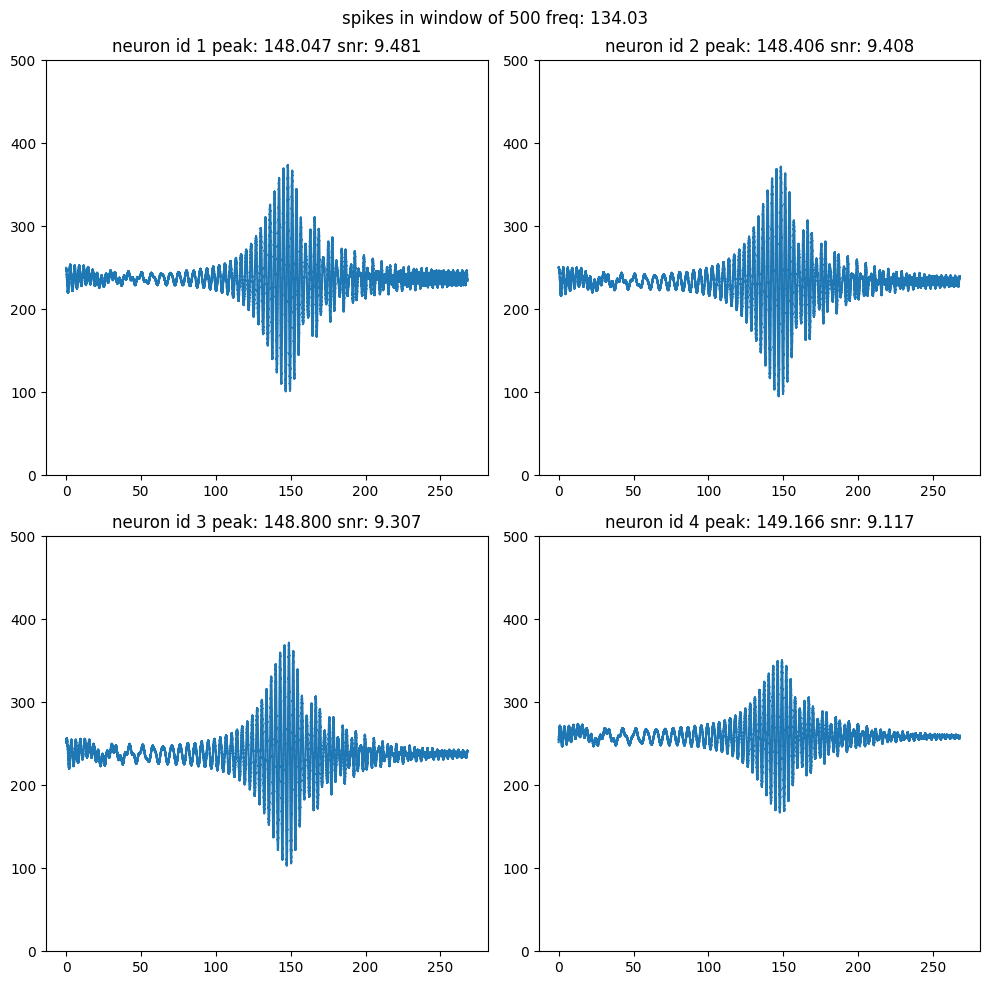

freq0 131.7144356622582
[-1.2204674105398743, -6.43449016004671, -6.005406151124673, -4.017978239028189]
[19.641599652079222, 17.056545711376494, 12.942070439406706, 12.392663661662858, 8.789481617931731]
# 131.7144356622582 ~ peak 145.286 nid 1 snr 9.386


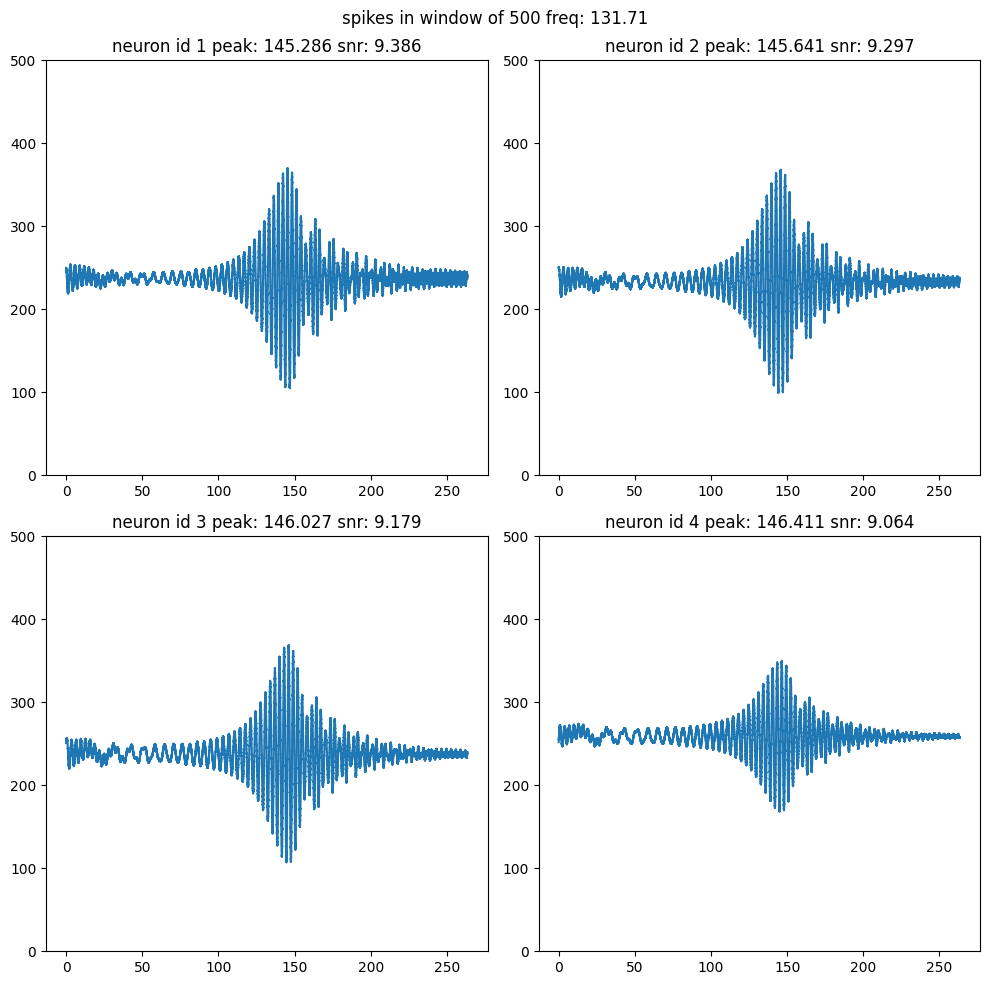

freq0 129.48198760018605
[-1.2018432695108245, -6.340648209685693, -5.924009007476311, -3.9793430467141375]
[19.049786494358614, 16.508711998839033, 12.751484210359912, 12.24081497815531, 8.703034469207555]
# 129.48198760018605 ~ peak 142.474 nid 1 snr 9.323


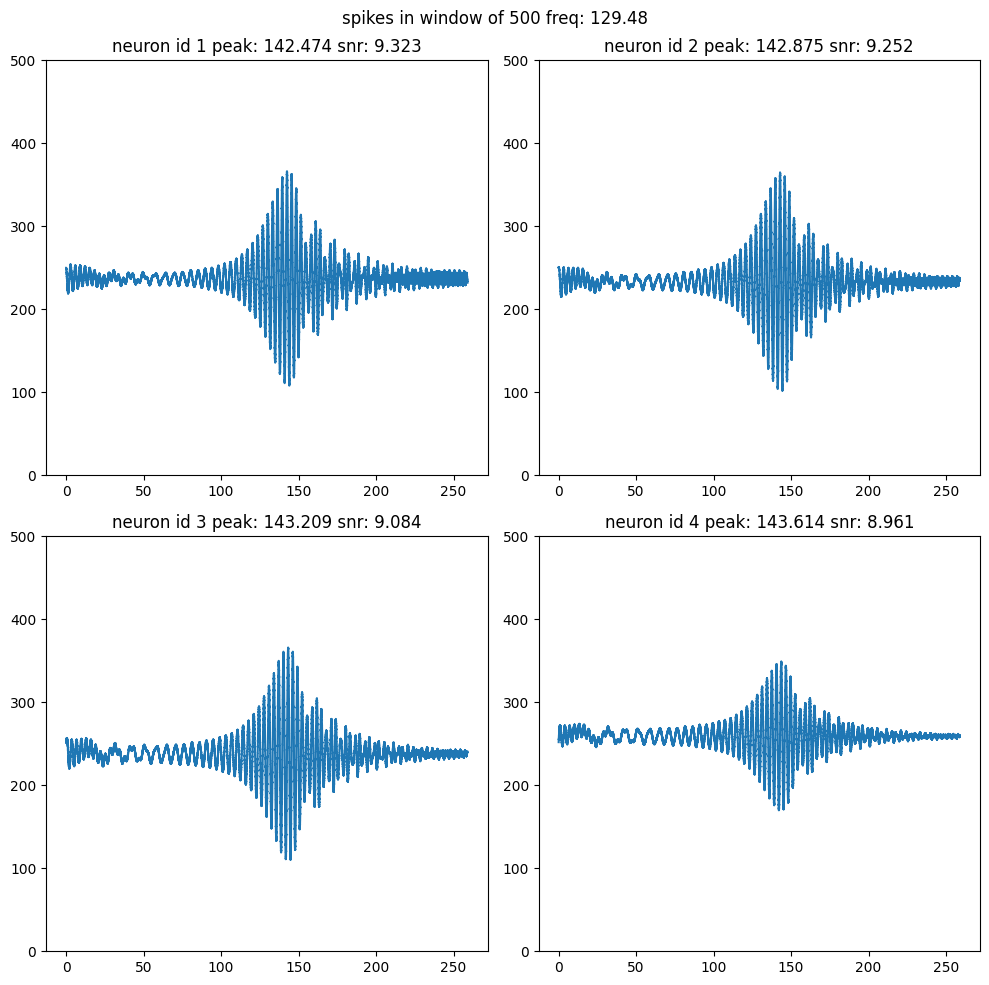

freq0 127.32395447351628
[-1.1848782537035039, -6.251254202985937, -5.8453403243745825, -3.942185960495869]
[18.47732492723125, 15.97677046878632, 12.569735006511195, 12.09446549090356, 8.619578970568142]
# 127.32395447351628 ~ peak 139.594 nid 1 snr 9.219


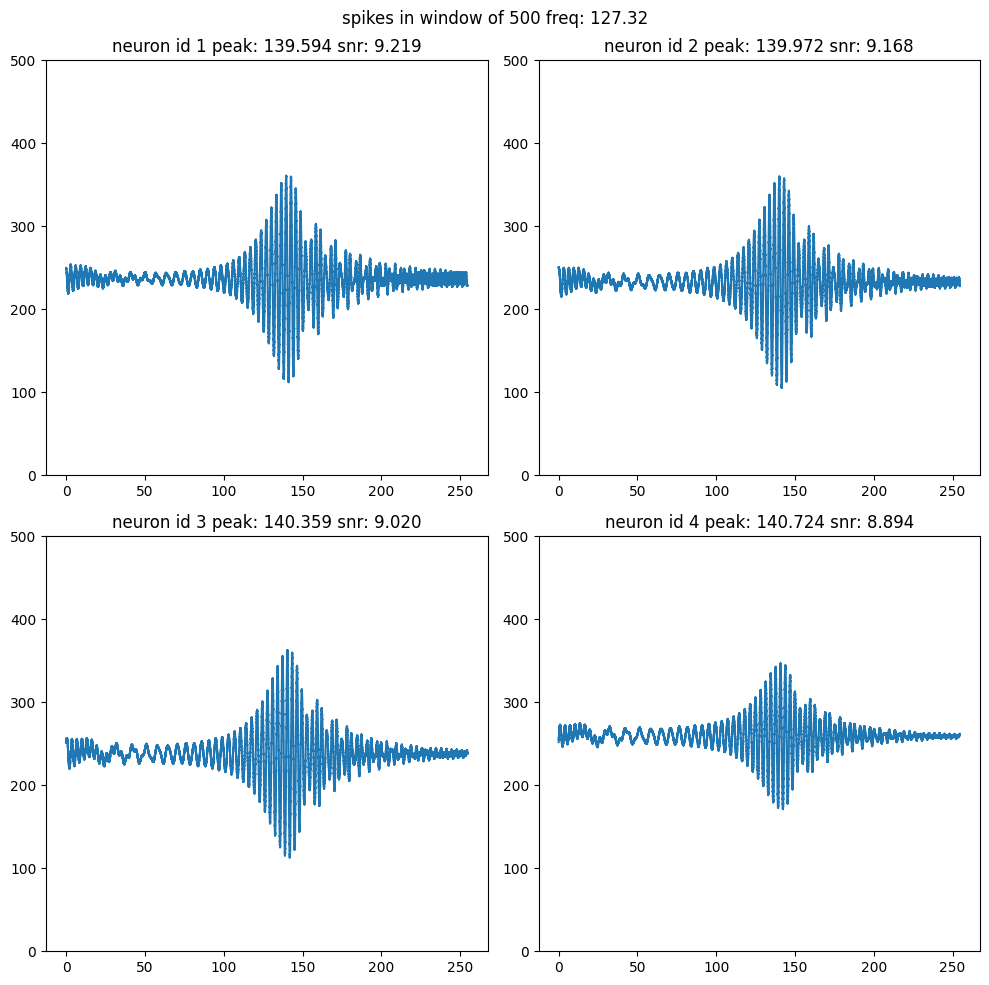

freq0 125.23667653132748
[-1.1694566866508564, -6.166042499786158, -5.769262805943535, -3.9064321278068173]
[17.92324907947483, 15.45999104479261, 12.396299941646355, 11.953324696515882, 8.53897317715351]
# 125.23667653132748 ~ peak 137.421 nid 3 snr 8.931


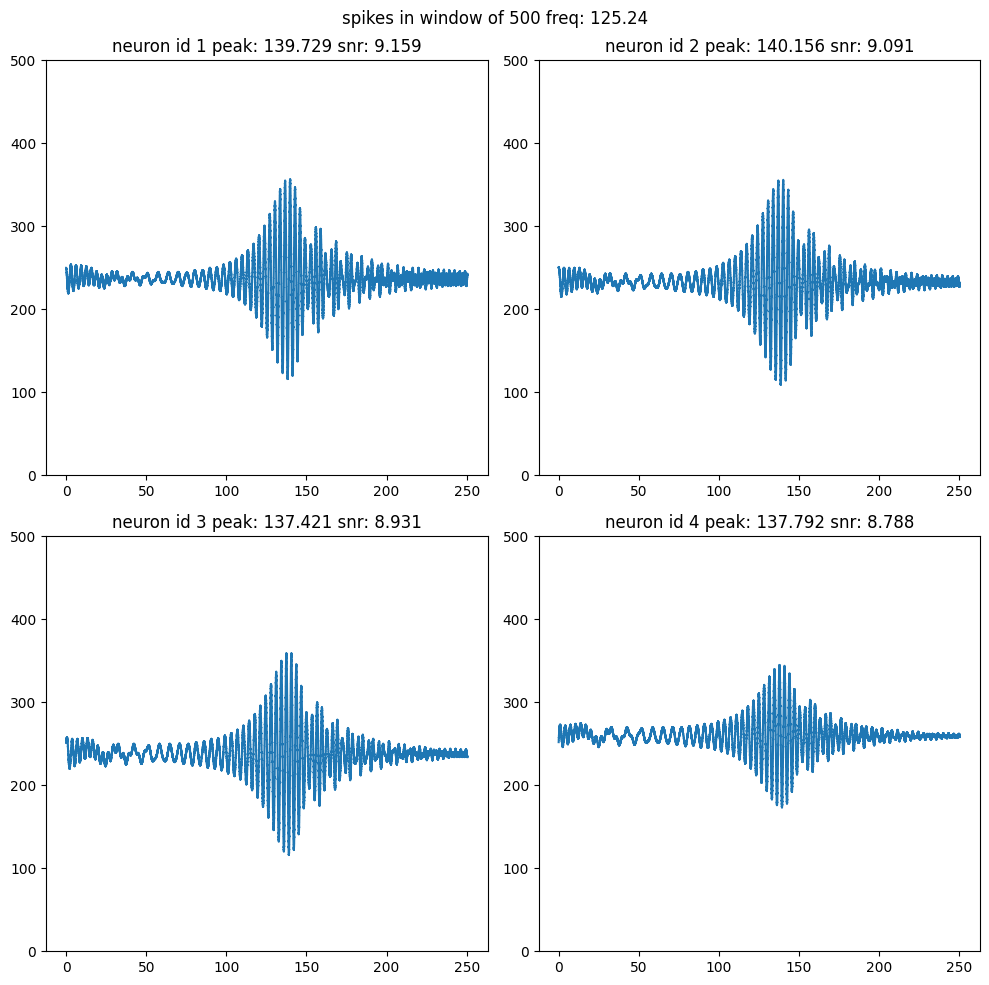

freq0 125.23667653132748
[-1.1694566866508564, -6.166042499786158, -5.769262805943535, -3.9064321278068173]
[17.92324907947483, 15.45999104479261, 12.396299941646355, 11.953324696515882, 8.53897317715351]
# 125.23667653132748 ~ peak 137.421 nid 3 snr 8.931


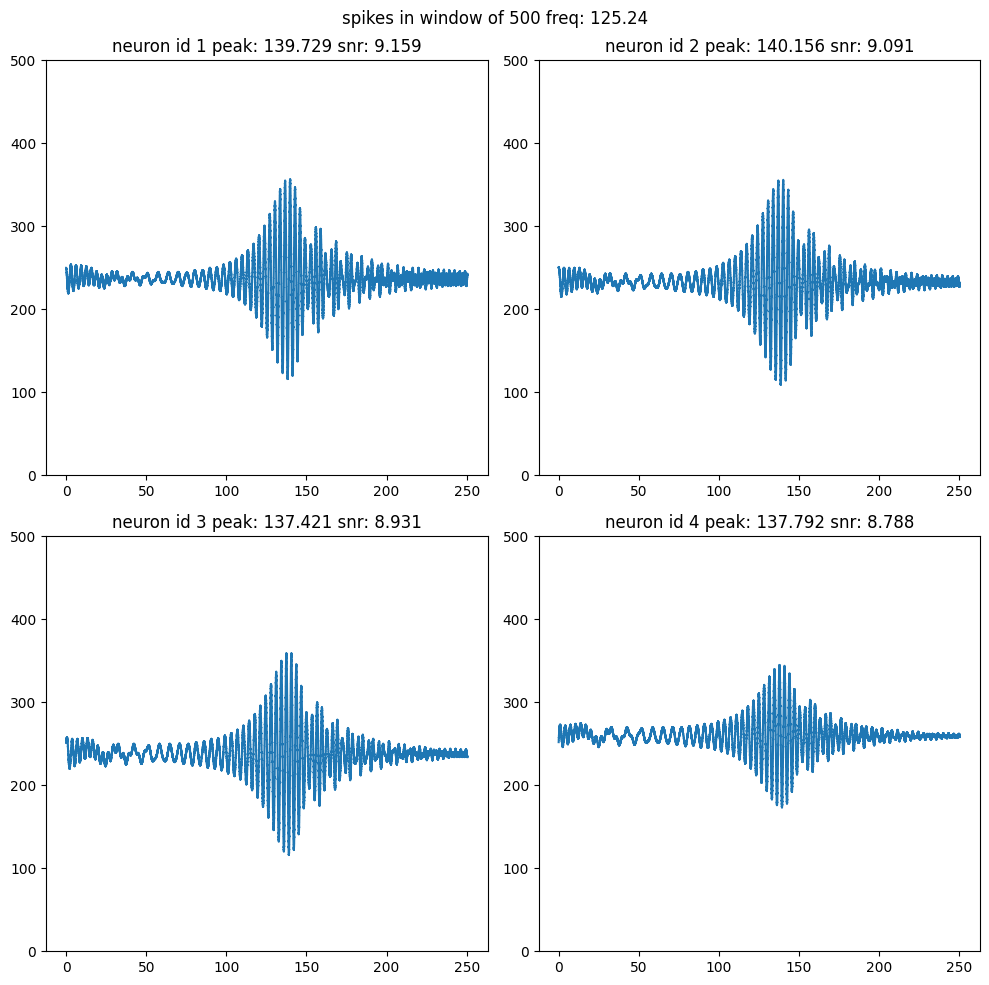

freq0 121.26090902239645
[-1.1428240752574785, -6.007197715577554, -5.624377304964044, -3.8388574071774793]
[16.866709598909708, 14.469229930708018, 12.07246542636058, 11.685605328689888, 8.385783719601177]
# 121.26090902239645 ~ peak 133.744 nid 1 snr 9.022


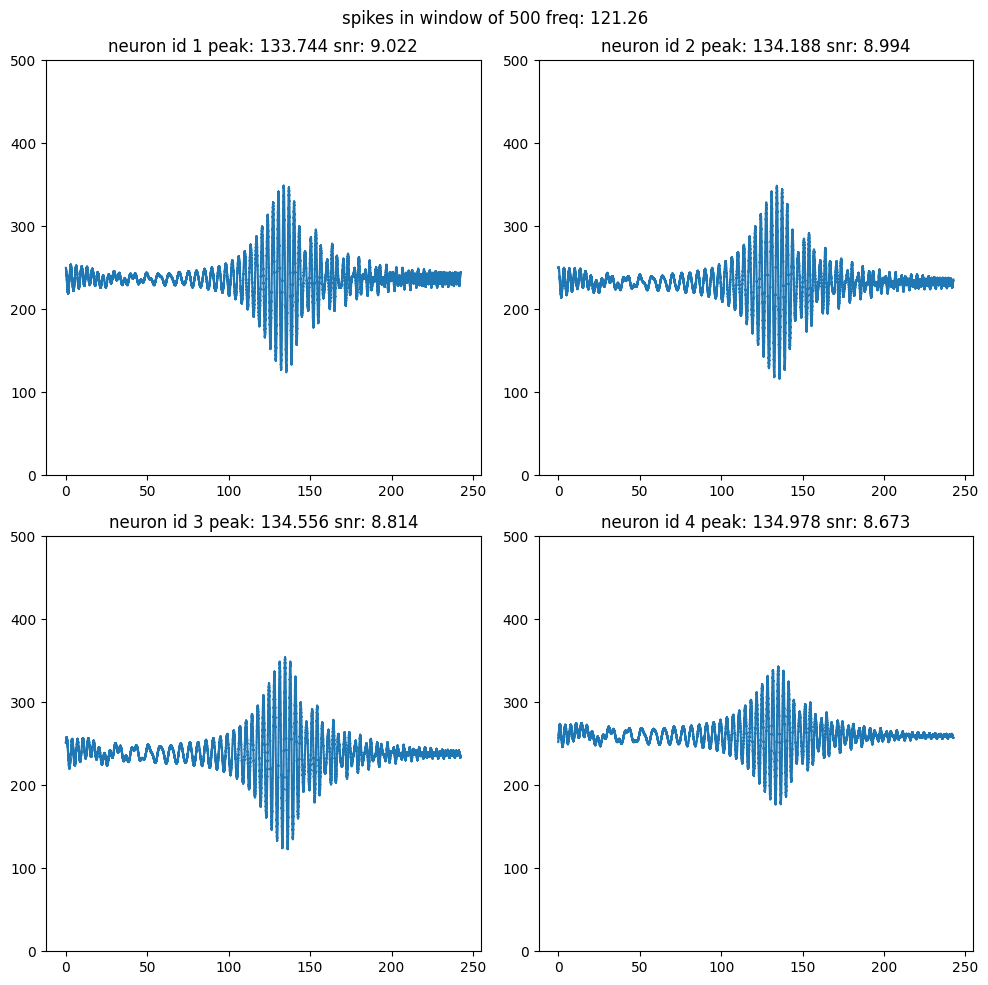

freq0 119.36620731892151
[-1.1314224401029822, -5.933122926087709, -5.555337730411615, -3.8069084746870736]
[16.36261703209047, 13.994008366453997, 11.921195752751736, 11.558539035530892, 8.312955344818496]
# 119.36620731892151 ~ peak 131.458 nid 3 snr 8.723


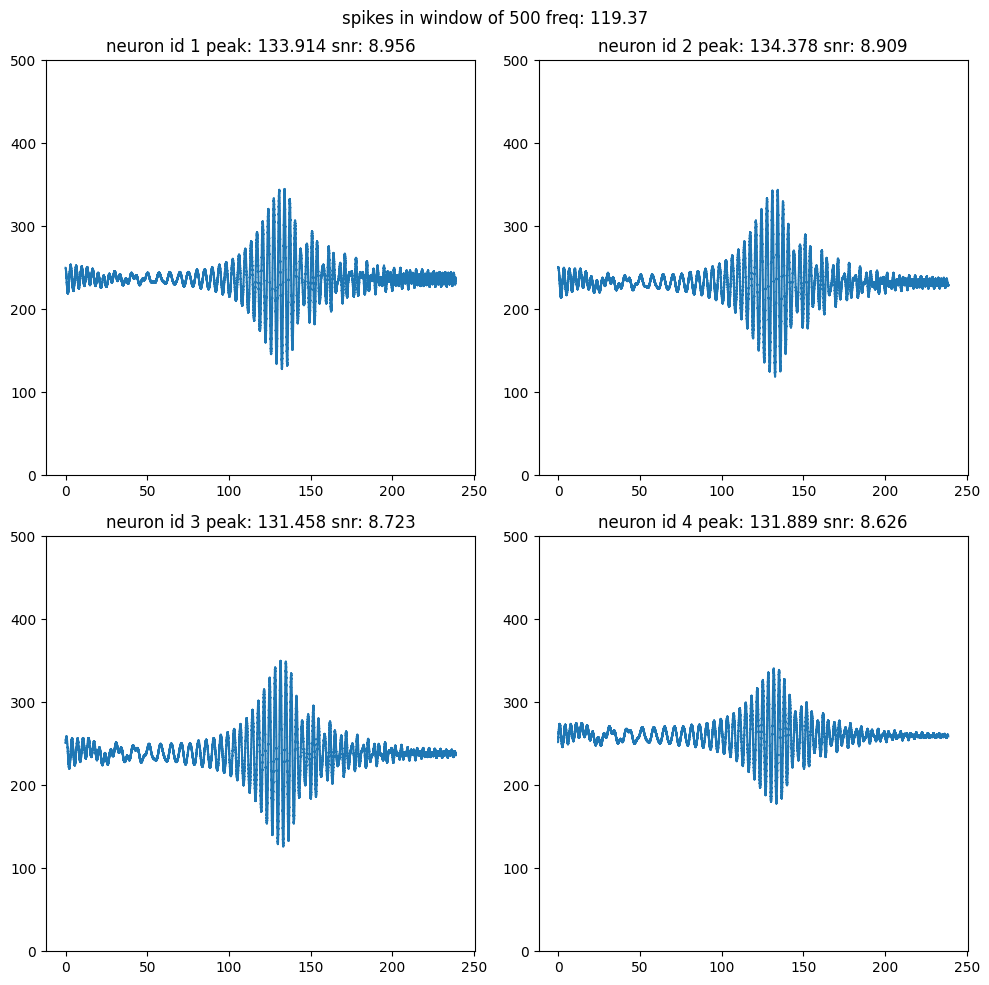

freq0 117.52980412939964
[-1.1211818079941063, -5.862344236270324, -5.488424822052302, -3.776106138097467]
[15.87364302523386, 13.53146242543535, 11.776494321020984, 11.435703118274503, 8.24248626712939]
# 117.52980412939964 ~ peak 130.806 nid 1 snr 8.895


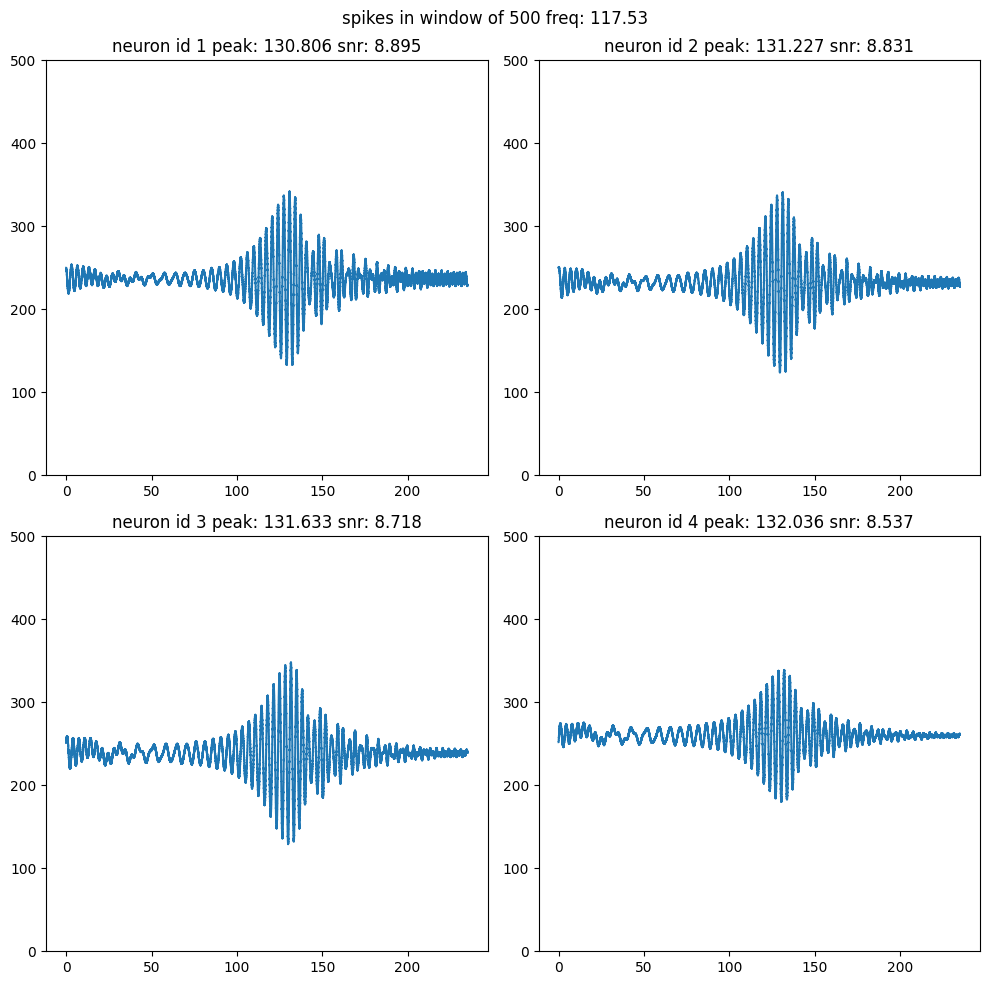

freq0 115.74904952137842
[-1.112023459819314, -5.7946771856259325, -5.423540323937896, -3.7463954963890567]
[15.399096526005167, 13.081062016689103, 11.637997380201114, 11.316891692838105, 8.174270754893834]
# 115.74904952137842 ~ peak 127.601 nid 1 snr 8.867


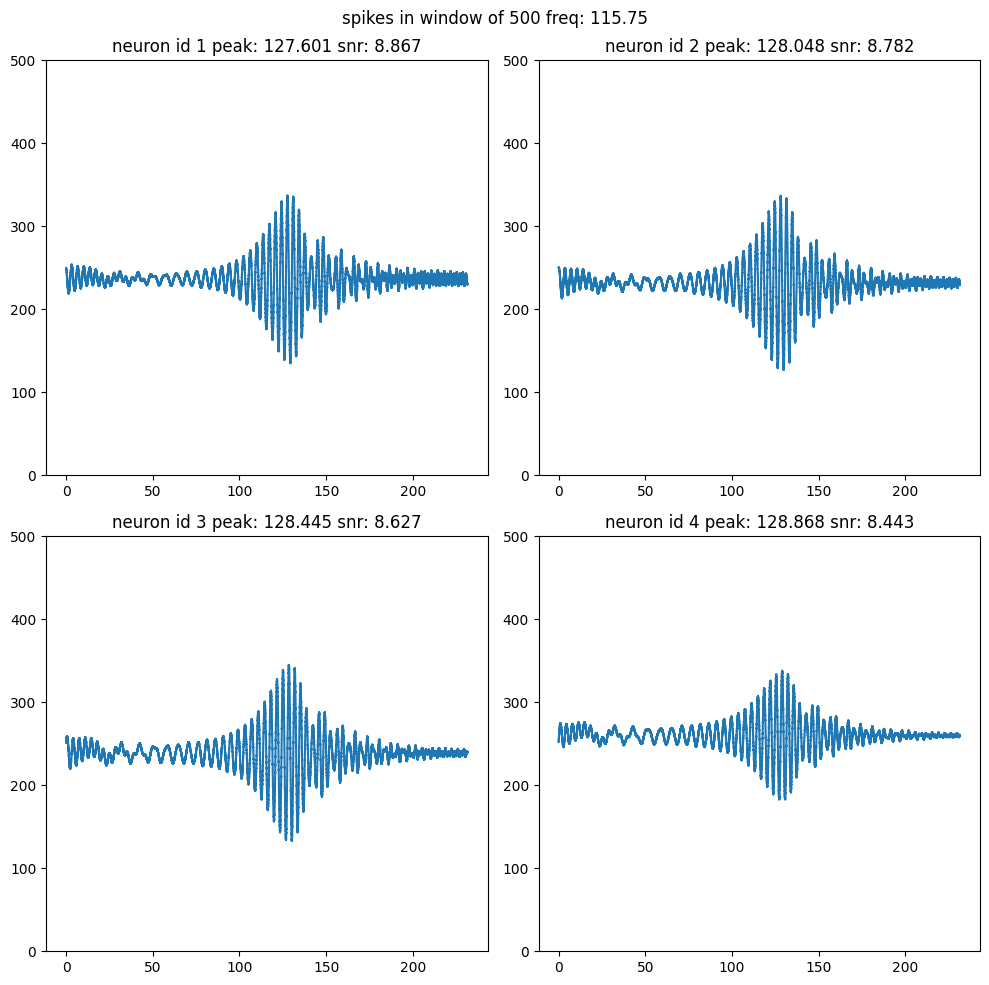

freq0 114.021451767328
[-1.1038743594911926, -5.7299497980701375, -5.360592022978407, -3.717724856949605]
[14.938328971901498, 12.64230802705552, 11.50536566842105, 11.201911933688635, 8.108208956818101]
# 114.021451767328 ~ peak 125.221 nid 3 snr 8.558


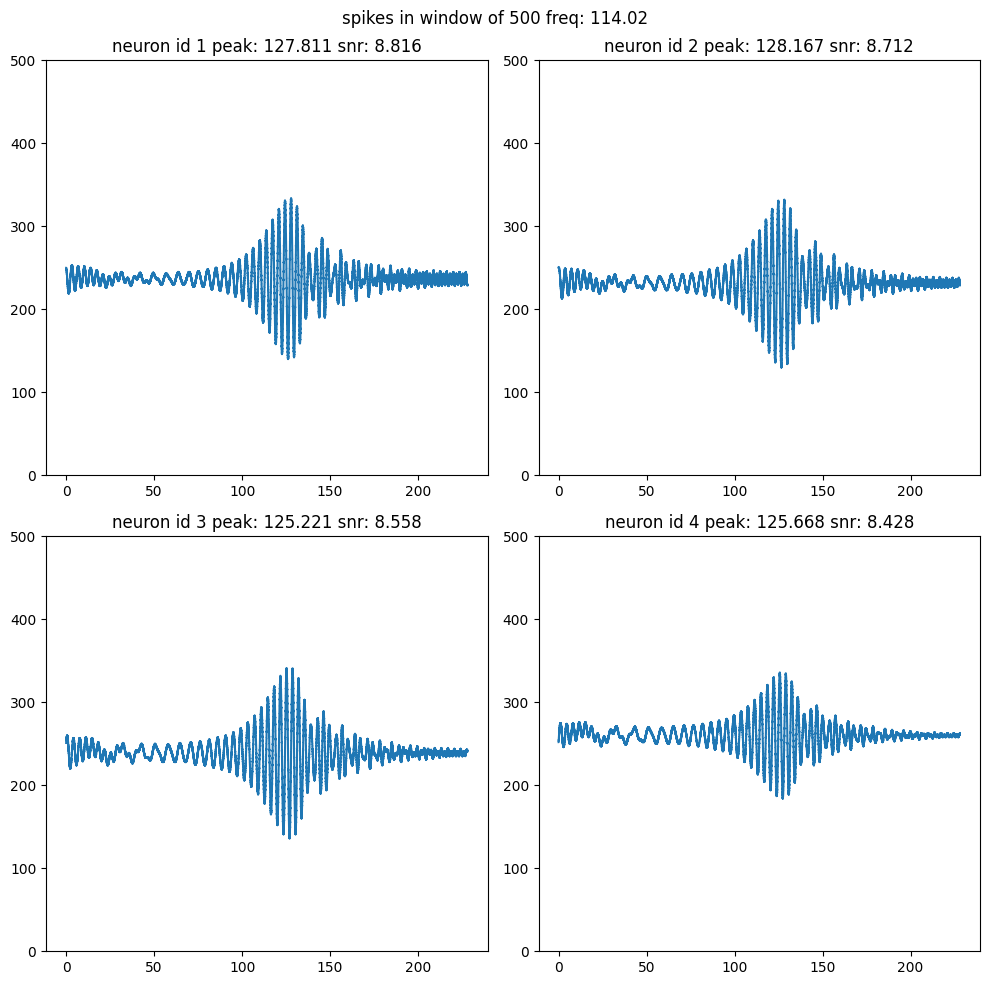

freq0 112.34466571192611
[-1.0966666996599228, -5.668001593083552, -5.299493286032352, -3.690045519198283]
[14.490731021151731, 12.214729970097324, 11.37828247835779, 11.09058305960393, 8.044206521765515]
# 112.34466571192611 ~ peak 124.481 nid 1 snr 8.763


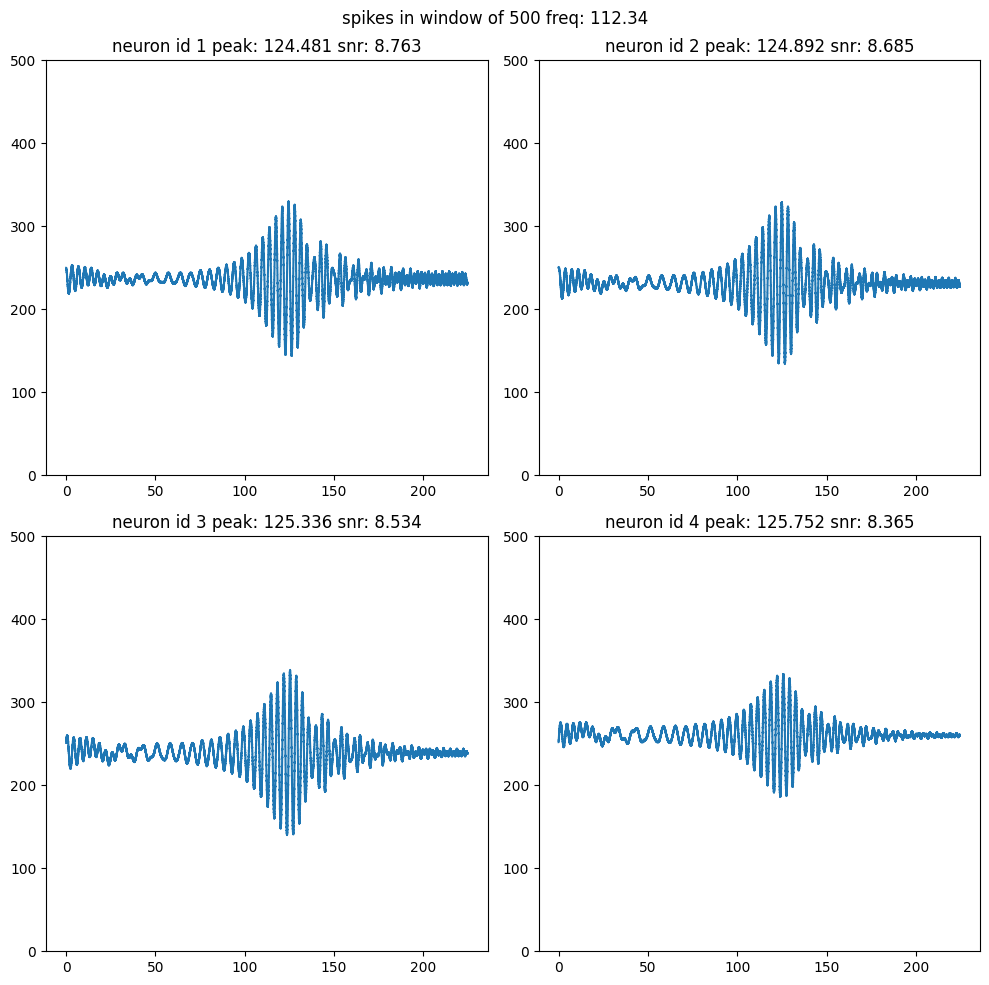

freq0 110.71648215088372
[-1.090337487434149, -5.608682686285327, -5.240162639314823, -3.6633115743002884]
[14.05572958362717, 11.797883854044798, 11.256451897455996, 10.982735412200093, 7.982174245690645]
# 110.71648215088372 ~ peak 121.533 nid 2 snr 8.605


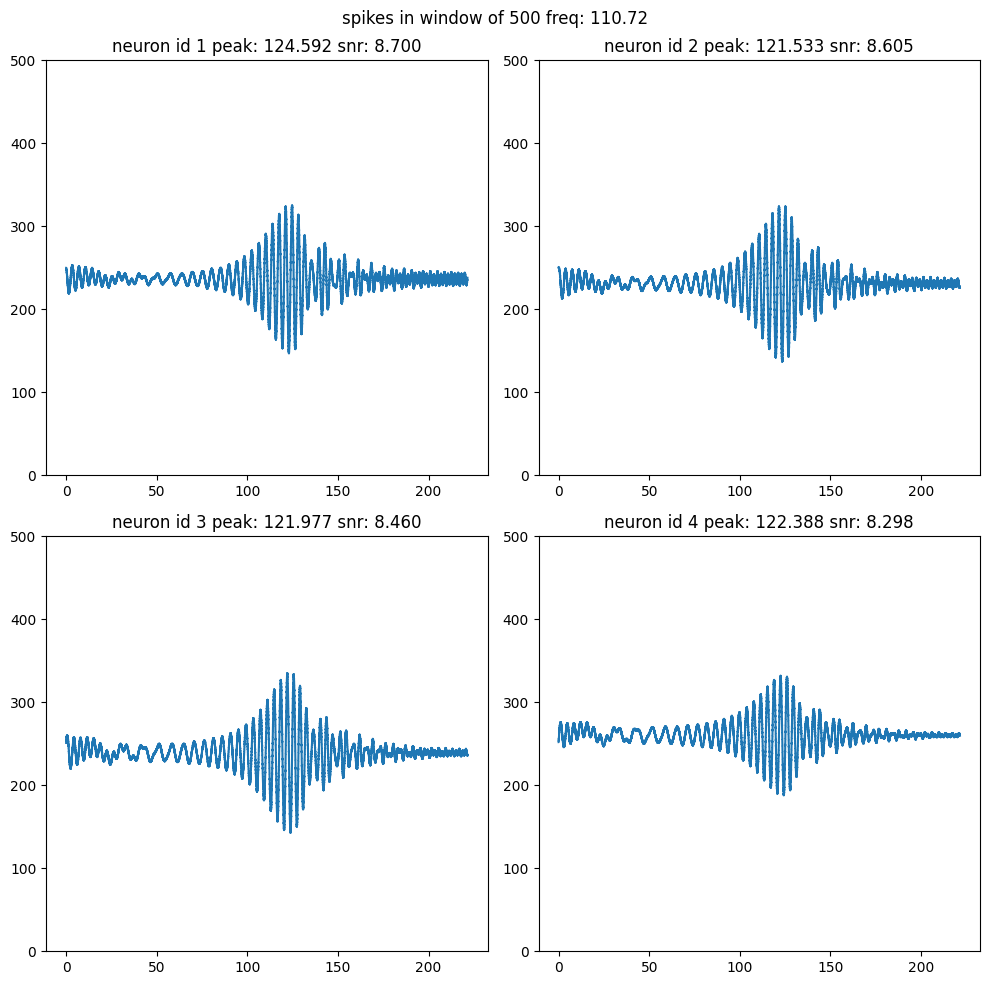

freq0 109.13481812015681
[-1.0848281662819659, -5.551852970368802, -5.182523385643632, -3.637479719716775]
[13.632785120016976, 11.391350244810255, 11.13959720520188, 10.878209617497134, 7.922027743683264]
# 109.13481812015681 ~ peak 121.212 nid 1 snr 8.631


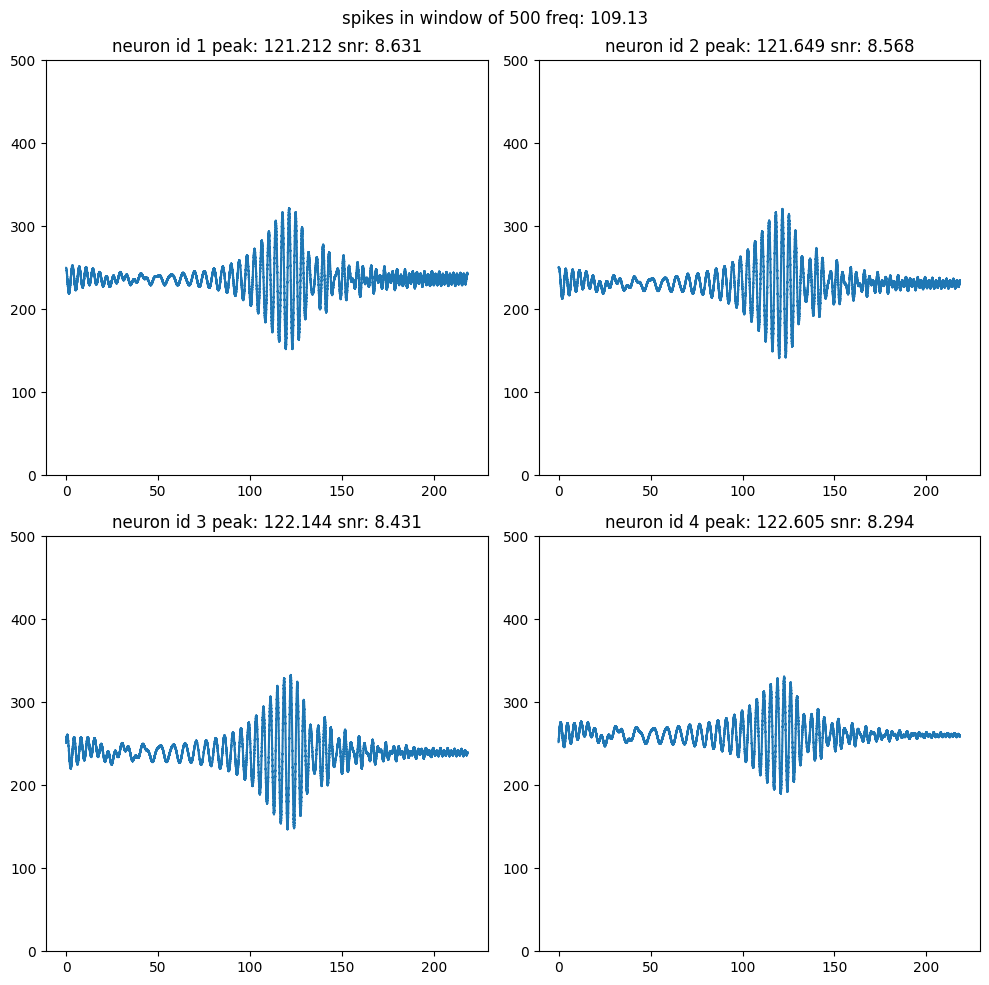

freq0 107.59770800578839
[-1.0800842706755969, -5.497381368351984, -5.126503255580721, -3.61250908742952]
[13.221389181300665, 10.994732503089338, 11.027459411722958, 10.776855821942103, 7.863687145248326]
# 107.59770800578839 ~ peak 117.746 nid 1 snr 8.567


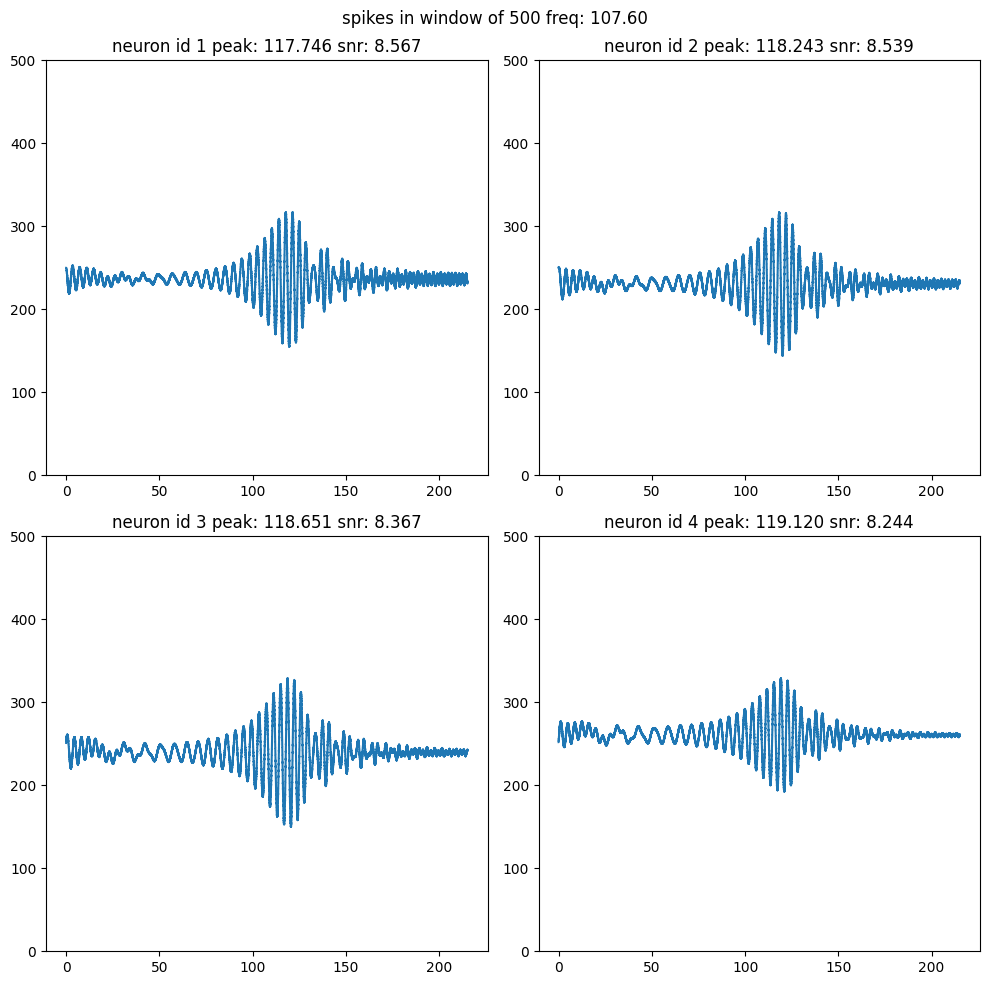

freq0 107.59770800578839
[-1.0800842706755969, -5.497381368351984, -5.126503255580721, -3.61250908742952]
[13.221389181300665, 10.994732503089338, 11.027459411722958, 10.776855821942103, 7.863687145248326]
# 107.59770800578839 ~ peak 117.746 nid 1 snr 8.567


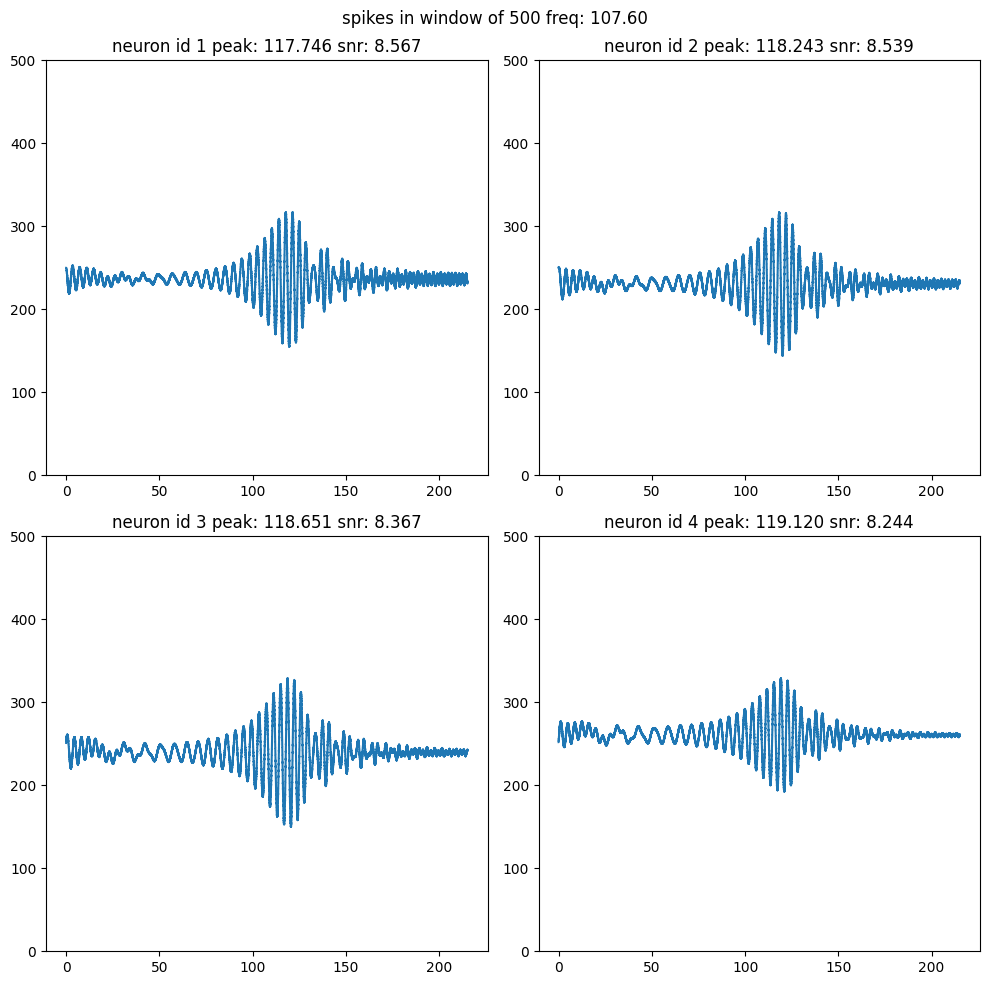

freq0 106.1032953945969
[-1.0760551103925335, -5.445145151985688, -5.072034088991499, -3.5883610847689518]
[12.821062163831556, 10.607655177132543, 10.919795923727236, 10.678532995306025, 7.807076811082185]
# 106.1032953945969 ~ peak 114.637 nid 2 snr 8.323


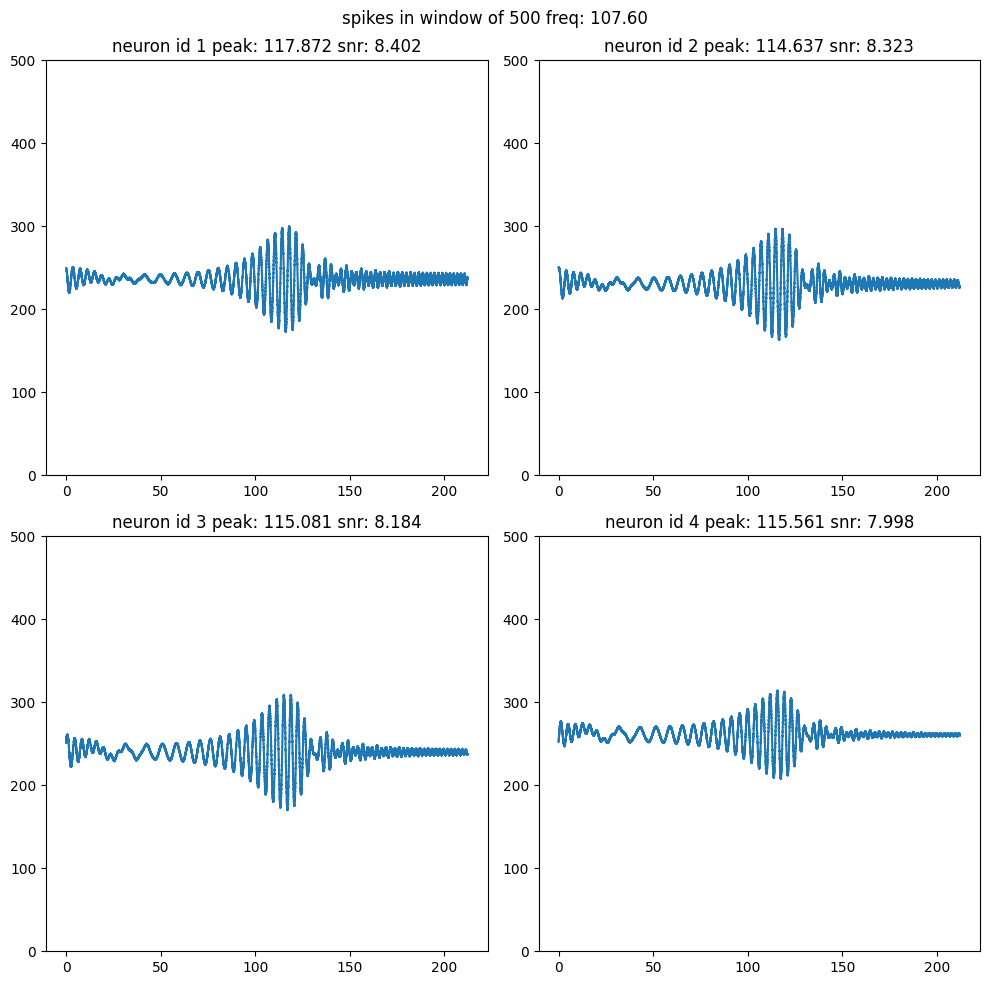

freq0 103.23563876231049
[-1.0699554029112273, -5.34692602311755, -4.967494830260909, -3.5423890997612197]
[12.051828572546526, 9.860717221936923, 10.716996262632641, 10.490456477032417, 7.6987639726483845]
# 103.23563876231049 ~ peak 114.383 nid 1 snr 8.376


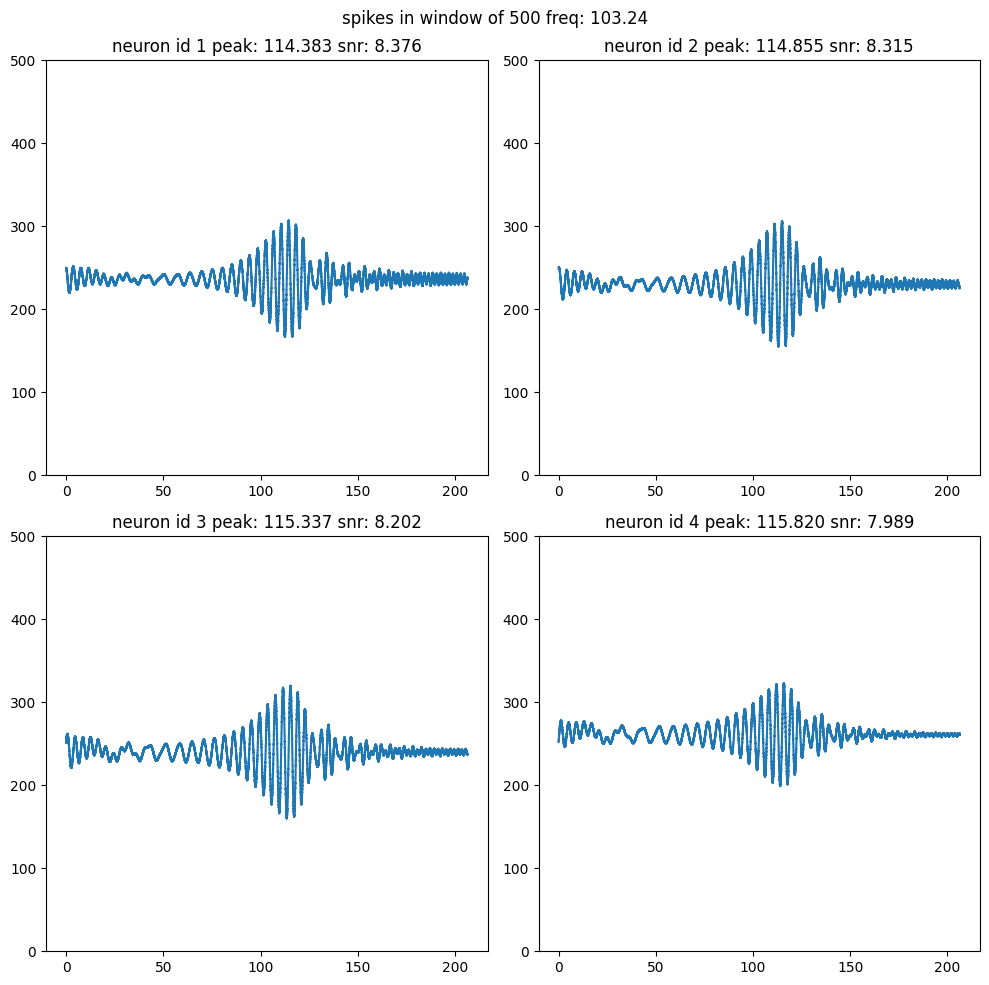

freq0 101.85916357881302
[-1.0677998721113946, -5.3007340529145175, -4.917306465207185, -3.520498033505075]
[11.682089413137078, 9.500199030515276, 10.621446422216636, 10.400459374779185, 7.646929066242752]
# 101.85916357881302 ~ peak 111.186 nid 2 snr 8.296


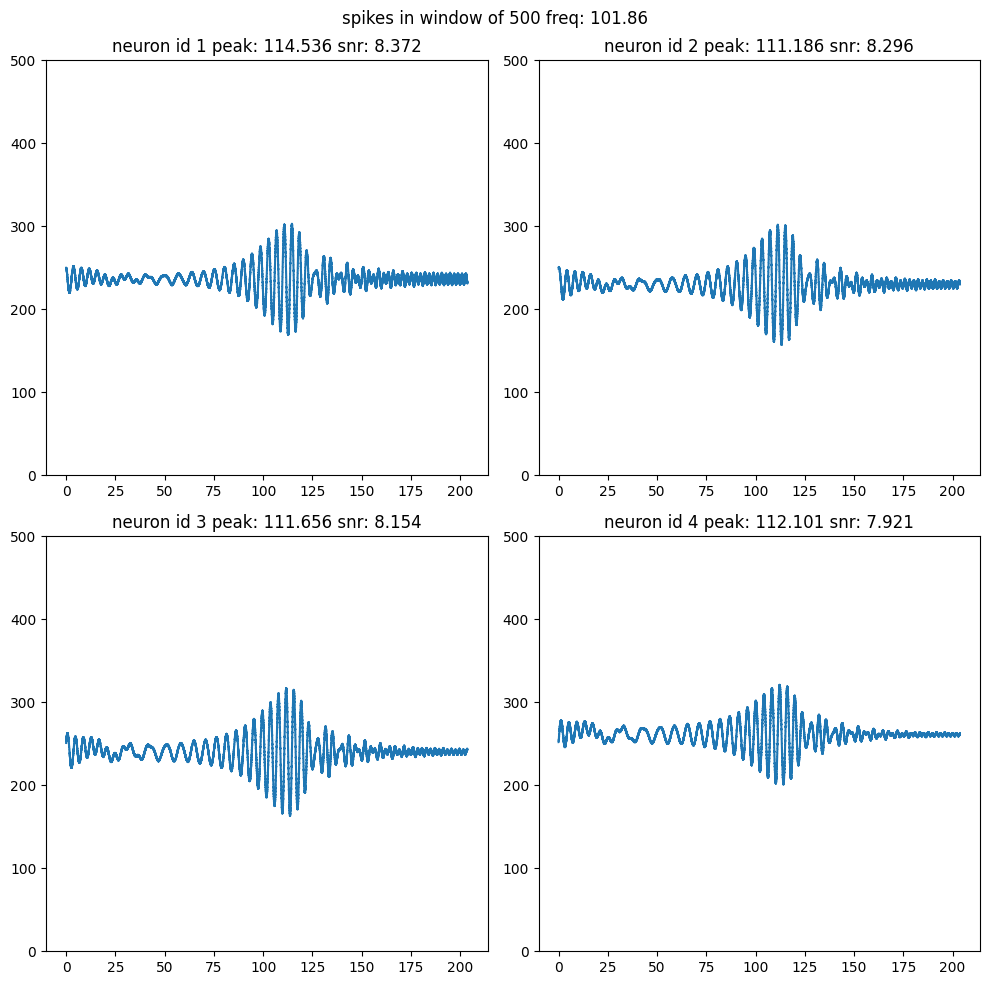

freq0 100.51891142646022
[-1.066188644953768, -5.2563583530576246, -4.868432049338965, -3.499295184194864]
[11.321750706986563, 9.14790377195726, 10.529541594544071, 10.313005396747624, 7.596559179688235]
# 100.51891142646022 ~ peak 110.795 nid 1 snr 8.304


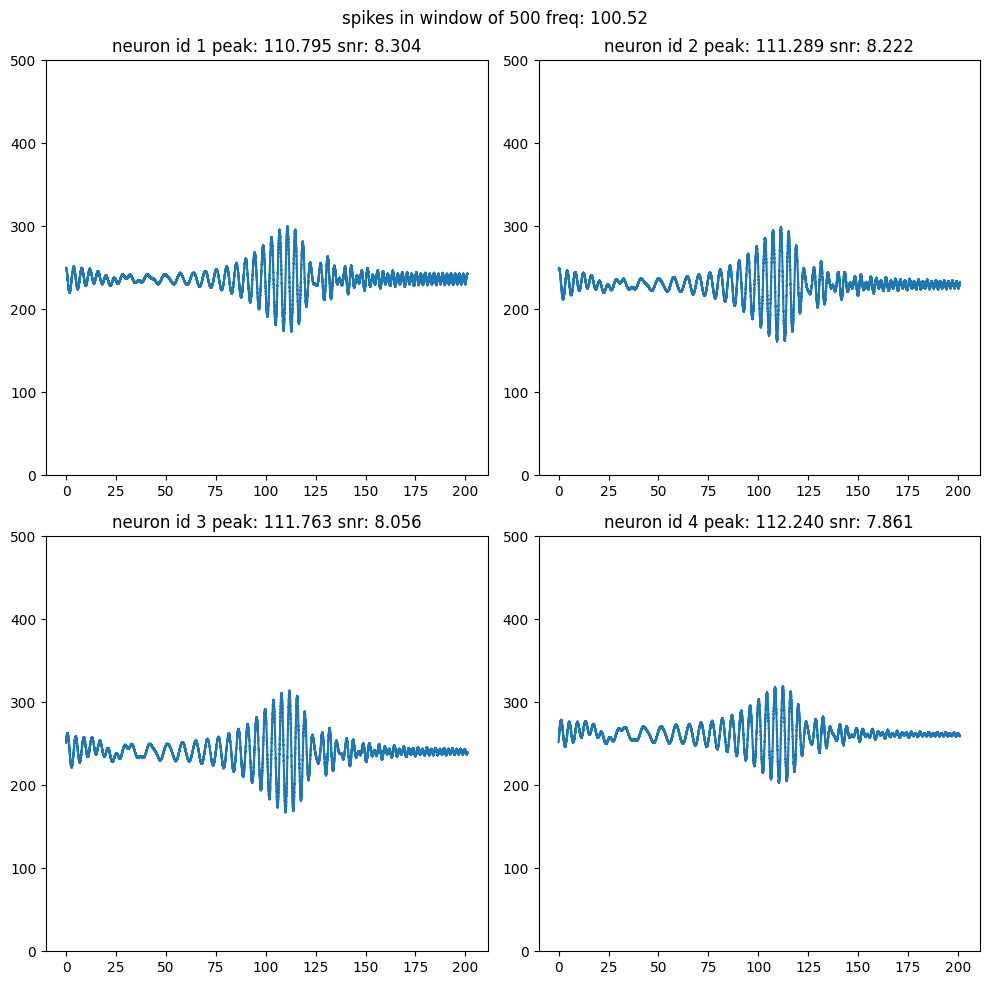

freq0 99.21347101832437
[-1.0650860307764214, -5.213709585781963, -4.820820060431405, -3.4787513245255397]
[10.970449552903005, 8.80354223917297, 10.44110481446009, 10.227989083241528, 7.547596227273168]
# 99.21347101832437 ~ peak 107.977 nid 3 snr 7.990


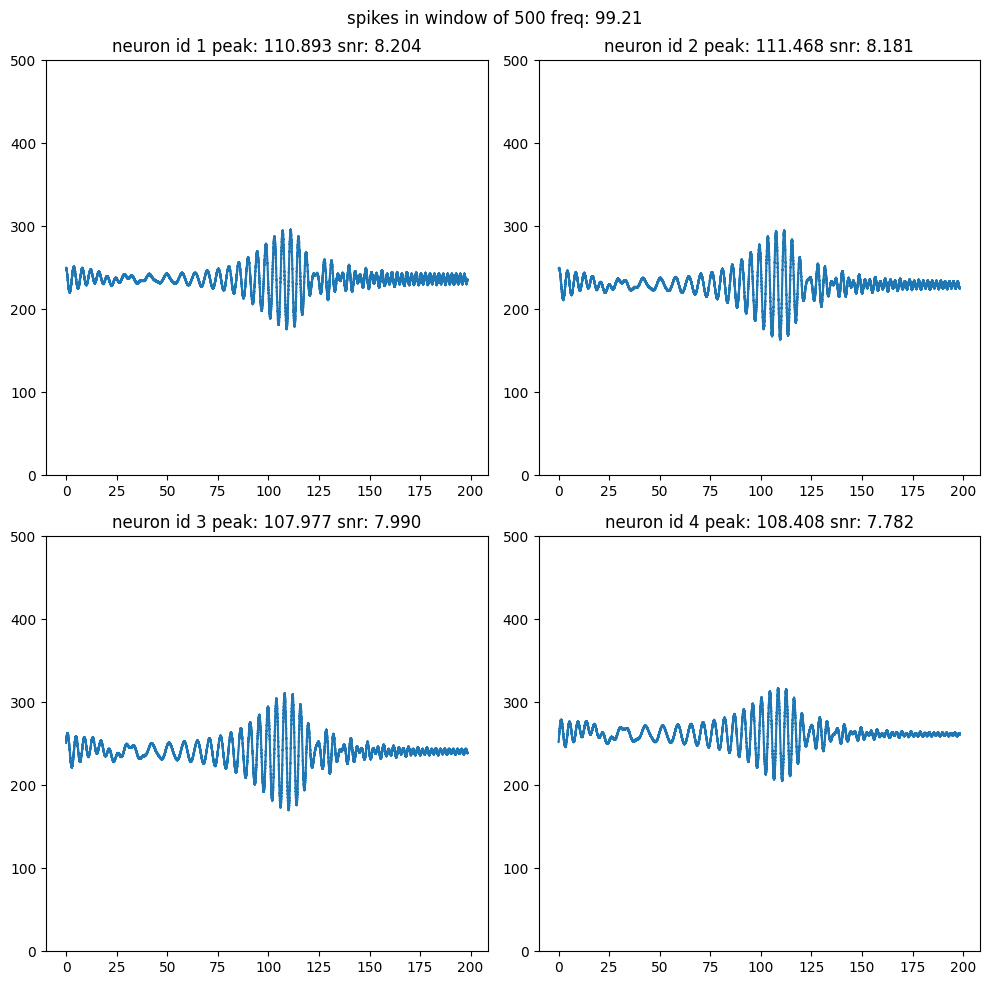

freq0 97.94150344116636
[-1.0644587053482386, -5.172703727805516, -4.774421663884025, -3.4588387620333254]
[10.627841888860445, 8.466839252467949, 10.355969571593405, 10.145310691711256, 7.4999850242292965]
# 97.94150344116636 ~ peak 107.045 nid 1 snr 8.096


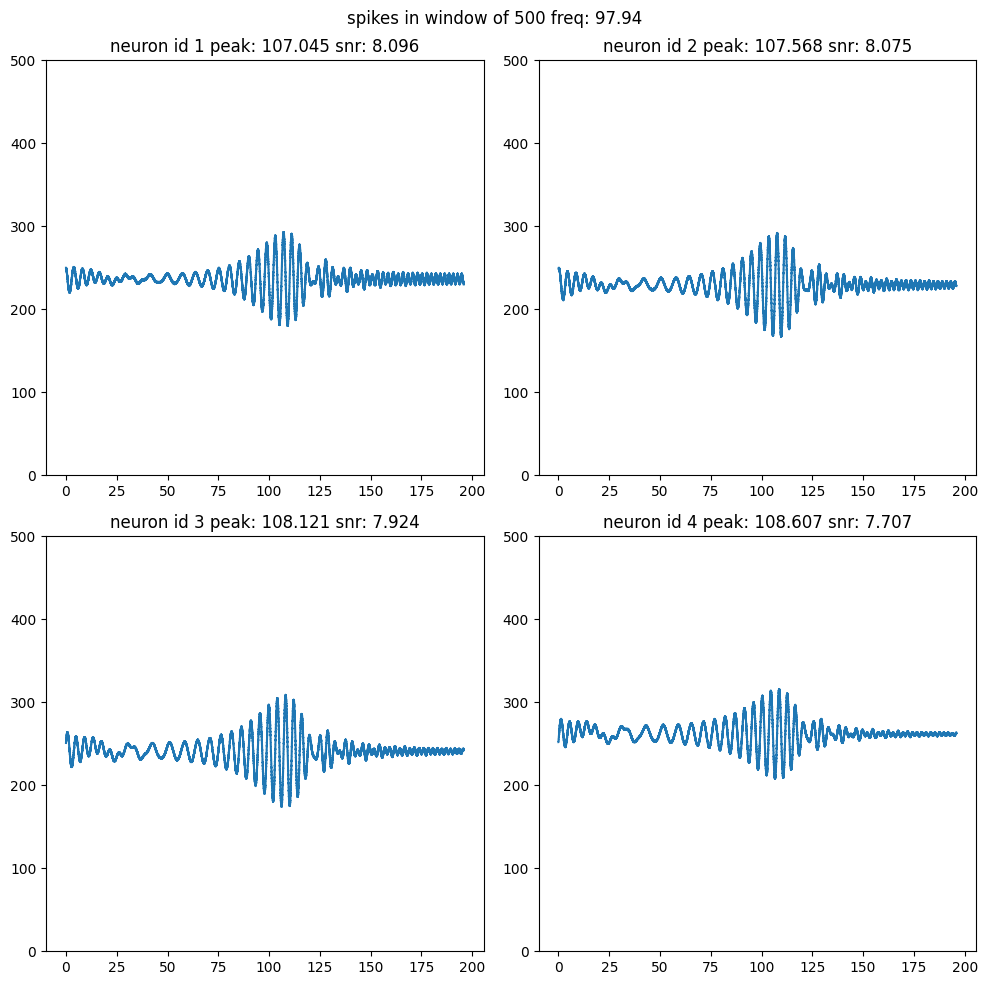

freq0 97.94150344116636
[-1.0644587053482386, -5.172703727805516, -4.774421663884025, -3.4588387620333254]
[10.627841888860445, 8.466839252467949, 10.355969571593405, 10.145310691711256, 7.4999850242292965]
# 97.94150344116636 ~ peak 107.045 nid 1 snr 8.096


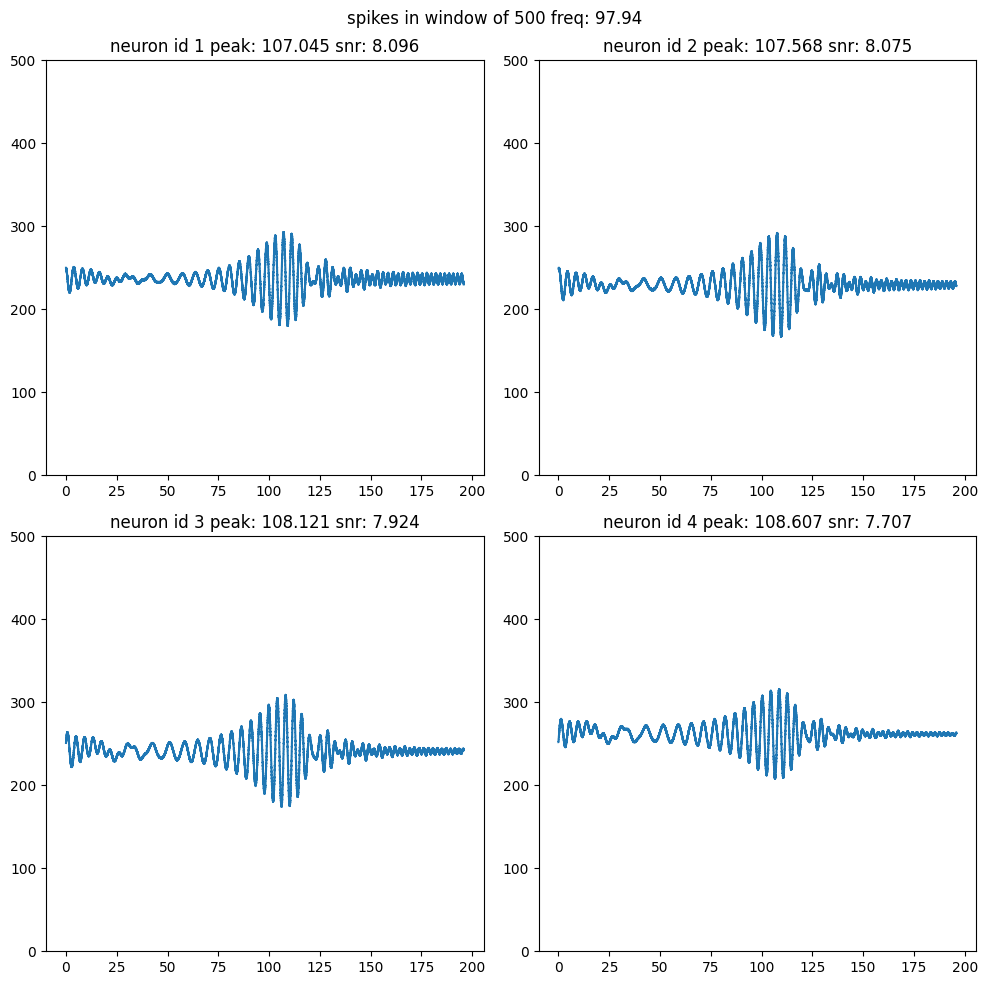

freq0 95.4929658551372
[-1.0645074372074594, -5.095309025379212, -4.685082713106647, -3.420803871903006]
[9.967417711649873, 7.815373127295018, 10.194985631332031, 9.986595037008176, 7.408610613236132]
# 95.4929658551372 ~ peak 103.198 nid 1 snr 7.942


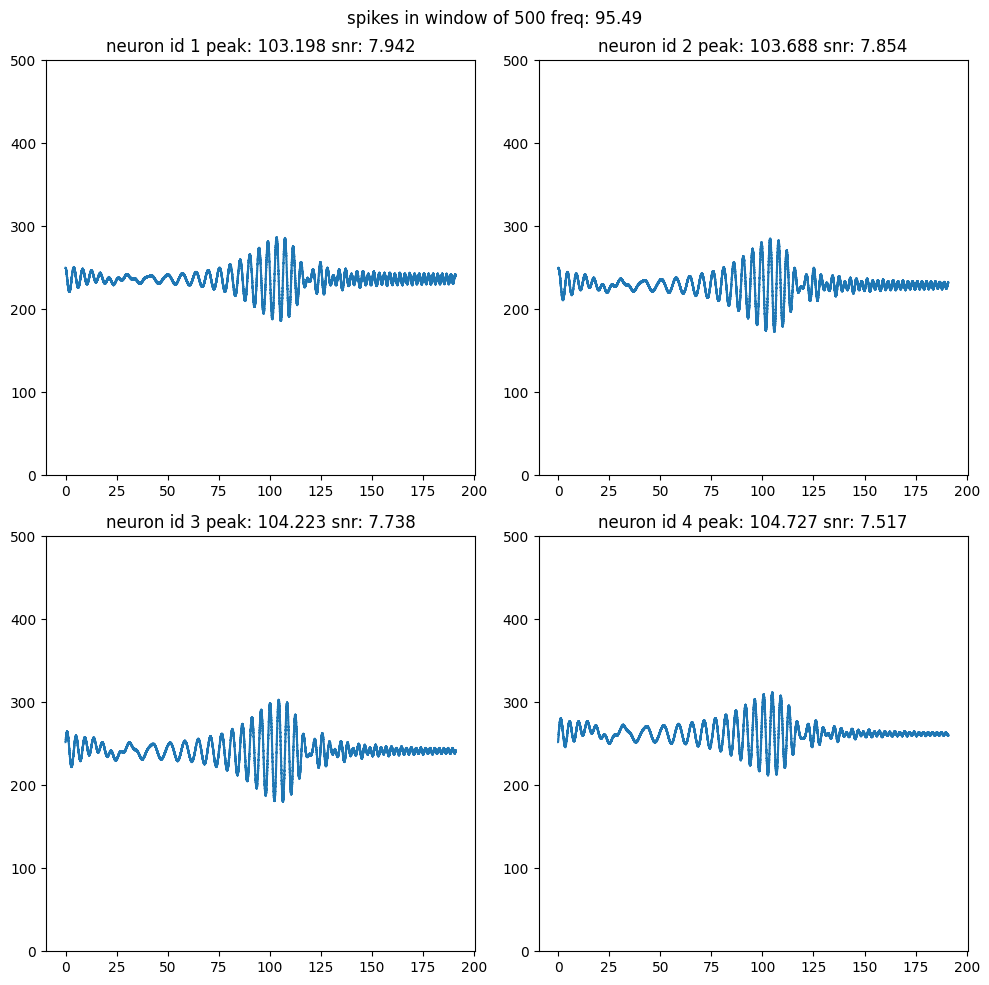

freq0 94.3140403507528
[-1.0651271971771372, -5.058775517084857, -4.642056422319902, -3.4026330145807817]
[9.648996696459974, 7.500122185707809, 10.118849936268354, 9.910383596716507, 7.364750052034289]
# 94.3140403507528 ~ peak 100.706 nid 4 snr 7.421


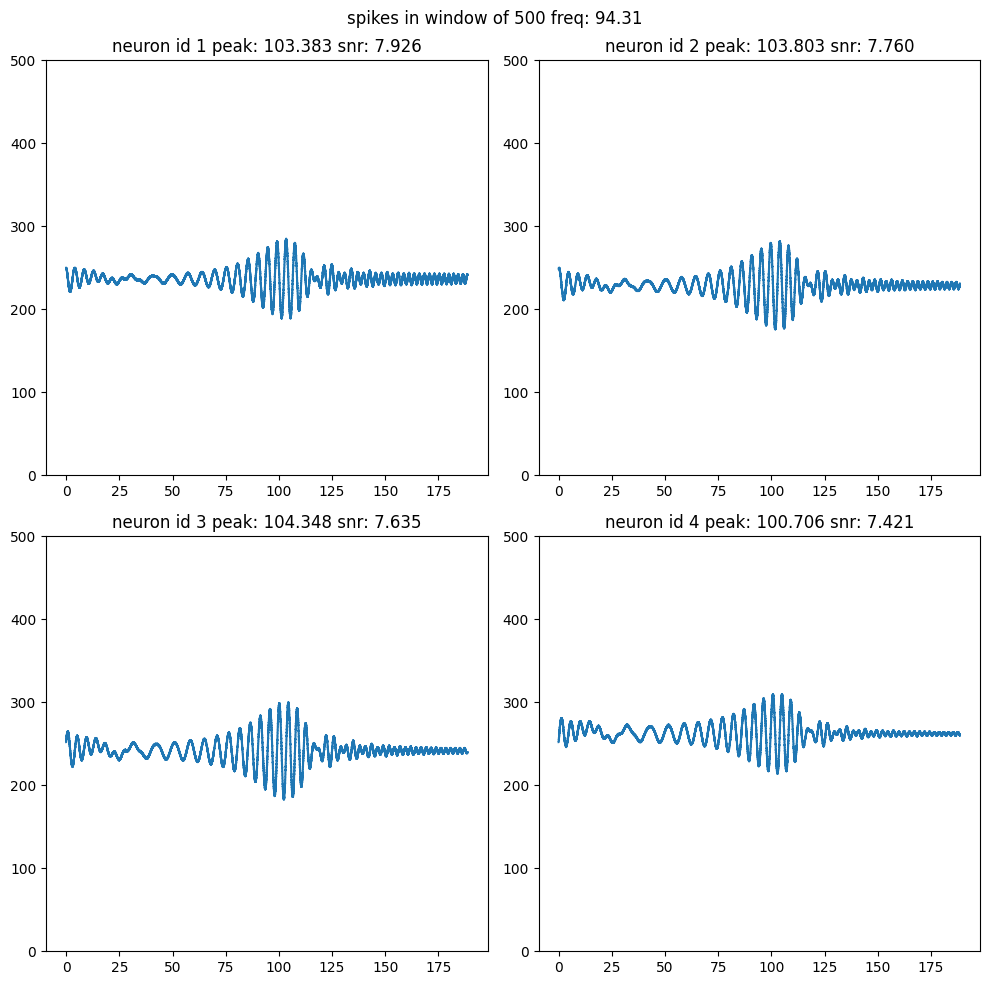

freq0 93.16386912696314
[-1.066109371395127, -5.02359498677415, -4.600071964482069, -3.384996236860748]
[9.338058158238312, 7.191552740734224, 10.045440599705351, 9.836161102084187, 7.322046244687828]
# 93.16386912696314 ~ peak 99.190 nid 1 snr 7.786


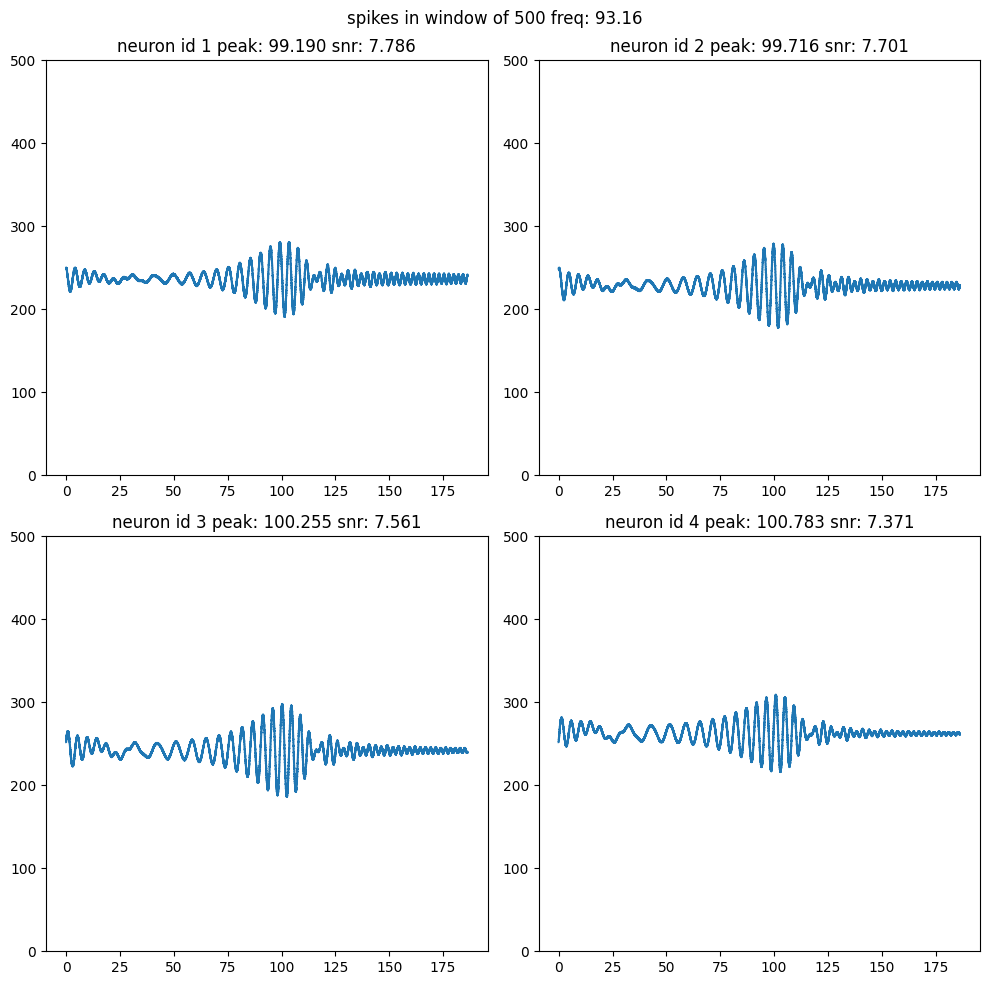

freq0 92.04141287242139
[-1.0674301450853898, -4.98970497846982, -4.559091576660771, -3.3678722260135823]
[9.034335615112852, 6.889447828703638, 9.974633575351078, 9.763851247704256, 7.280456154170784]
# 92.04141287242139 ~ peak 99.265 nid 1 snr 7.720


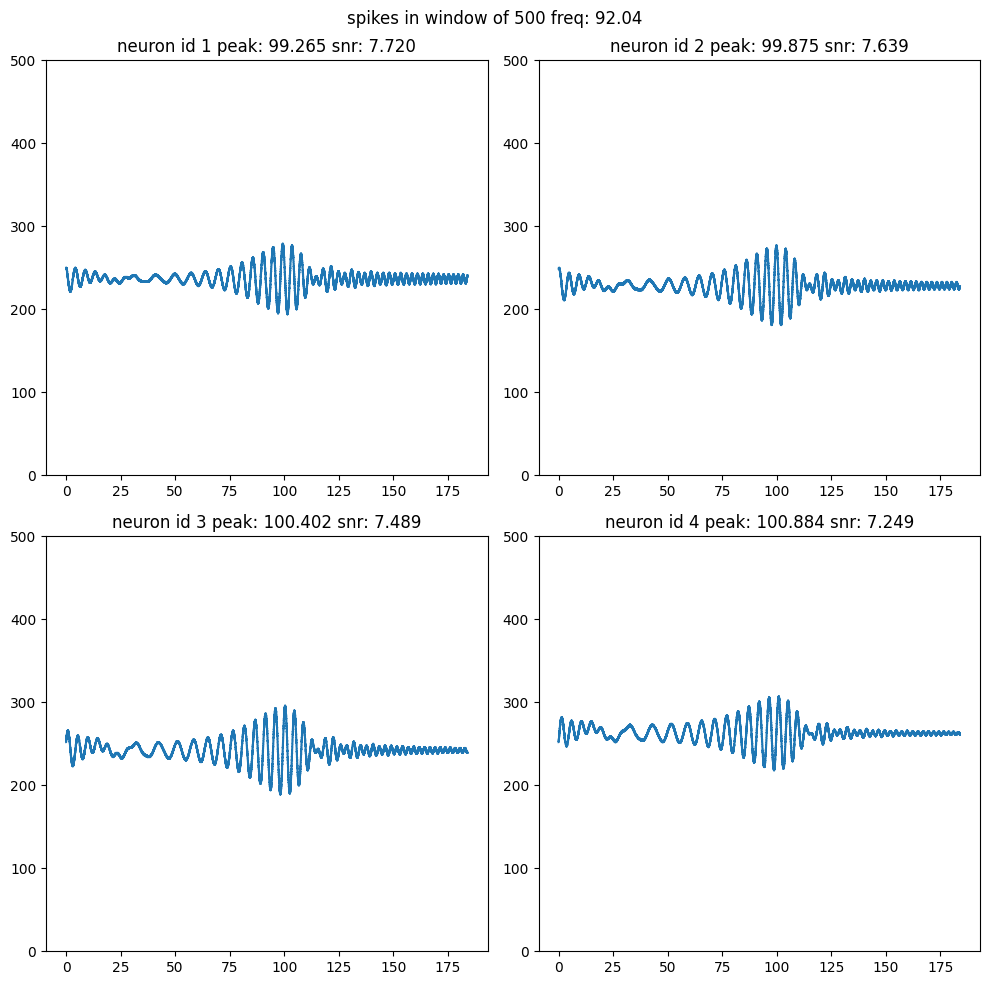

freq0 90.94568176679734
[-1.0690672219113395, -4.957046521603996, -4.519079316296809, -3.351240725968932]
[8.737575337944406, 6.593600141256431, 9.906311686023273, 9.693381560616103, 7.239938771320455]
# 90.94568176679734 ~ peak 96.011 nid 3 snr 7.257


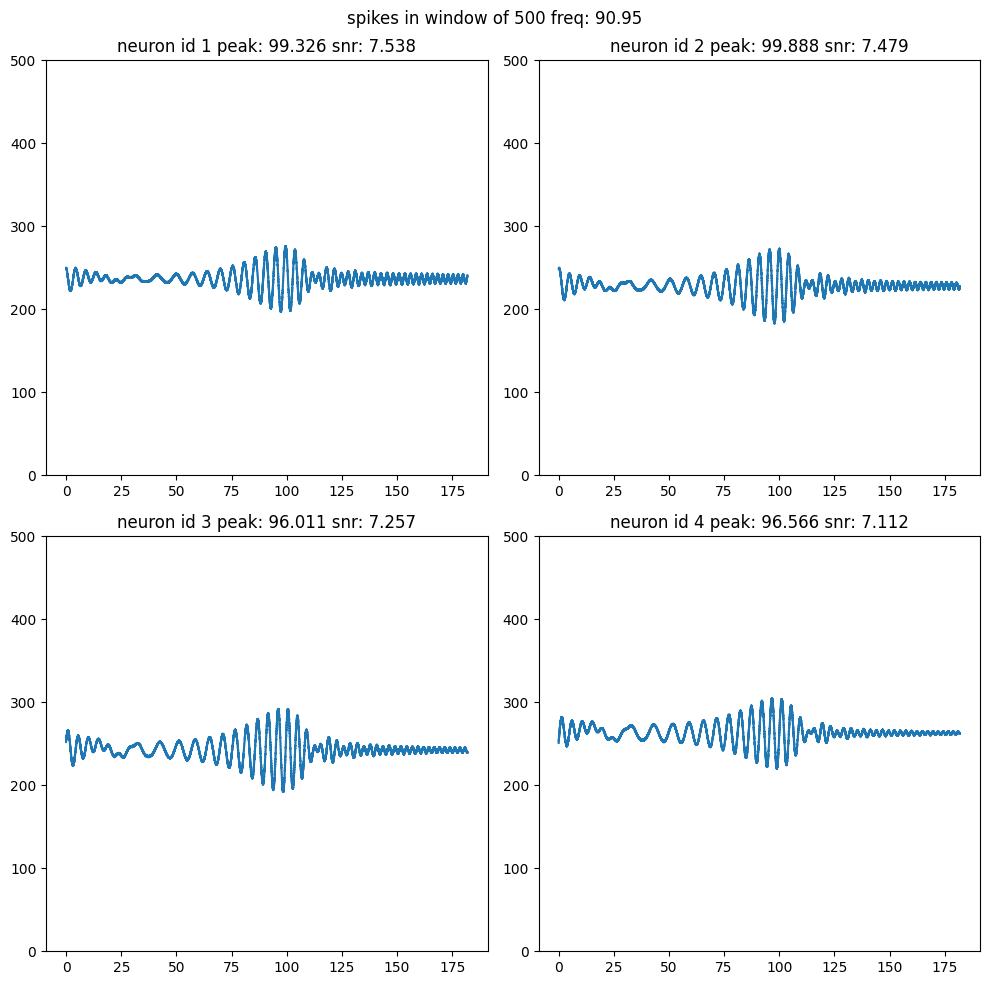

freq0 89.8757325695409
[-1.070999718691401, -4.9255639029429545, -4.480000951875084, -3.335082475490754]
[8.447535584236945, 6.30381147228168, 9.84036417619135, 9.624683163716465, 7.2004550008916866]
# 89.8757325695409 ~ peak 95.137 nid 1 snr 7.524


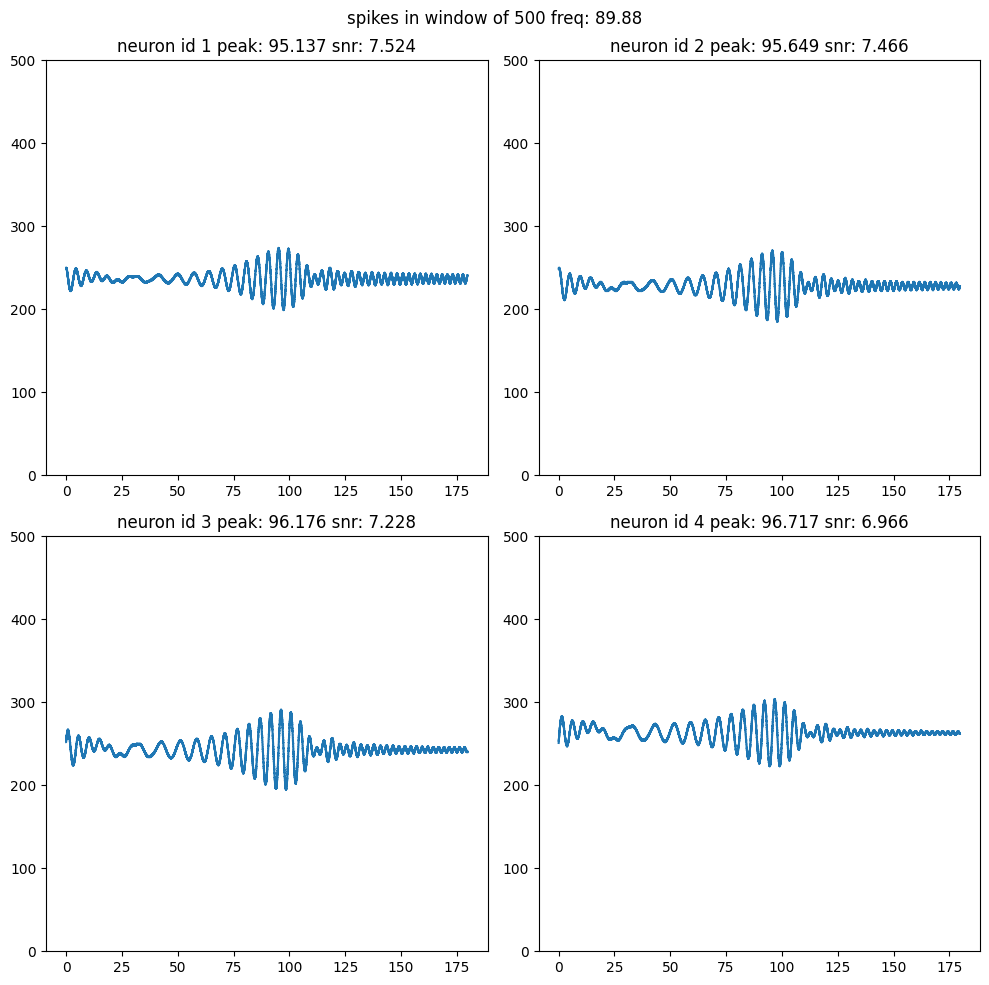

freq0 89.8757325695409
[-1.070999718691401, -4.9255639029429545, -4.480000951875084, -3.335082475490754]
[8.447535584236945, 6.30381147228168, 9.84036417619135, 9.624683163716465, 7.2004550008916866]
# 89.8757325695409 ~ peak 95.137 nid 1 snr 7.524


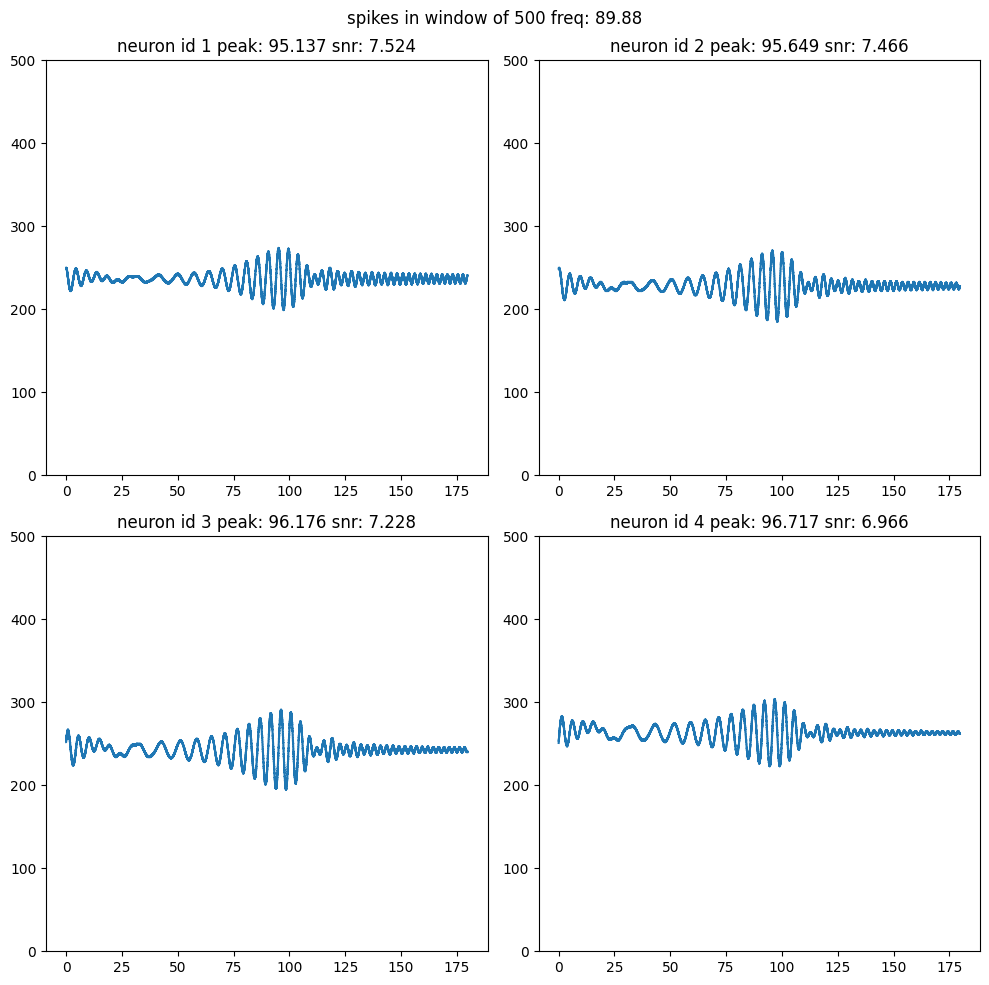

freq0 88.83066591175555
[-1.0732080681595892, -4.895204455598524, -4.441823861442179, -3.319379150473245]
[8.163985887288831, 6.019892203871905, 9.776686297949901, 9.557690556424717, 7.161967554945072]
# 88.83066591175555 ~ peak 91.652 nid 3 snr 6.798


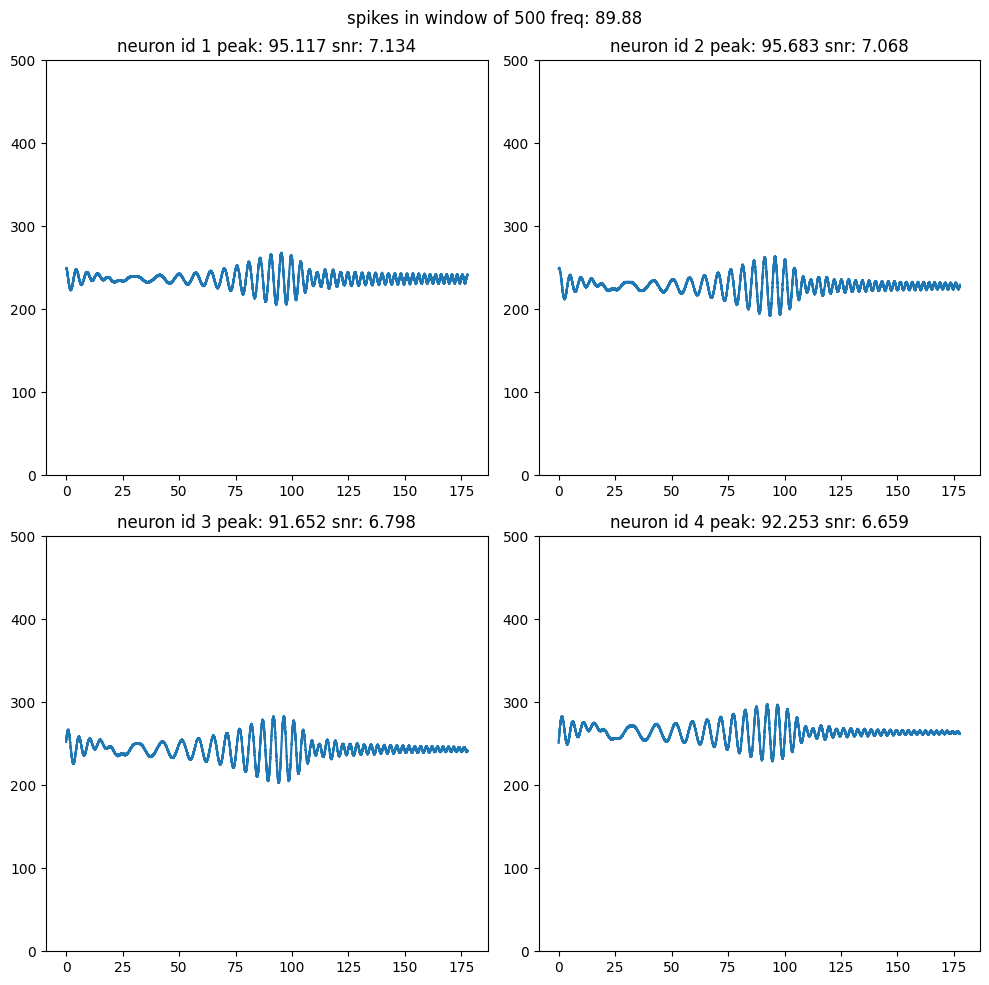

freq0 86.81178714103383
[-1.0783801032222247, -4.837658481334529, -4.368050503401584, -3.289268346258069]
[7.615487260824466, 5.468943501118417, 9.655748210380736, 9.42857638429, 7.0878409287835495]
# 86.81178714103383 ~ peak 90.706 nid 1 snr 7.117


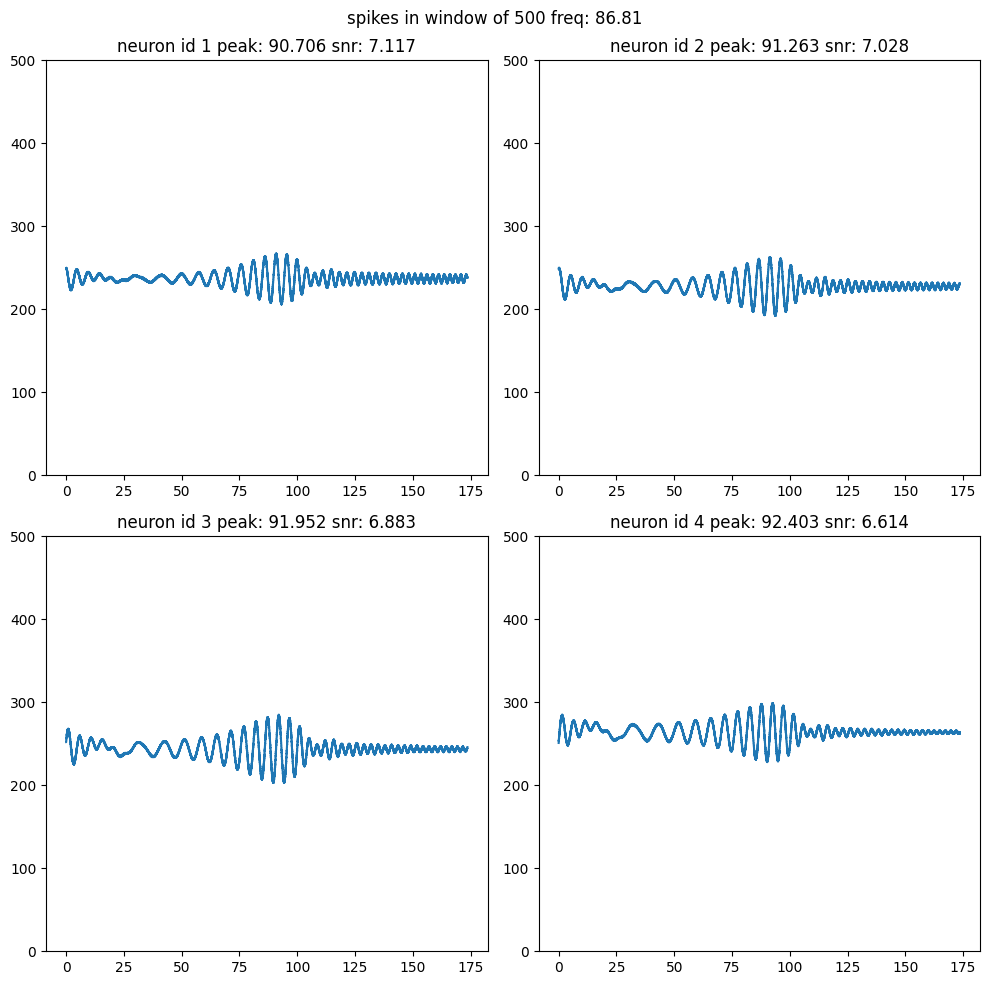

freq0 85.83637380237052
[-1.0813104582812887, -4.8103801648346085, -4.332396223559046, -3.2748284369341363]
[7.35012806303186, 5.201573628541922, 9.59830523076451, 9.366338940454867, 7.052135342184911]
# 85.83637380237052 ~ peak 87.196 nid 3 snr 6.698


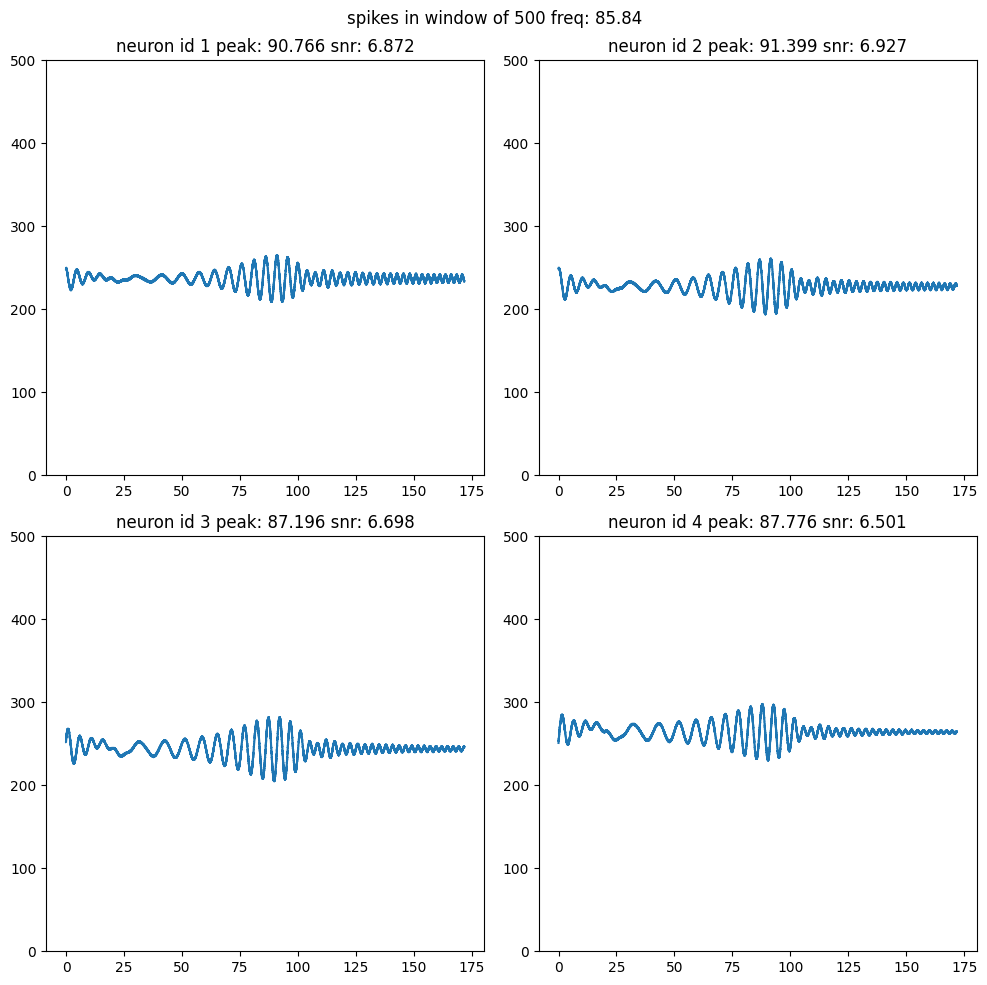

freq0 84.88263631567752
[-1.0844498568331336, -4.784041116899303, -4.2975270355659045, -3.260778501713813]
[7.090437282234873, 4.939391476967927, 9.542765706669165, 9.305575189036404, 7.017293097575973]
# 84.88263631567752 ~ peak 86.119 nid 1 snr 6.852


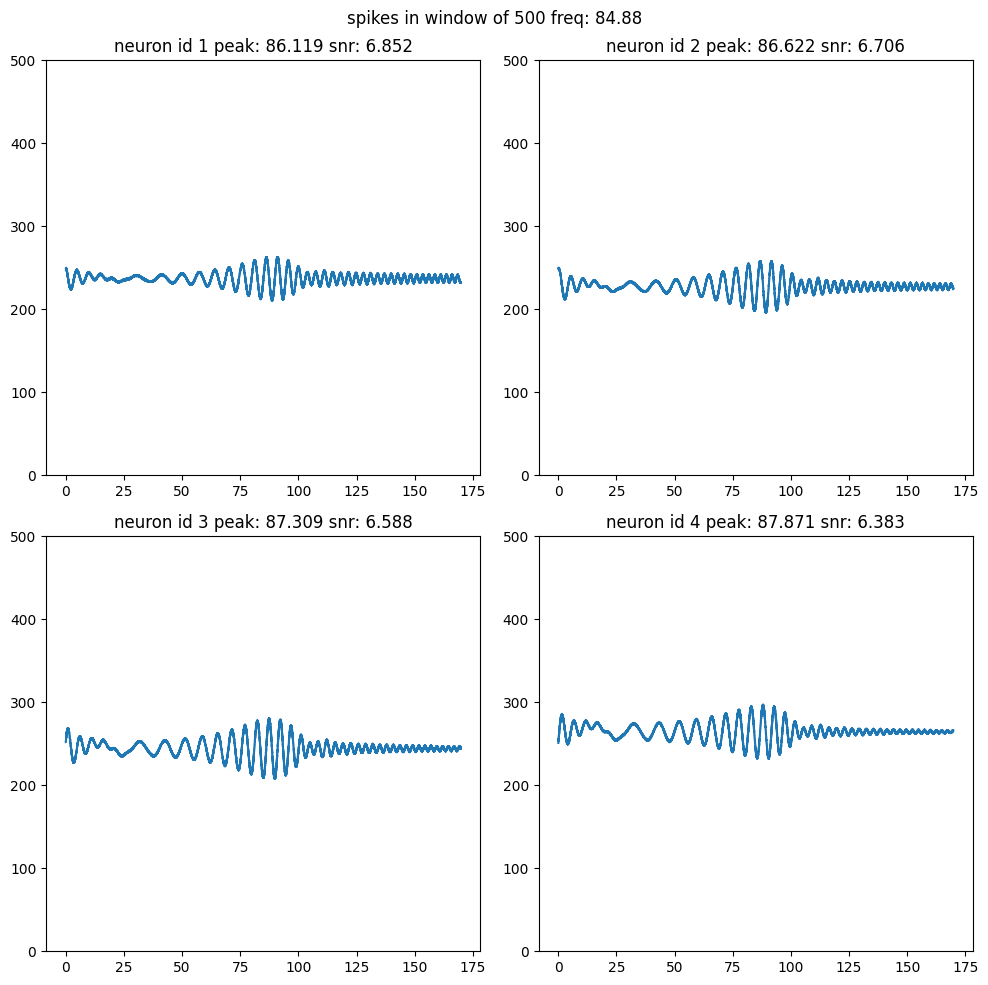

freq0 83.94986009242831
[-1.087784090265007, -4.758601242008563, -4.263417075202069, -3.247104160806944]
[6.836231800654232, 4.682243812162795, 9.48904970522009, 9.246233731945104, 6.9832845665441425]
# 83.94986009242831 ~ peak 86.288 nid 1 snr 6.811


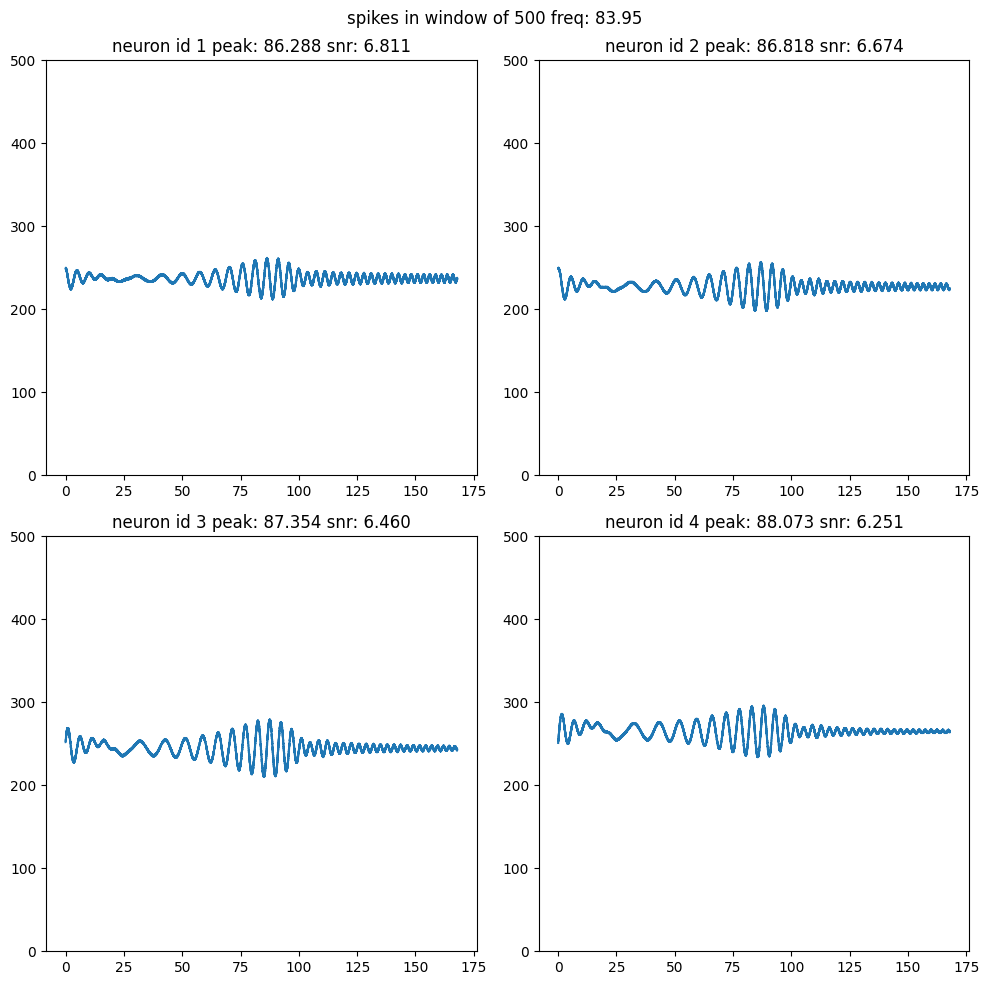

freq0 83.03736161316279
[-1.091299817618351, -4.734022511977589, -4.230041611072382, -3.2337916964123705]
[6.587336440317969, 4.429983560284555, 9.437081378594954, 9.188265521742661, 6.950081415629185]
# 83.03736161316279 ~ peak 82.948 nid 4 snr 5.998


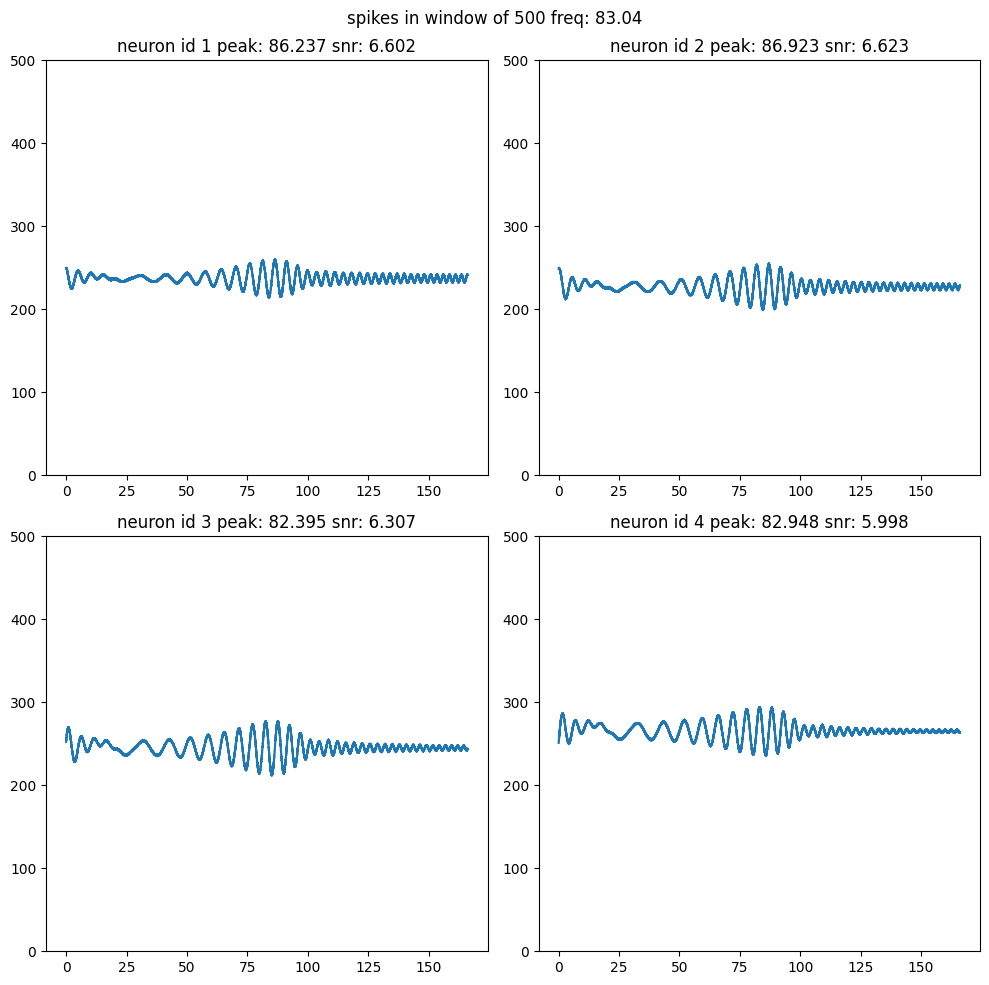

freq0 82.14448675710727
[-1.0949845088400316, -4.710268840927327, -4.197376982794134, -3.220828016564554]
[6.343583530925855, 4.182469490872336, 9.386788718274133, 9.131623729319045, 6.917656538423891]
# 82.14448675710727 ~ peak 81.992 nid 2 snr 6.431


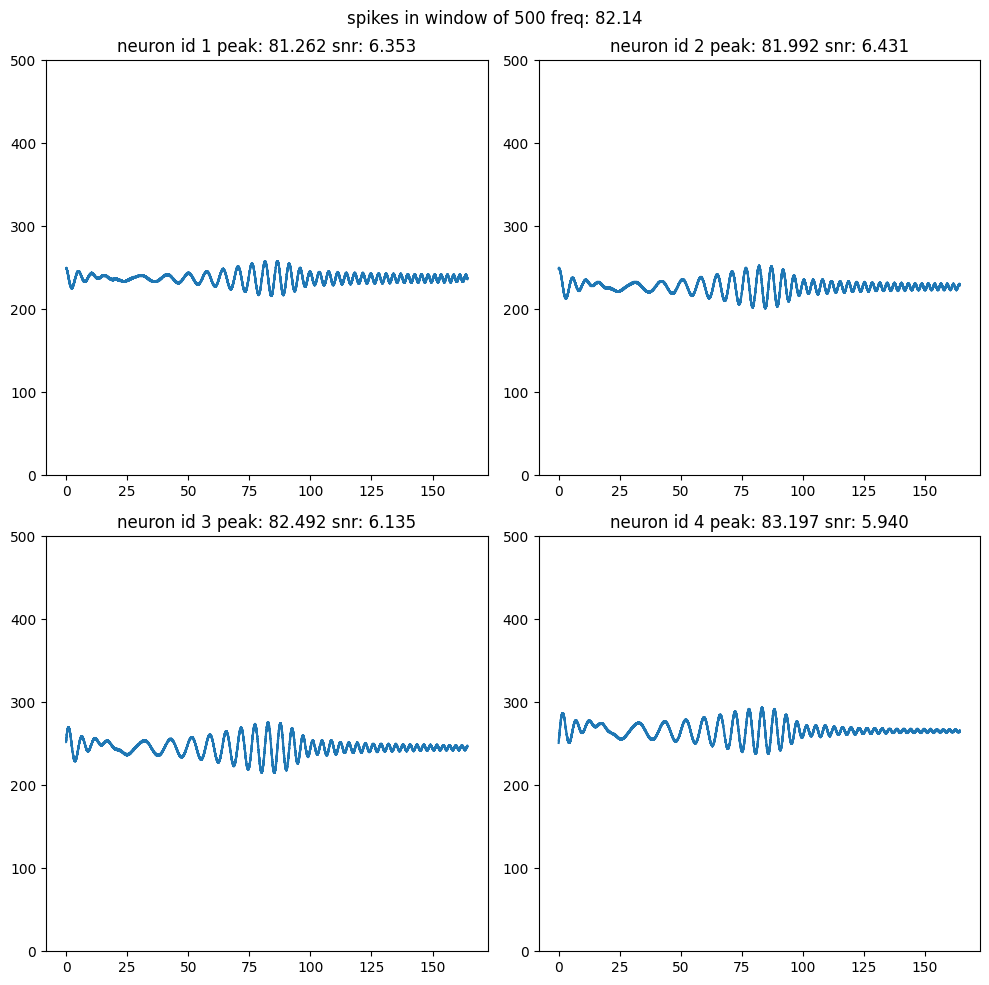

freq0 81.27060923841464
[-1.0988263921079344, -4.6873059689187855, -4.16540054321592, -3.2082006212436314]
[6.104812505974223, 3.939565919872834, 9.338103326263656, 9.076263620379912, 6.885983991782517]
# 81.27060923841464 ~ peak 81.360 nid 1 snr 6.224


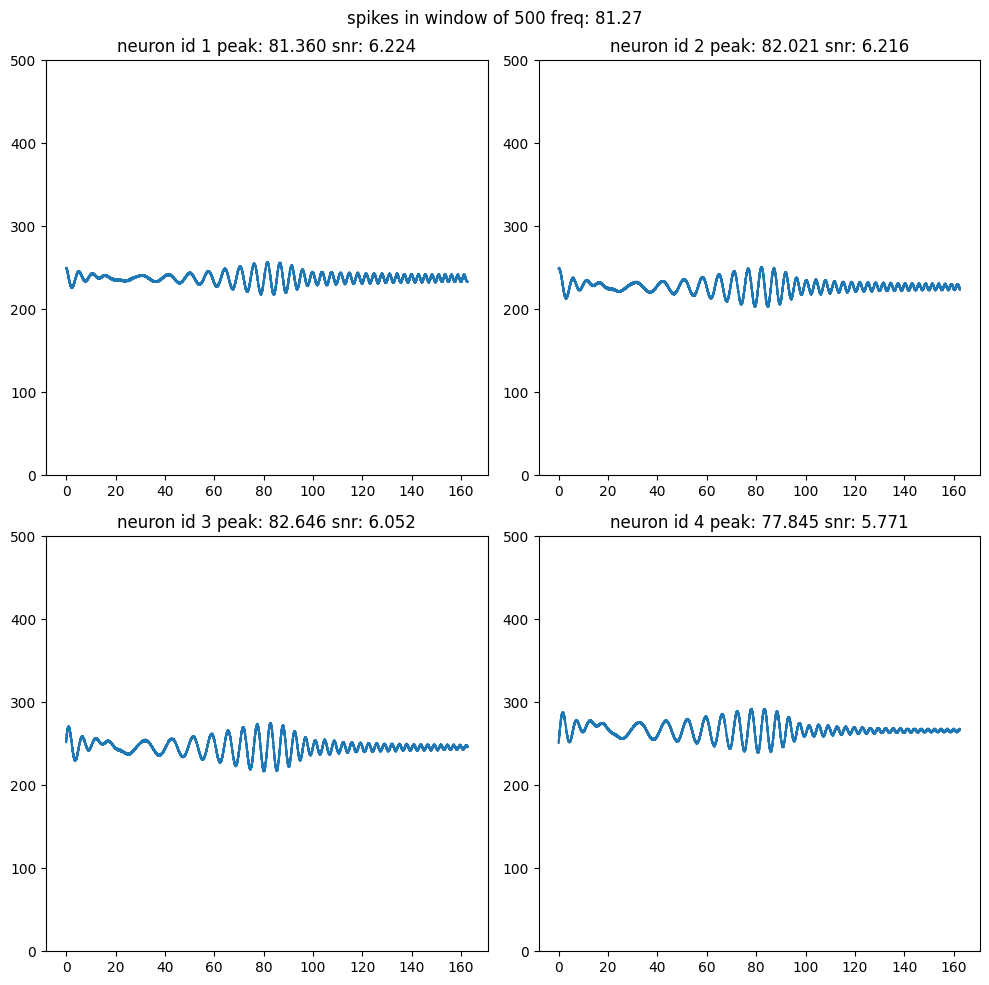

freq0 80.41512914116817
[-1.1028144049101982, -4.665101353575746, -4.134090604362548, -3.195897570590586]
[5.870869524988493, 3.7011424311973116, 9.290960201970094, 9.02214244006926, 6.85503893585839]
# 80.41512914116817 ~ peak 81.494 nid 1 snr 6.234


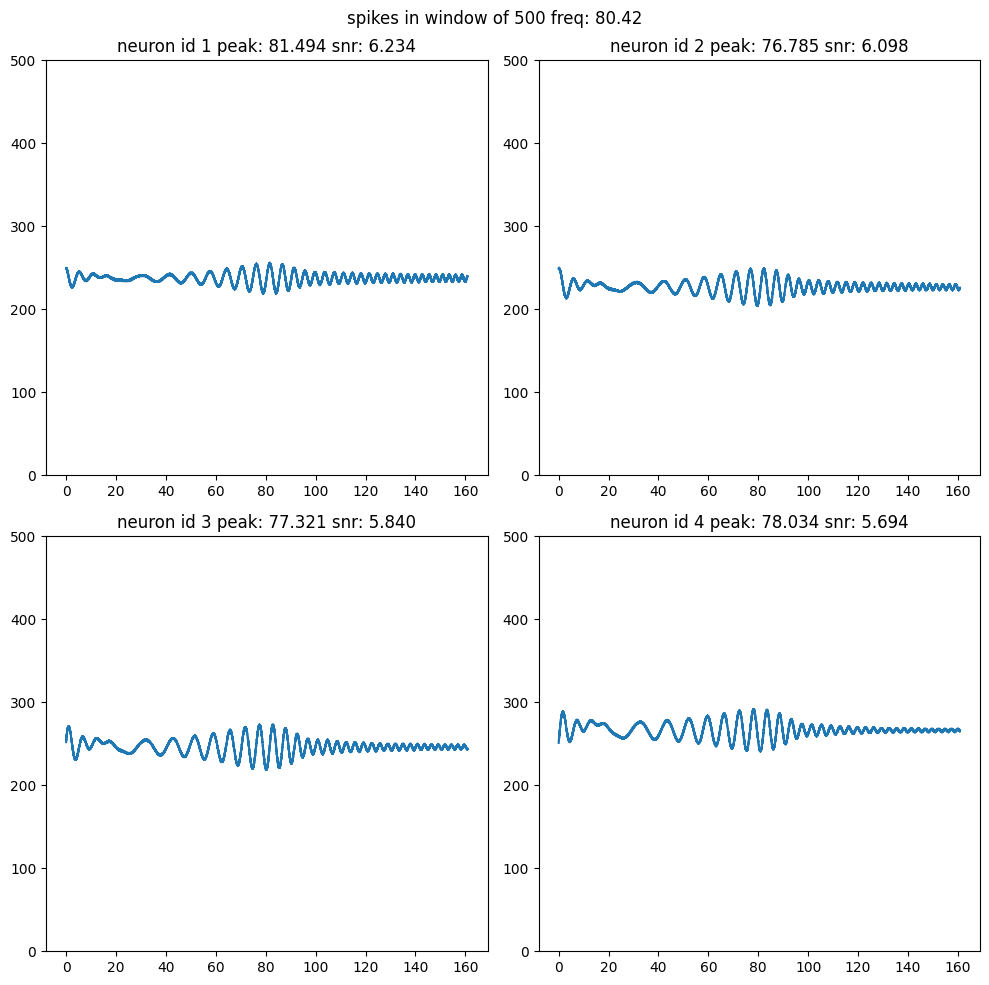

freq0 79.57747154594767
[-1.1069381485848098, -4.643624069078843, -4.1034263868269445, -3.1839074550813224]
[5.641607119897472, 3.4670736154336055, 9.245297543521282, 8.969219305110549, 6.824797577712729]
# 79.57747154594767 ~ peak 78.054 nid 4 snr 5.494


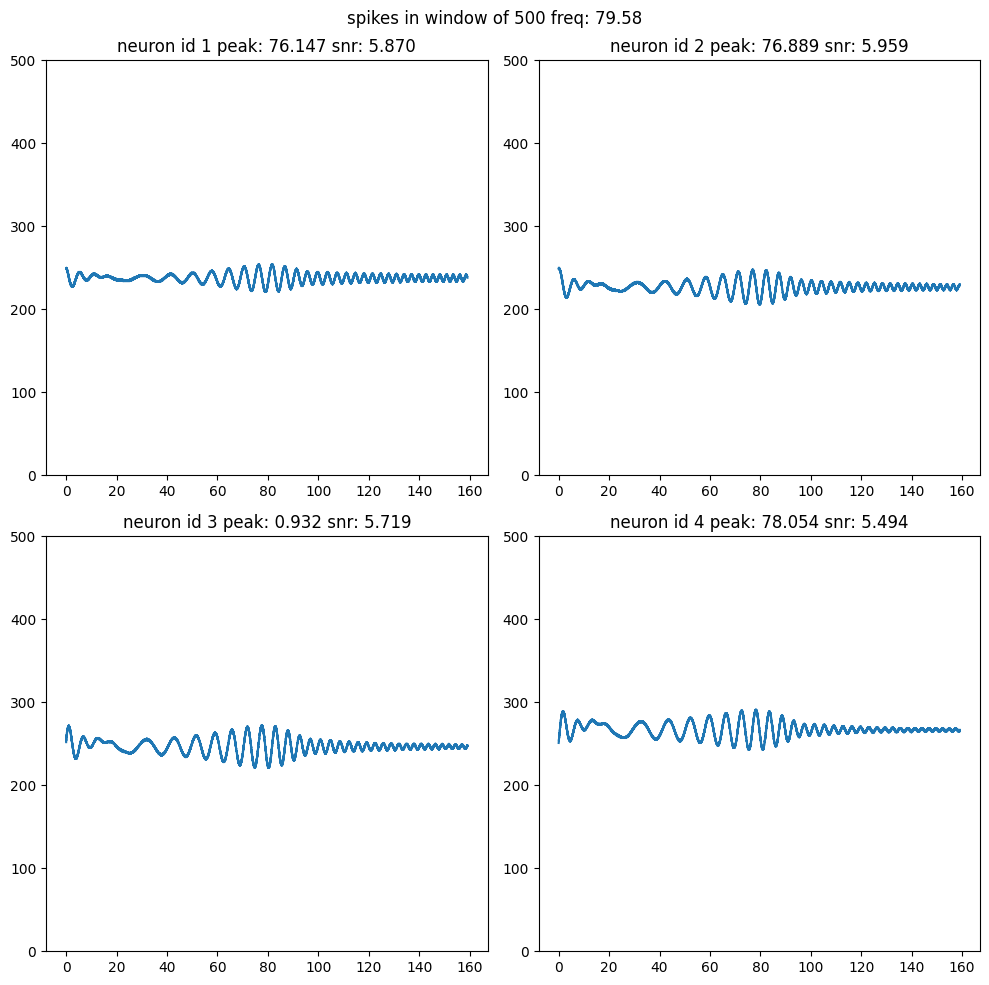

freq0 79.57747154594767
[-1.1069381485848098, -4.643624069078843, -4.1034263868269445, -3.1839074550813224]
[5.641607119897472, 3.4670736154336055, 9.245297543521282, 8.969219305110549, 6.824797577712729]
# 79.57747154594767 ~ peak 78.054 nid 4 snr 5.494


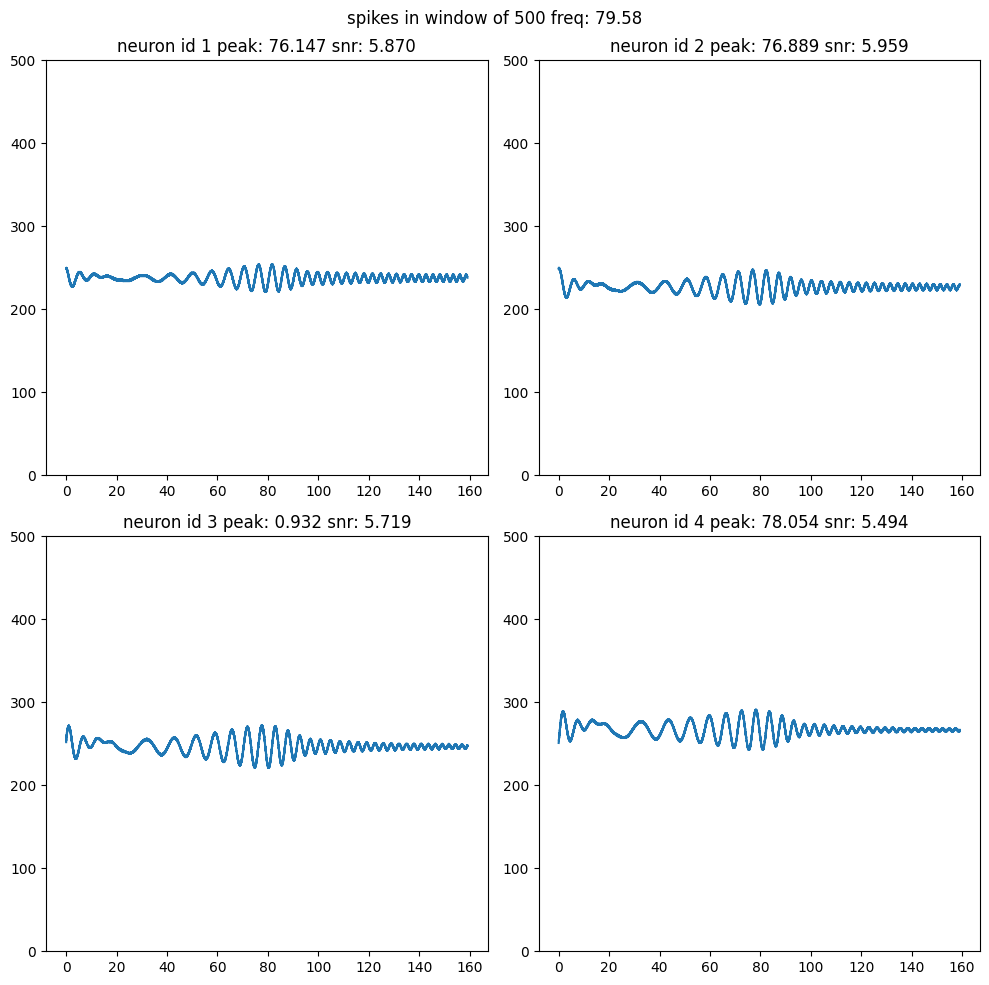

freq0 78.75708524135028
[-1.1111878460512576, -4.622844711966966, -4.073387972353741, -3.172219367524531]
[5.416883863751792, 3.2372388244560852, 9.201056562429457, 8.917455102902242, 6.7952371182558355]
# 78.75708524135028 ~ peak 76.134 nid 1 snr 5.618


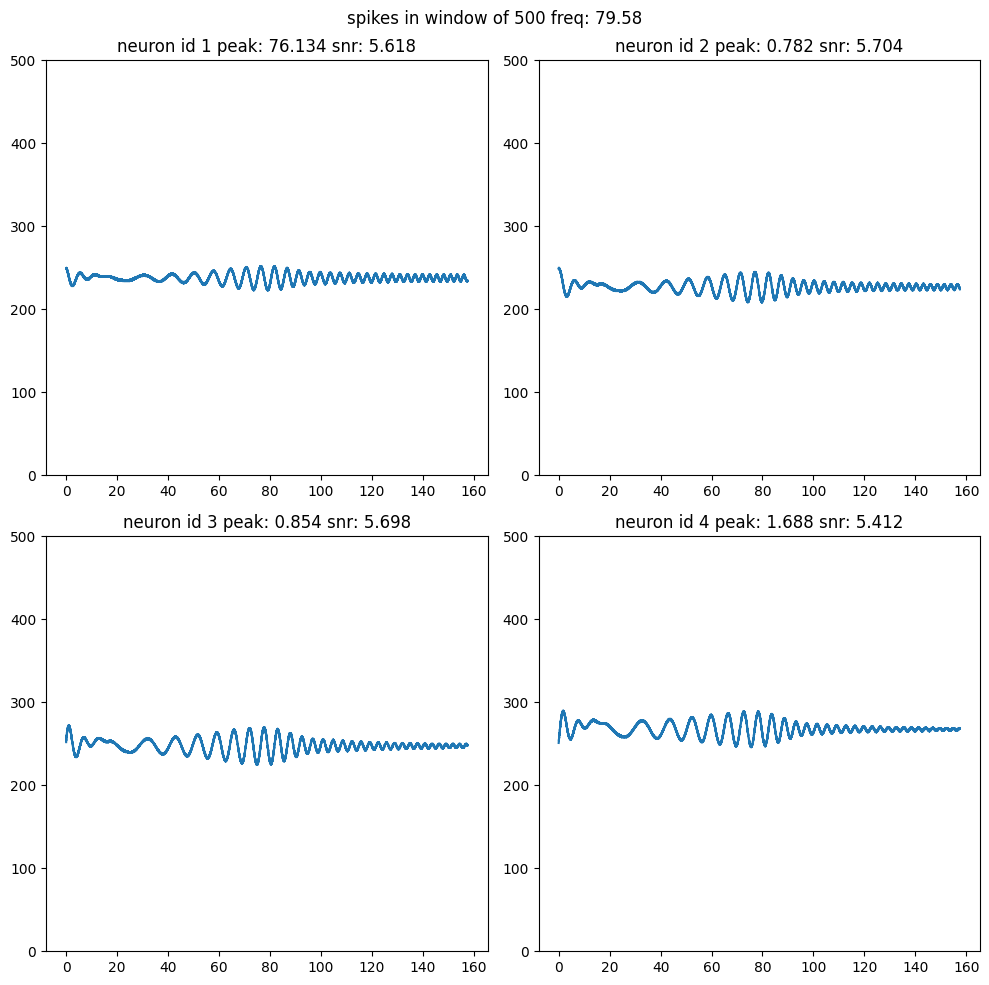

freq0 77.16603301425228
[-1.1200288687346607, -4.583269256217502, -4.015112921324633, -3.1497080029313462]
[4.980517451806264, 2.789811160632169, 9.116618518673384, 8.817255338873721, 6.738072371514239]
# 77.16603301425228 ~ peak 70.883 nid 1 snr 5.465


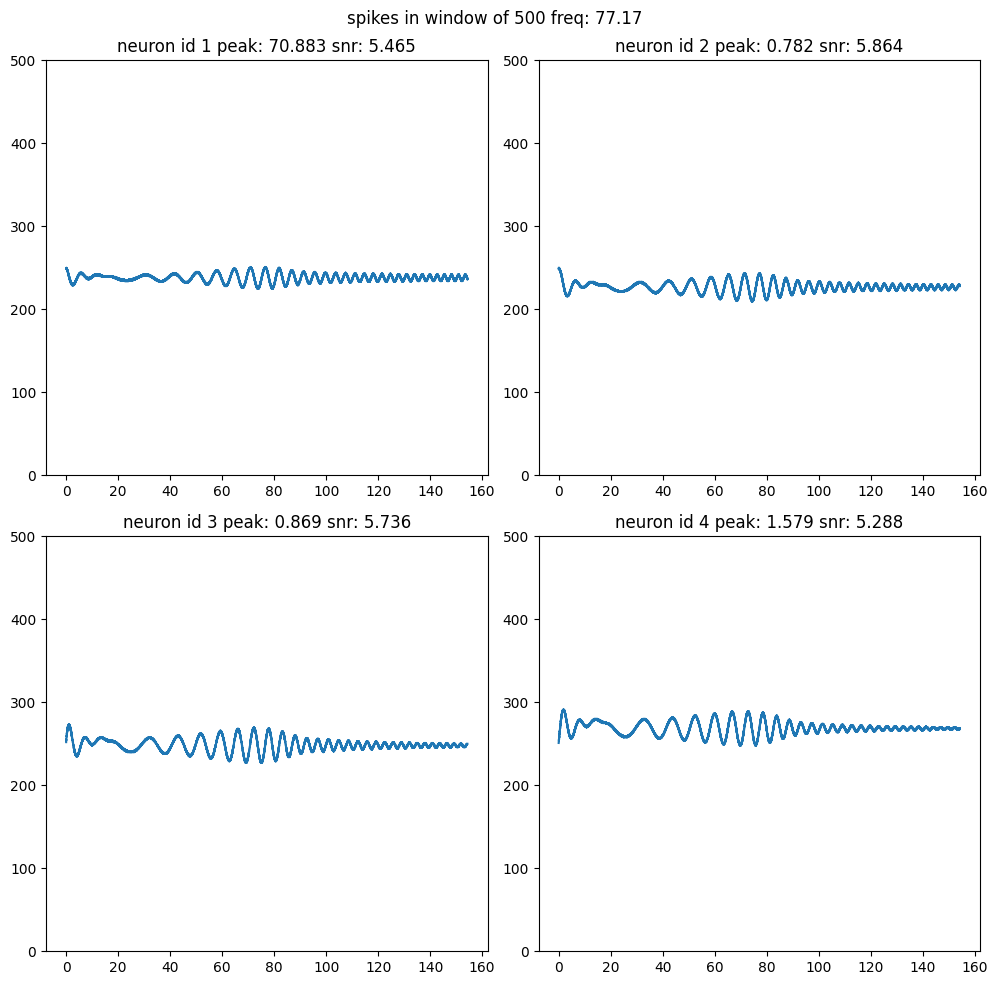

freq0 76.39437268410975
[-1.124603407200646, -4.5644211999377085, -3.986840367411956, -3.138865194257728]
[4.768618947052573, 2.5719987896916336, 9.076317445114498, 8.768749584421638, 6.710427020104527]
# 76.39437268410975 ~ peak 70.661 nid 1 snr 5.342


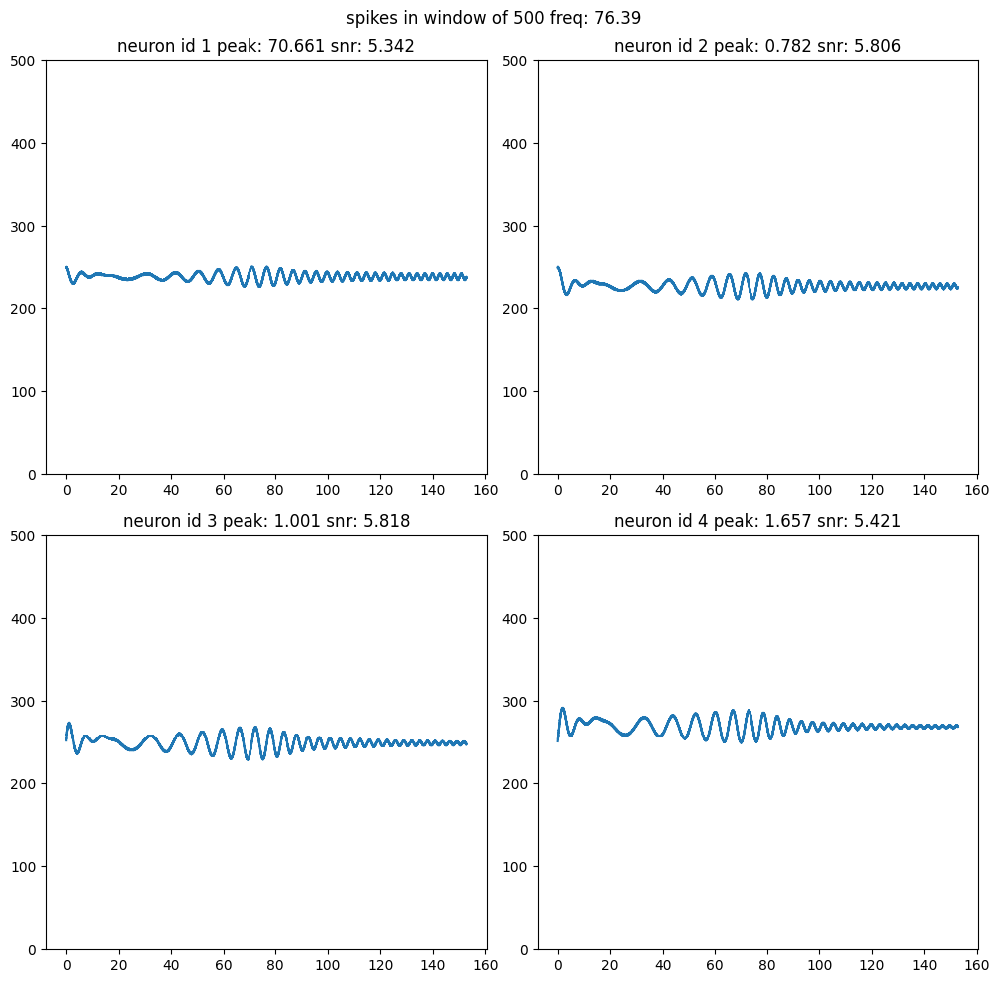

freq0 75.63799275654432
[-1.129270260110805, -4.546167007336308, -3.95912170587871, -3.128285305153243]
[4.5607483627152305, 2.3579810507469716, 9.037229734835066, 8.721262216650143, 6.68338035301972]
# 75.63799275654432 ~ peak 64.658 nid 1 snr 5.191


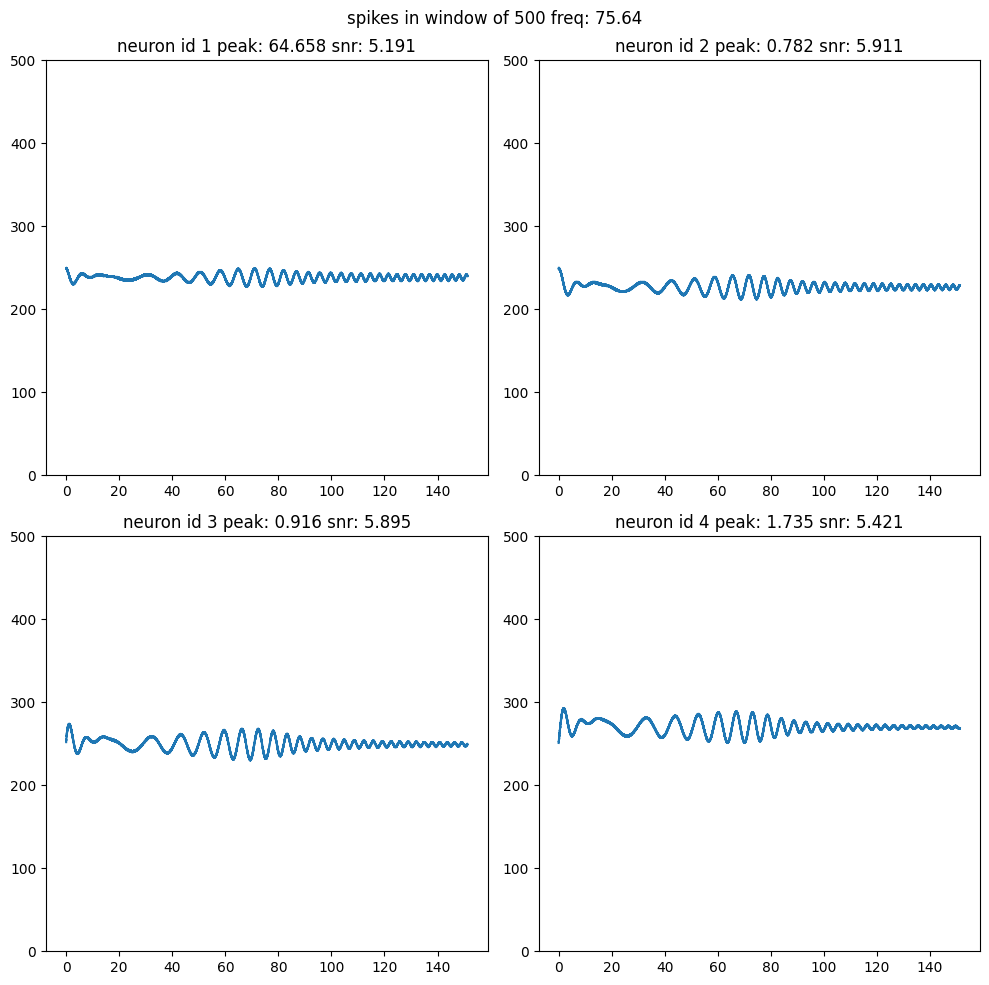

freq0 74.89644380795075
[-1.1340222198944083, -4.528483678202896, -3.9319407093684795, -3.1179595756546776]
[4.356790182490812, 2.1476579023199918, 8.999309287071512, 8.674761672346655, 6.656913846542455]
# 74.89644380795075 ~ peak 70.954 nid 1 snr 5.249


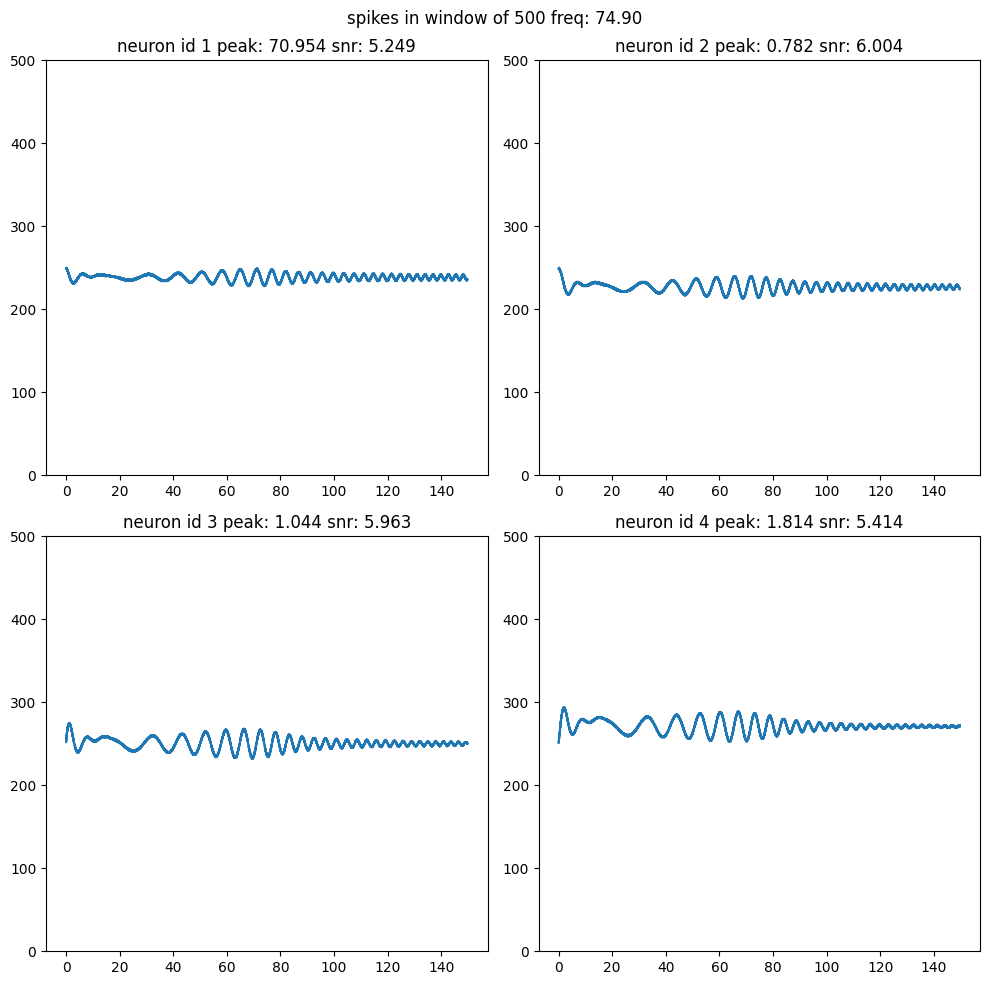

freq0 74.89644380795075
[-1.1340222198944083, -4.528483678202896, -3.9319407093684795, -3.1179595756546776]
[4.356790182490812, 2.1476579023199918, 8.999309287071512, 8.674761672346655, 6.656913846542455]
# 74.89644380795075 ~ peak 70.954 nid 1 snr 5.249


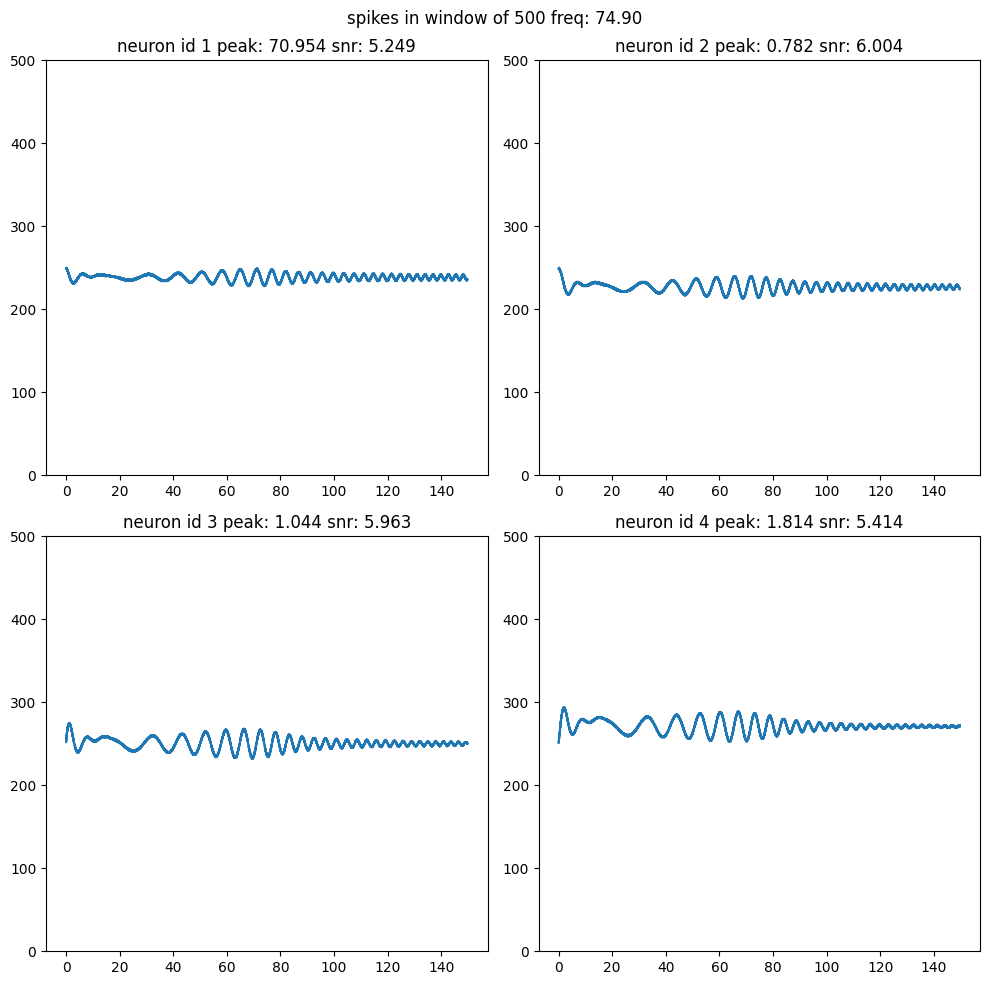

freq0 73.45612758087476
[-1.1437547169737678, -4.494742920842832, -3.879129930613633, -3.0980373685781633]
[3.960170952613538, 1.7377128728710716, 8.926796312770726, 8.58460116274992, 6.605650856149808]
# 73.45612758087476 ~ peak 65.050 nid 1 snr 5.070


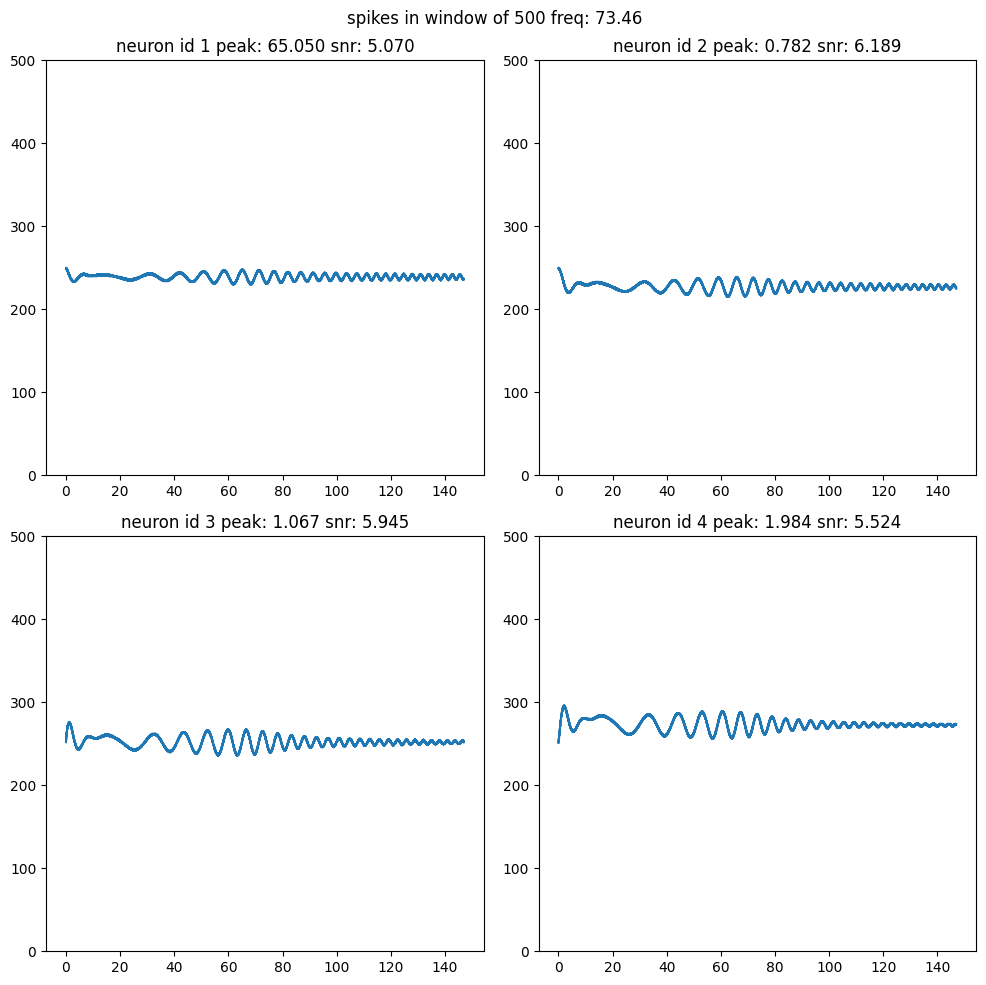

freq0 72.75654541343786
[-1.148722850701886, -4.478644630743823, -3.8534707321140473, -3.088425130309057]
[3.7673002240635327, 1.5379080950977908, 8.892121780799904, 8.540884242774649, 6.580820857032975]
# 72.75654541343786 ~ peak 58.171 nid 1 snr 4.791


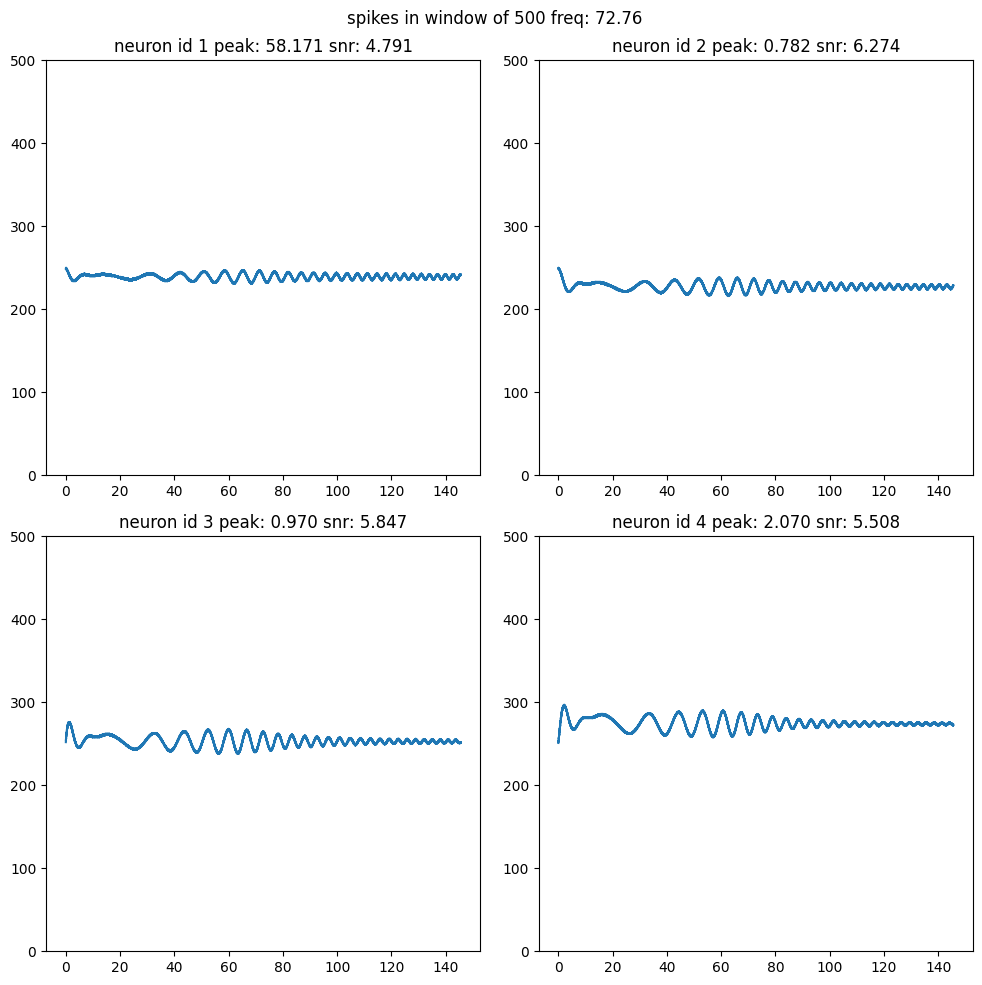

freq0 72.07016290953752
[-1.1537512376345465, -4.463035373530371, -3.828290310044551, -3.0790354968300946]
[3.577922150116251, 1.3414318175822473, 8.858450289796721, 8.498040119116165, 6.556503923630807]
# 72.07016290953752 ~ peak 58.360 nid 1 snr 4.779


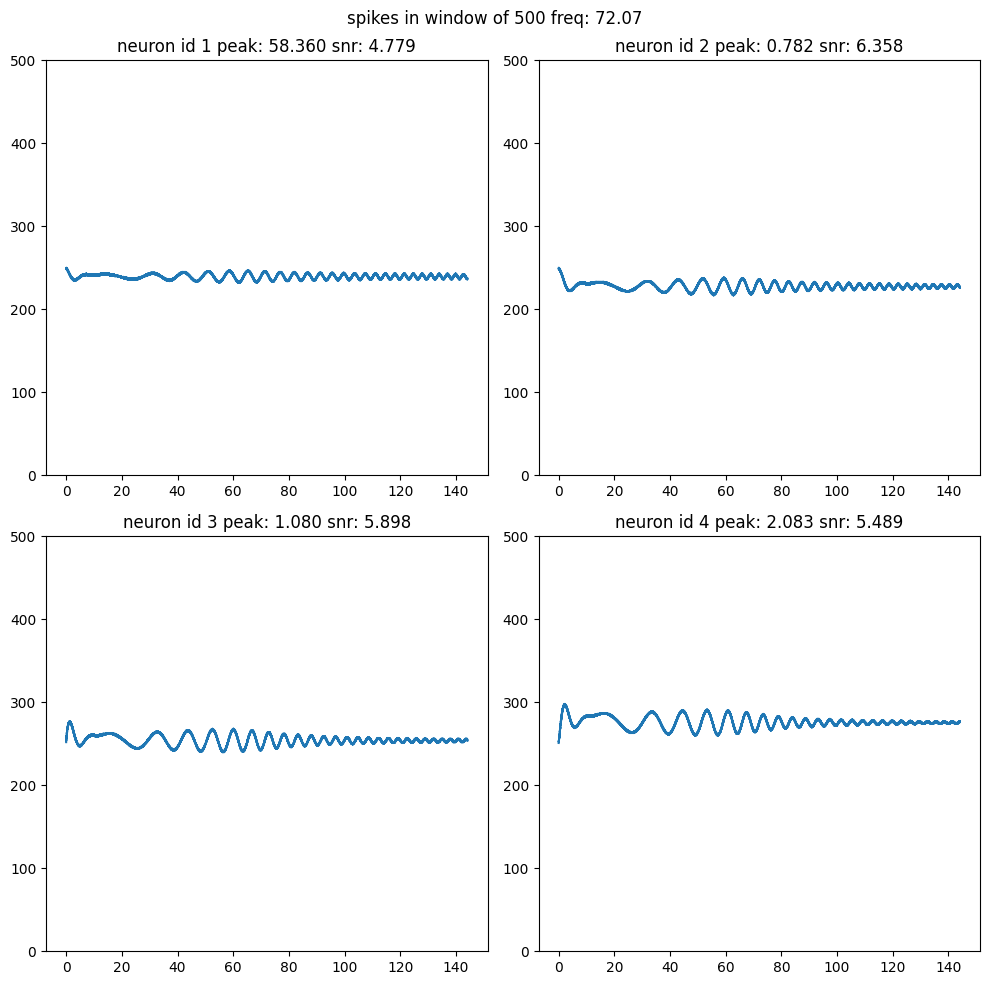

freq0 71.39660998514931
[-1.1588345419353425, -4.447896966525292, -3.803575307027419, -3.0698613669821464]
[3.3919413914180296, 1.148200293648273, 8.825745302065243, 8.456043046438118, 6.5326848707531475]
# 71.39660998514931 ~ peak 0.782 nid 2 snr 6.428


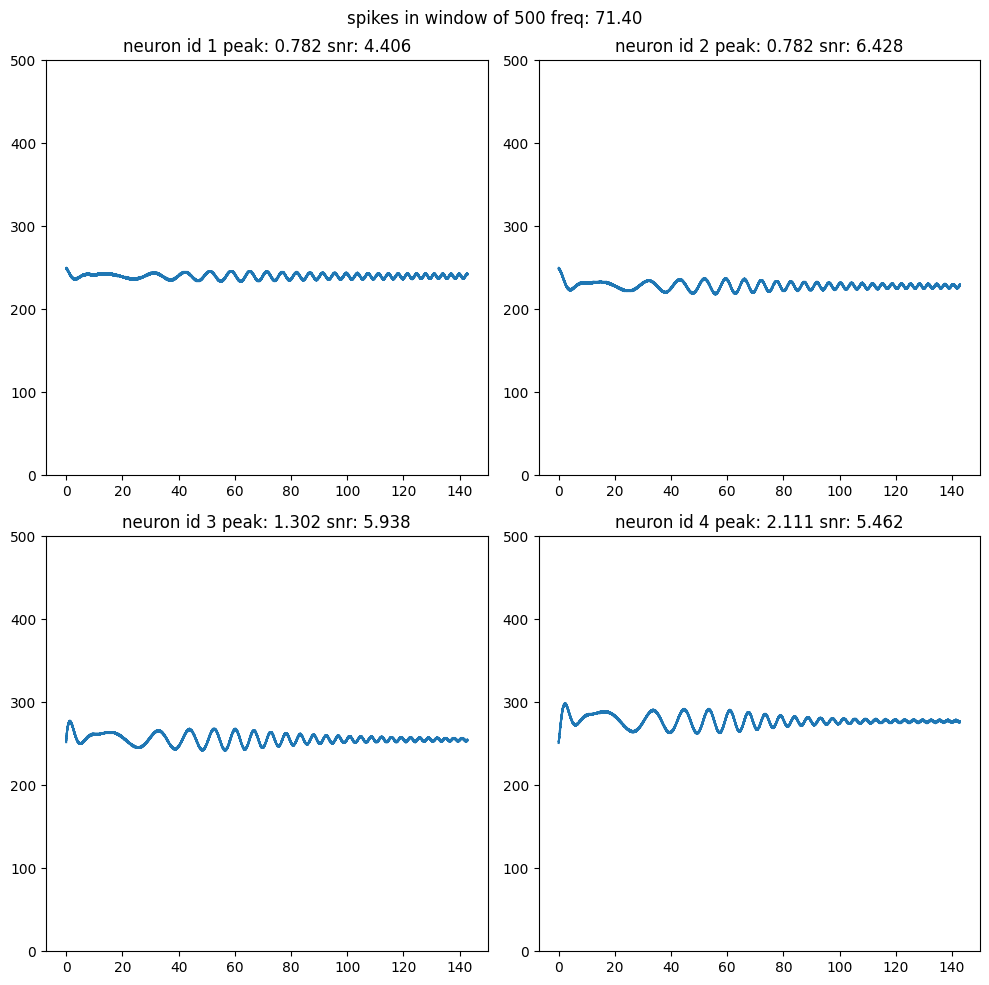

freq0 71.39660998514931
[-1.1588345419353425, -4.447896966525292, -3.803575307027419, -3.0698613669821464]
[3.3919413914180296, 1.148200293648273, 8.825745302065243, 8.456043046438118, 6.5326848707531475]
# 71.39660998514931 ~ peak 0.782 nid 2 snr 6.428


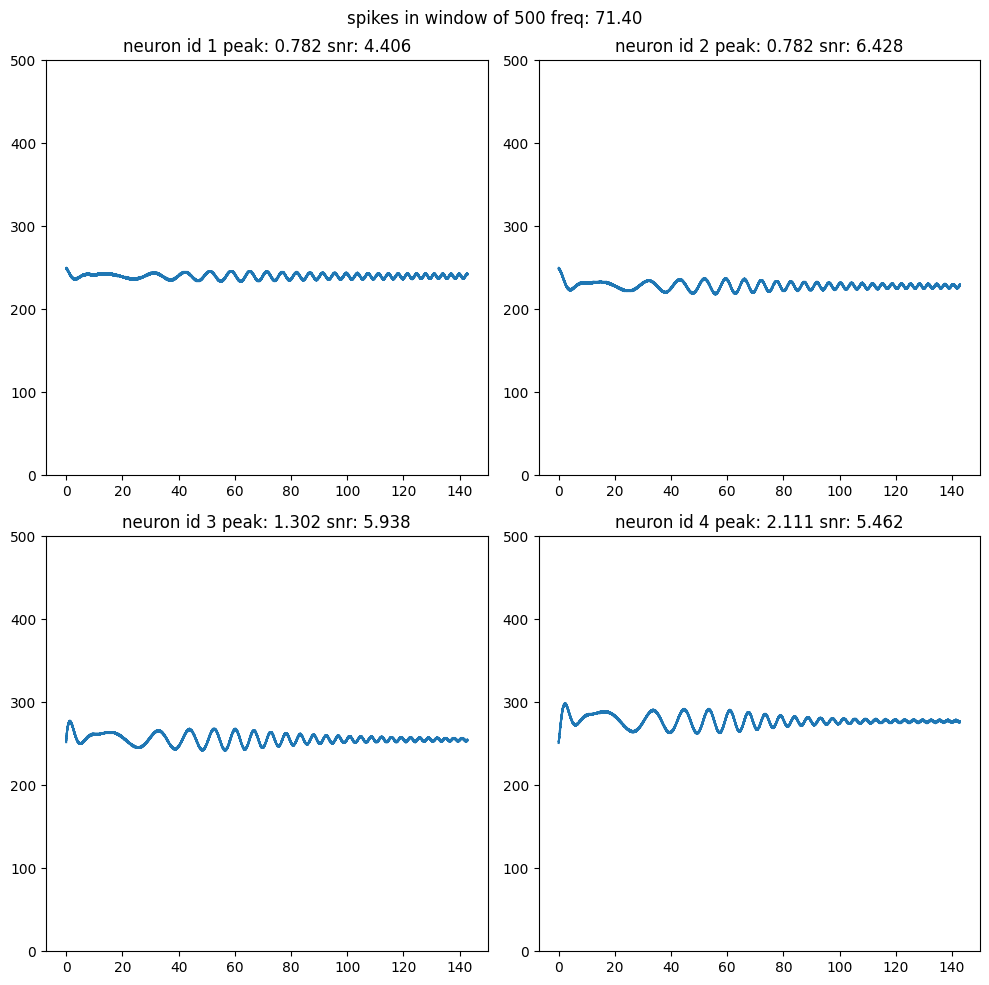

freq0 70.0865804441374
[-1.1691460891692946, -4.418964001250284, -3.7554905819491324, -3.0521326238842024]
[3.029807728831969, 0.7711506022444325, 8.763096692852578, 8.374492017138081, 6.4864825238946775]
# 70.0865804441374 ~ peak 0.782 nid 2 snr 6.297


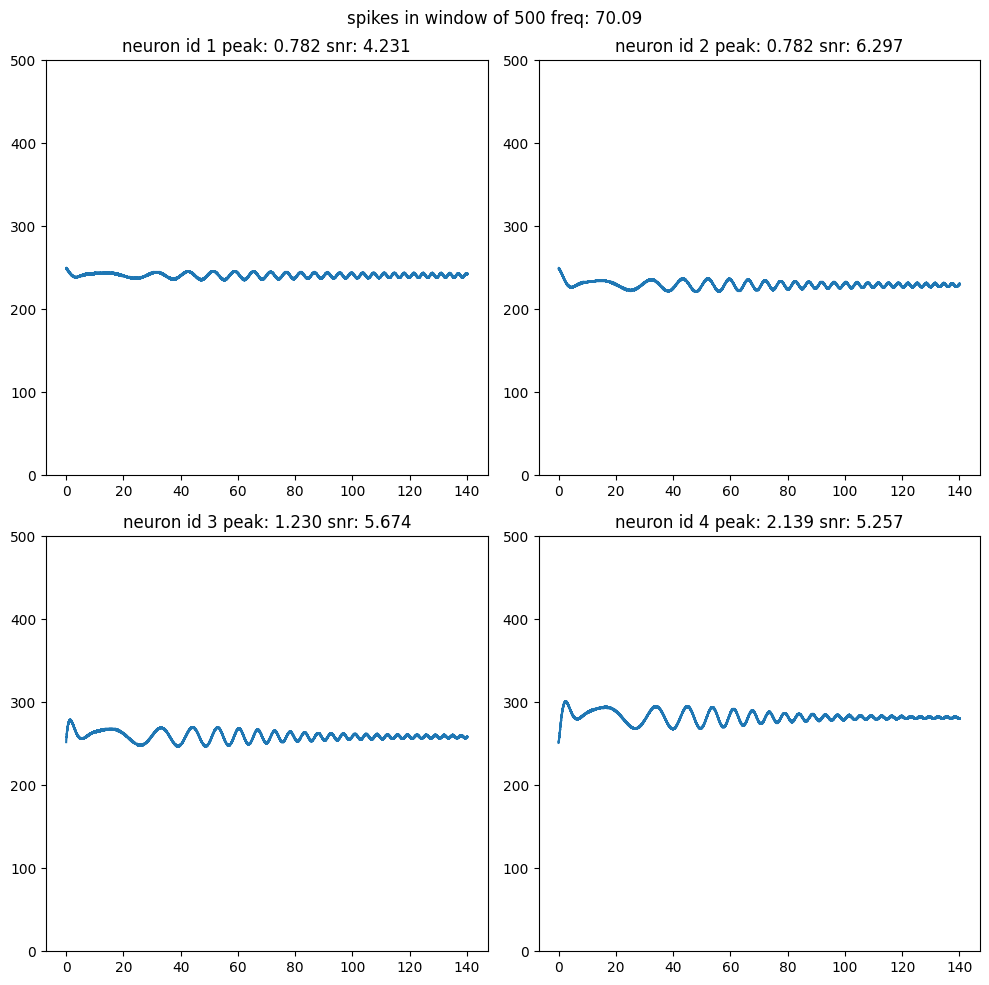

freq0 69.44942971282705
[-1.1743651363849894, -4.405136980701268, -3.7320965310910967, -3.0435651784846014]
[2.8534809421668967, 0.5871786635694605, 8.733087754969638, 8.33489137370509, 6.464071639529912]
# 69.44942971282705 ~ peak 0.782 nid 2 snr 6.338


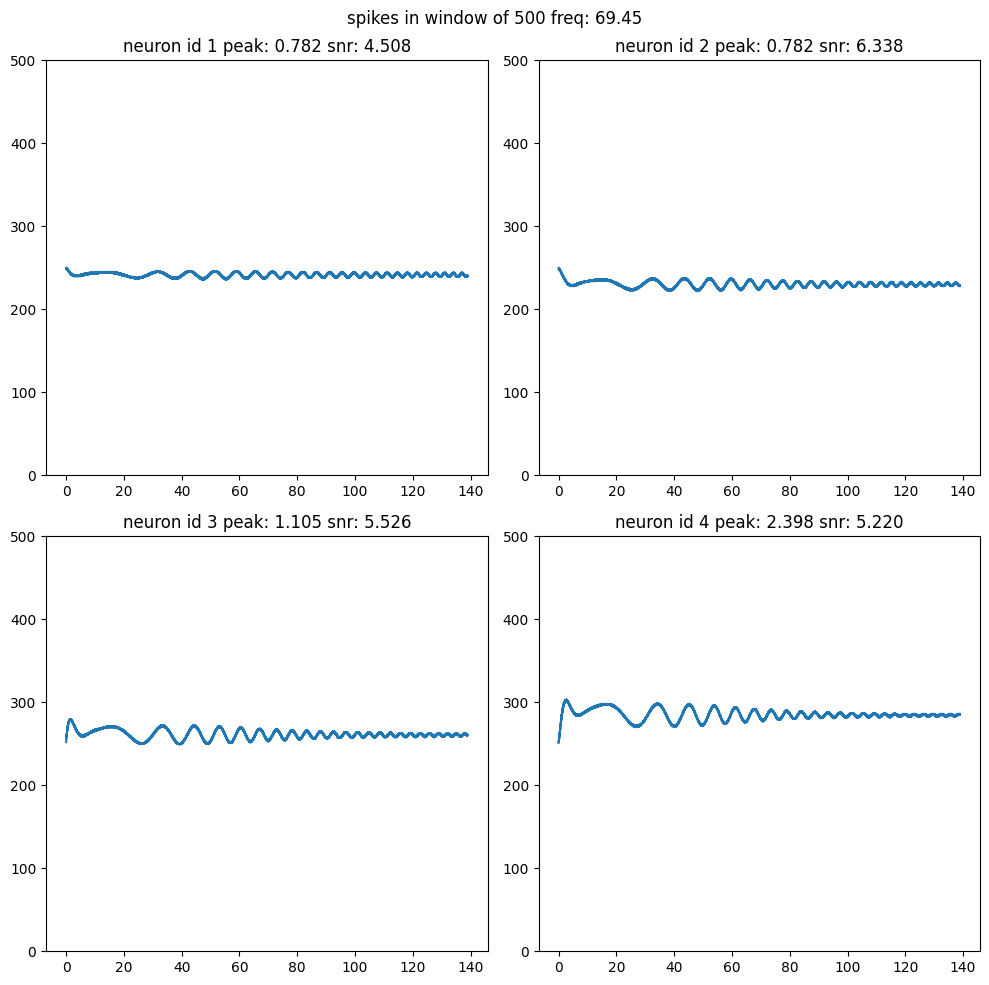

freq0 68.82375917487366
[-1.1796206762582049, -4.39171580781046, -3.709119199656211, -3.0351875473490946]
[2.6802034114793543, 0.40614371045062114, 8.703914533540711, 8.296044320041375, 6.442103406083355]
# 68.82375917487366 ~ peak 0.782 nid 2 snr 6.086


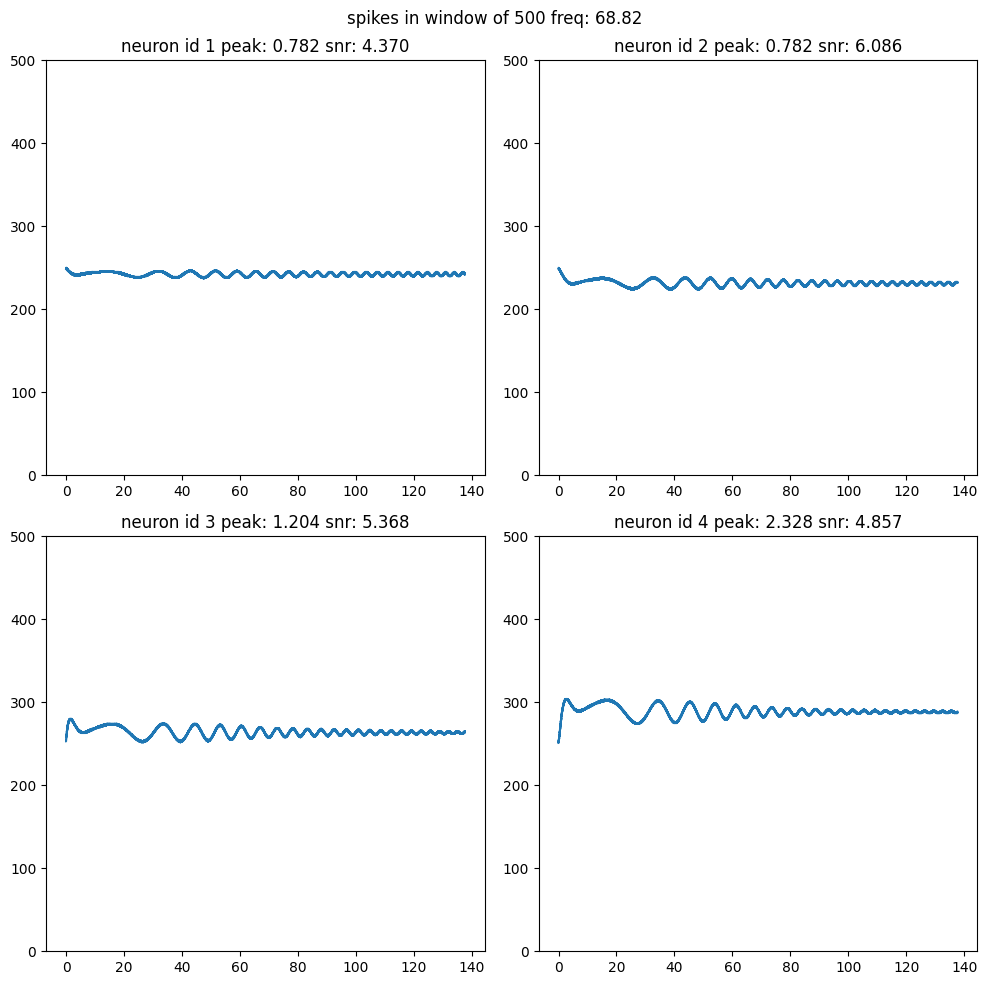

freq0 68.209261325098
[-1.184908748921572, -4.378685968663518, -3.6865474899628268, -3.026993924193163]
[2.509895711103553, 0.22797504074370067, 8.675547787158138, 8.257929651563728, 6.42056527168017]
# 68.209261325098 ~ peak 16.073 nid 4 snr 5.458


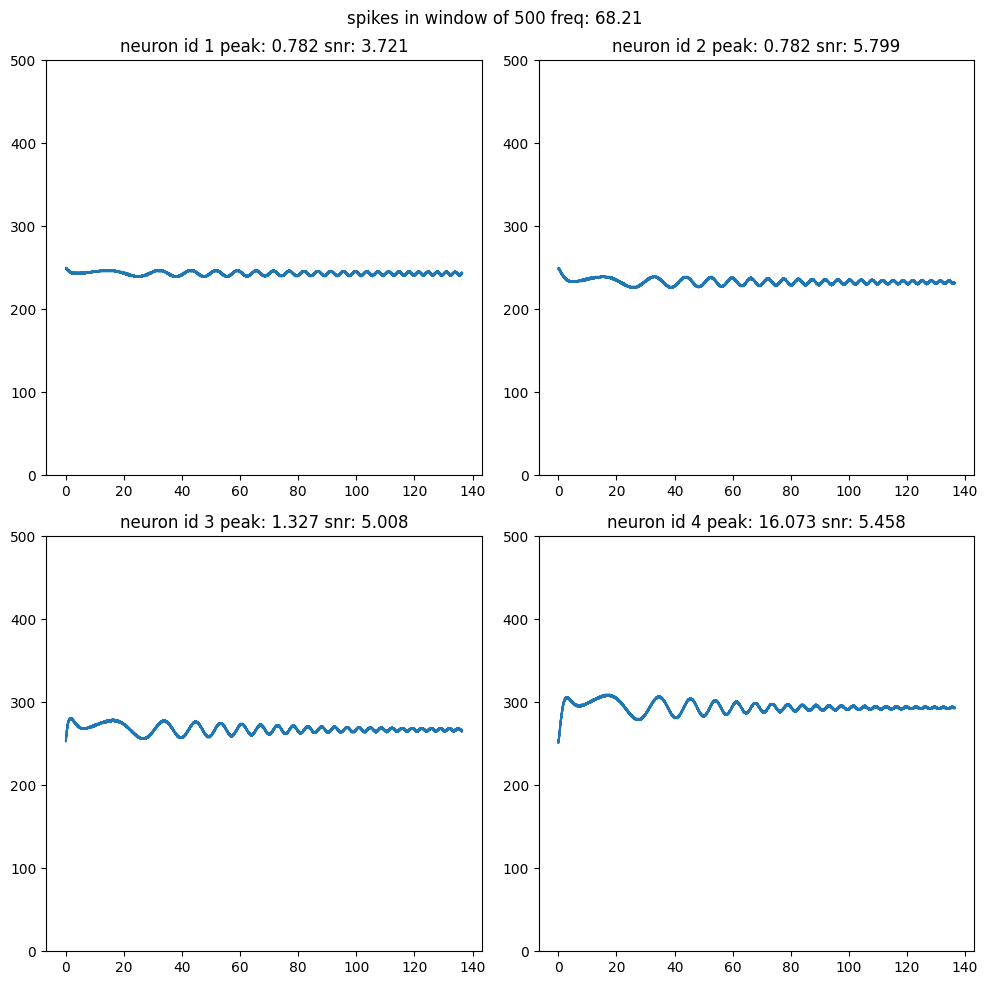

freq0 67.60563954345997
[-1.1902256233258983, -4.366033573879353, -3.664370697055233, -3.0189787264097125]
[2.3424811843061946, 0.05260424238232986, 8.647959517924555, 8.220526948669729, 6.399445142193455]
# 67.60563954345997 ~ peak 16.601 nid 4 snr 6.850


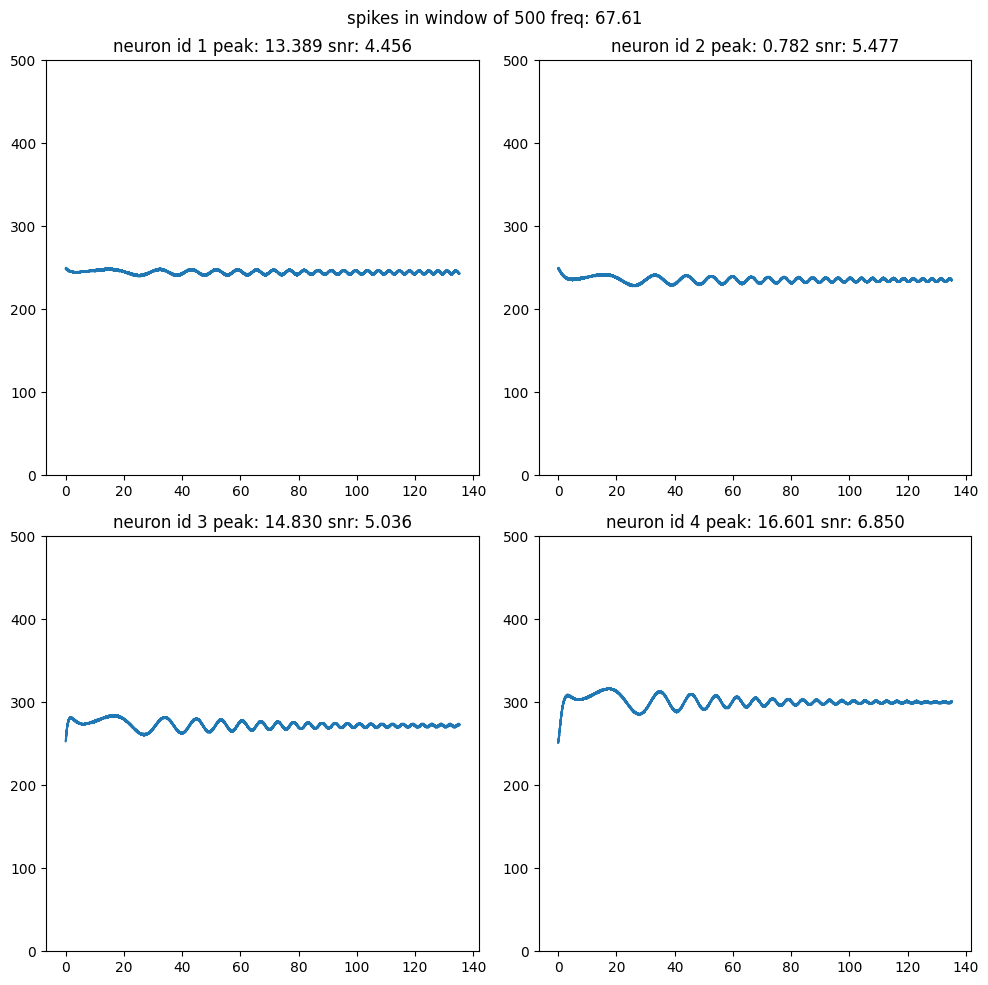

freq0 67.01260761764014
[-1.195567784005525, -4.353745327097439, -3.642578491392692, -3.011136584761057]
[2.1778858222689053, -0.12003490049292509, 8.621122909160242, 8.183816540866726, 6.378731361024215]
# 67.01260761764014 ~ peak 16.688 nid 4 snr 8.493


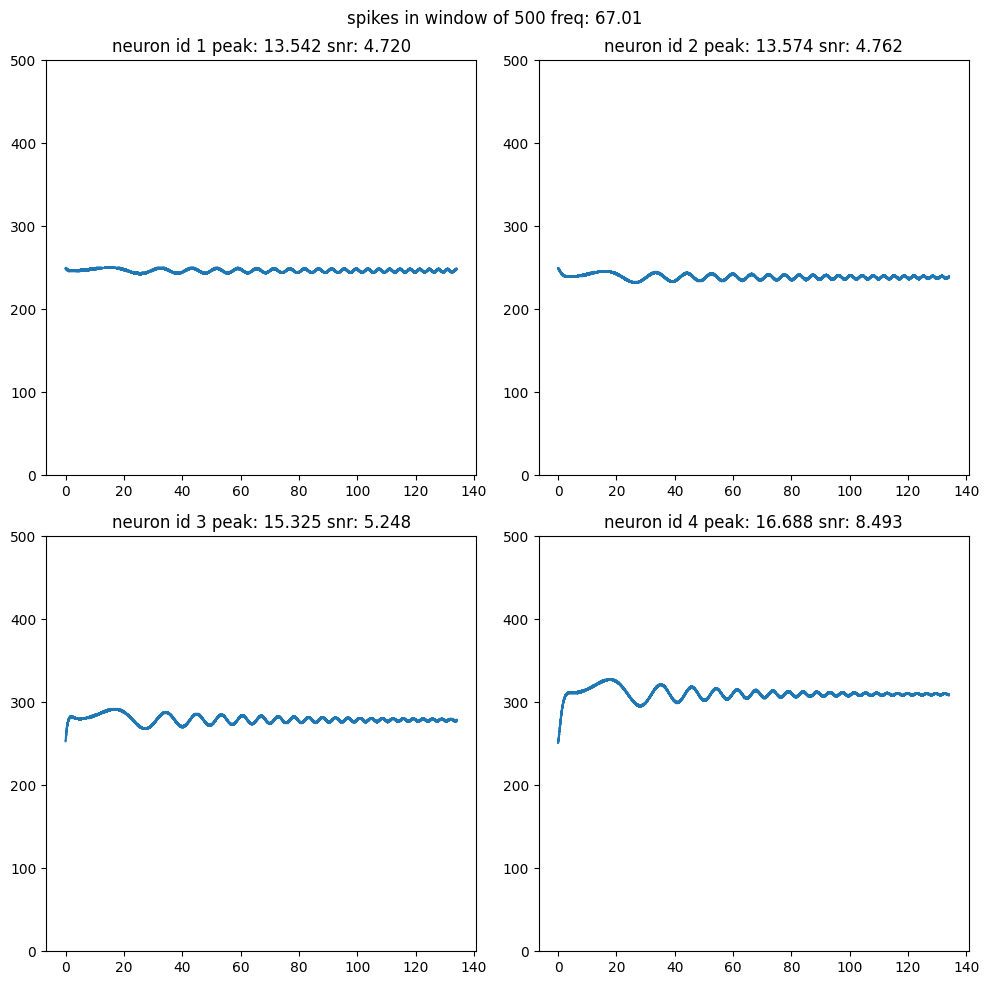

freq0 66.42988929053023
[-1.2009319186677994, -4.341808495288802, -3.621160902450672, -3.0034623336204556]
[2.016038149428198, -0.2900064967214604, 8.595012266698383, 8.147779472844604, 6.358412689922737]
# 66.42988929053023 ~ peak 17.347 nid 4 snr 9.922


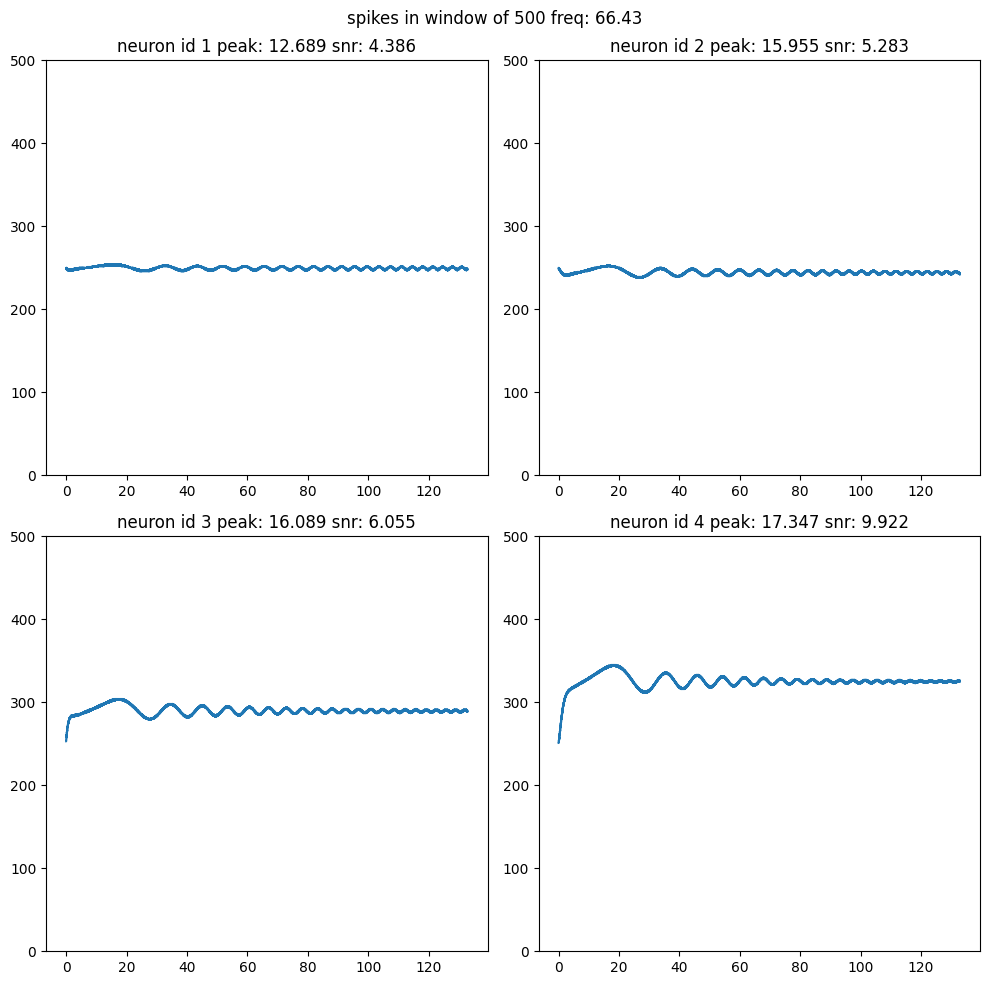

freq0 65.8572178311291
[-1.2063149065506682, -4.330210880771741, -3.600108303178498, -2.995951001730104]
[1.8568691147835068, -0.45737263290199337, 8.569602963534876, 8.112397472370812, 6.338478290790436]
# 65.8572178311291 ~ peak 17.920 nid 4 snr 9.456


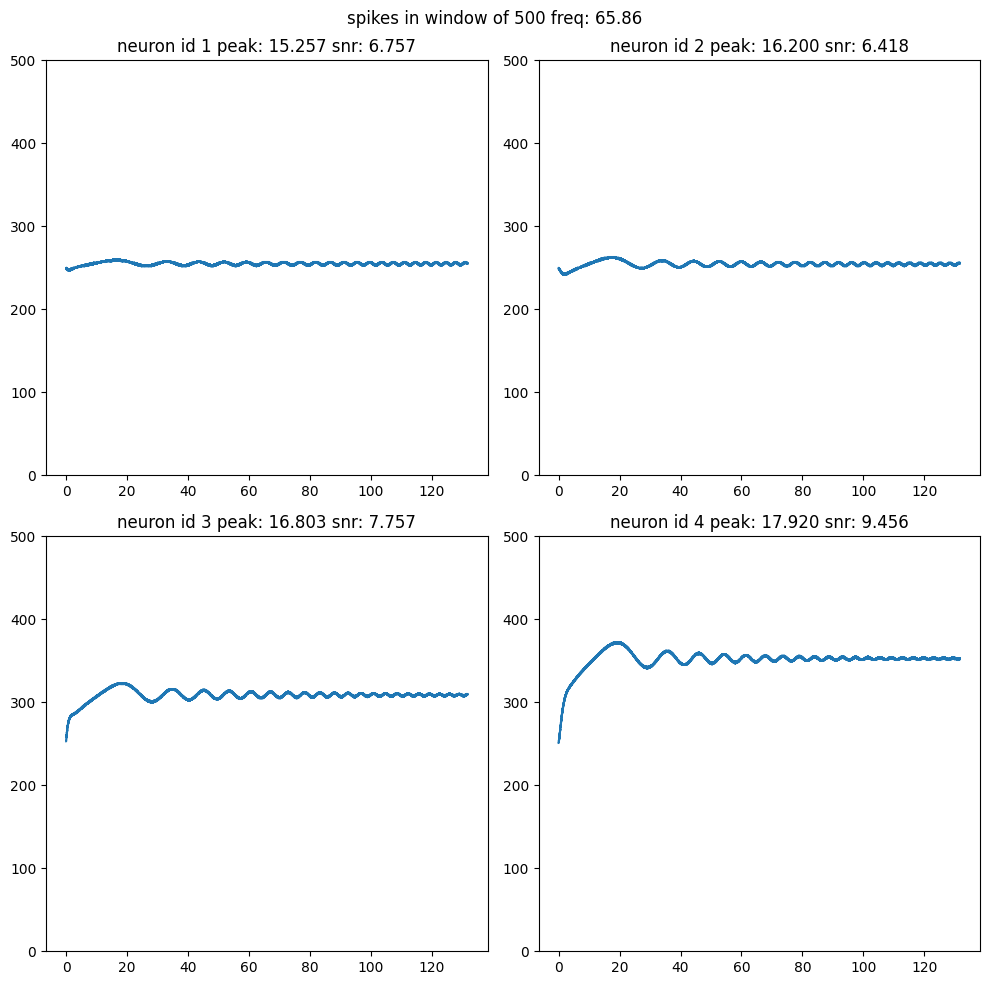

freq0 65.29433562744424
[-1.2117138074966327, -4.31894079482208, -3.579411395261369, -2.988597803444697]
[1.7003119888106681, -0.6221934540220246, 8.544871387616517, 8.077652919894767, 6.3189177084053085]
# 65.29433562744424 ~ peak 35.675 nid 4 snr 6.437


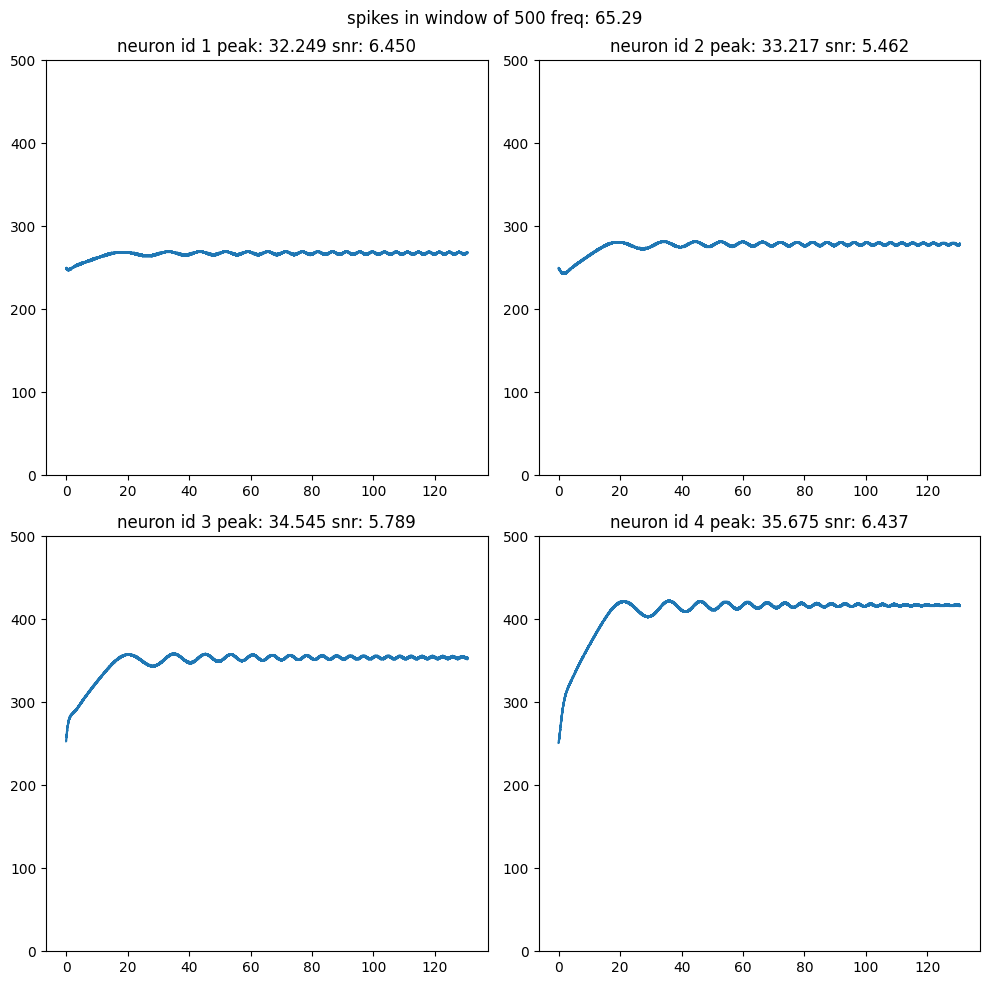

freq0 64.74099380009302
[-1.2171258516950427, -4.307987032775468, -3.559061195138412, -2.981398130431738]
[1.5463022656435044, -0.7845272401782495, 8.520794892566606, 8.04352881975663, 6.299720854017698]
# 64.74099380009302 ~ peak 32.065 nid 1 snr 5.447


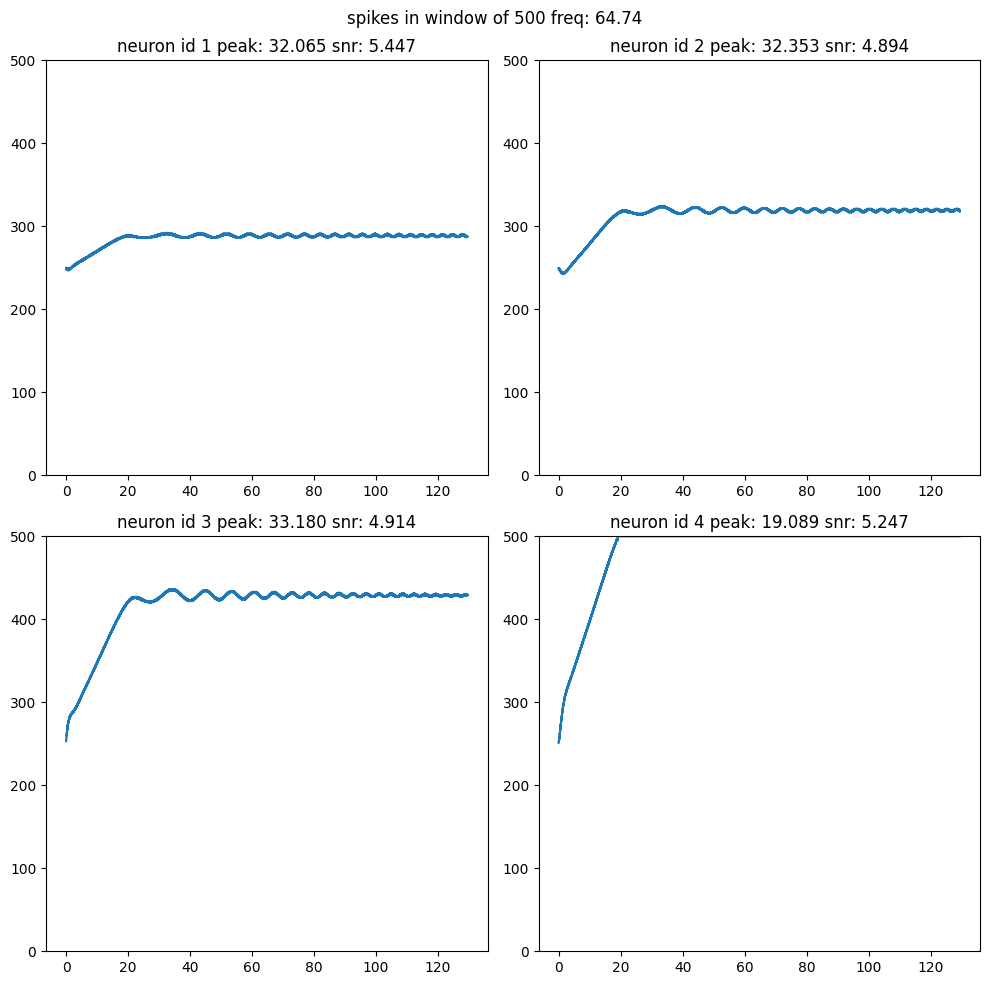

freq0 64.19695183538636
[-1.2225484300482474, -4.297338850526732, -3.5390490207316994, -2.9743475438016738]
[1.3947775702095413, -0.9444304796116398, 8.497351751161531, 8.010008772902715, 6.280877989766575]
# 64.19695183538636 ~ peak 33.493 nid 3 snr 5.066


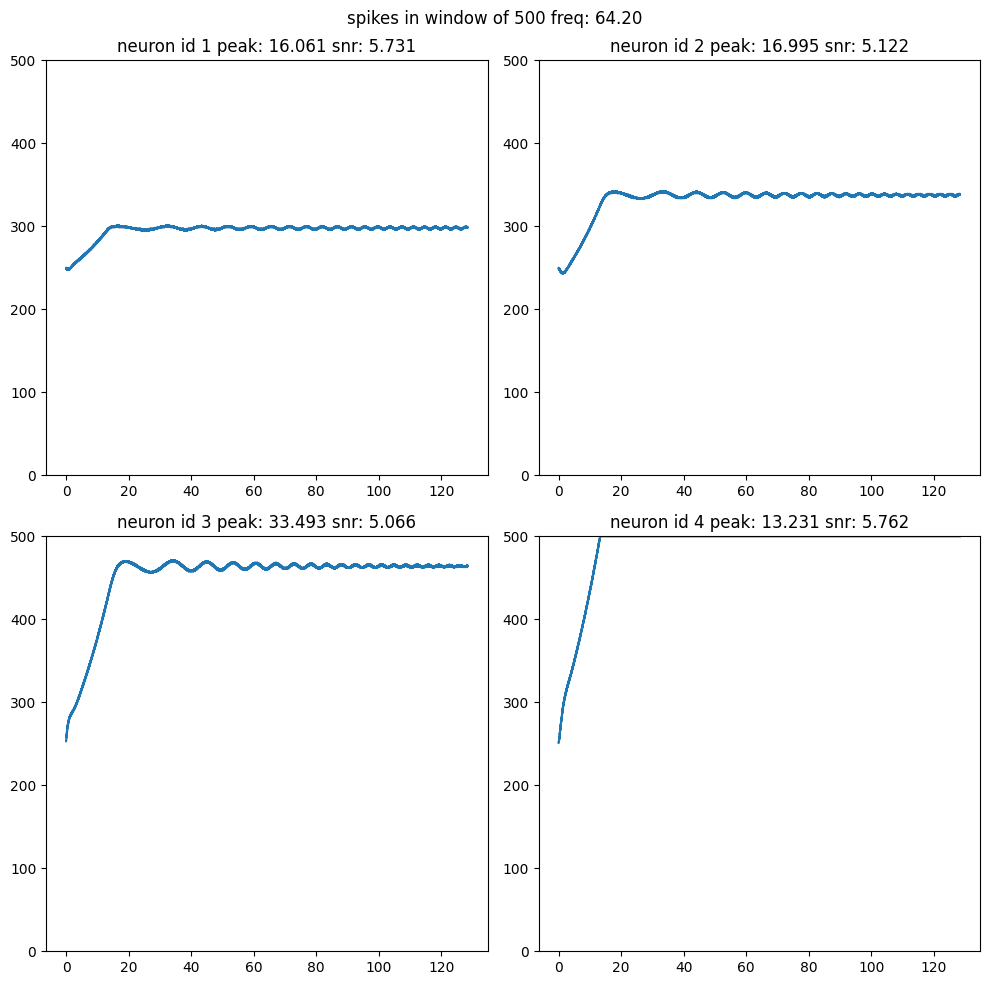

freq0 63.66197723675814
[-1.2279790851203094, -4.286985942337854, -3.5193664788442085, -2.9674417666426534]
[1.245677570026615, -1.1019579382671623, 8.474521111384902, 7.977076951016539, 6.262379713869684]
# 63.66197723675814 ~ peak 13.600 nid 1 snr 5.962


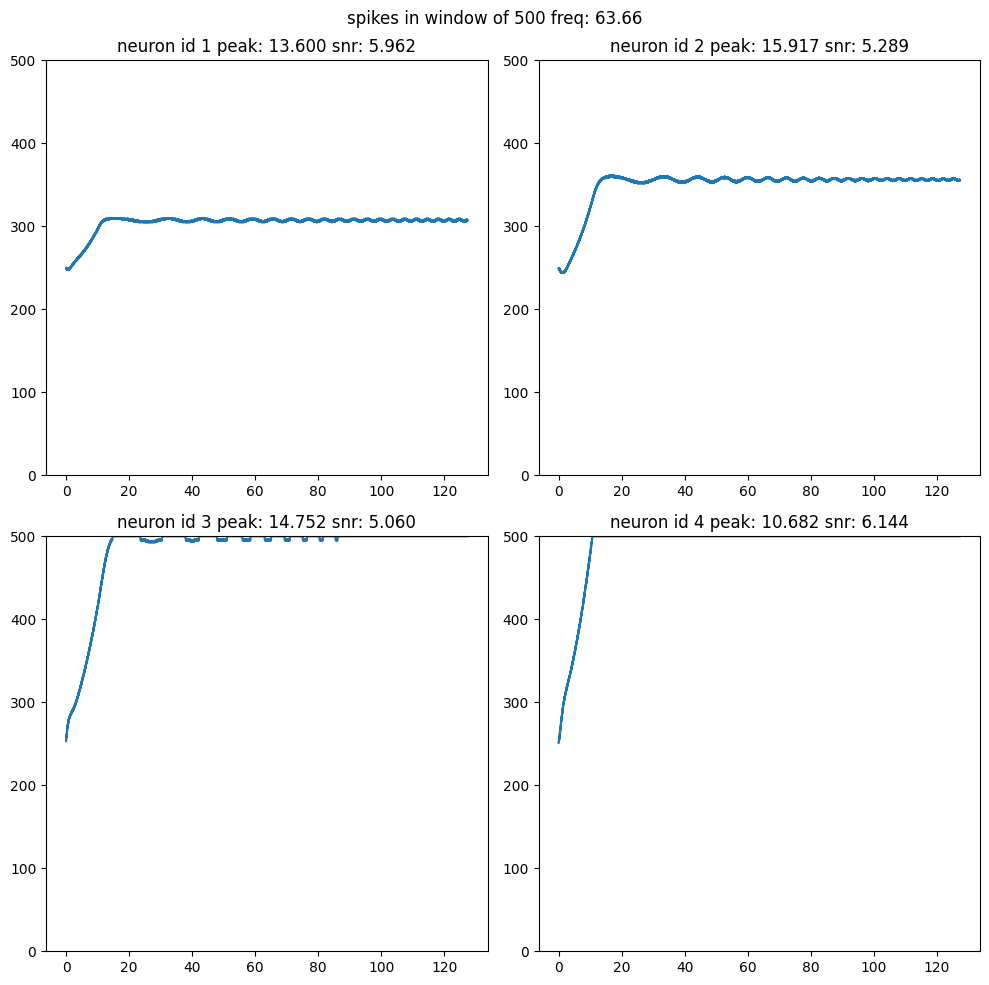

In [12]:
lf = 5
clk_freq = 1536000
# freq 470 dont work on step 20 but do work in step 200
freqs = [freq_of_resonator(clk_freq=clk_freq, LF=lf, LP=lp) for lp in range(2, 120)]
# freqs = [100 * (1.05 ** i) for i in range(42, 60)]
for freq0 in freqs:
    best_lp = lp_by_lf(lf, freq0, clk_freq)
    freq0 = freq_of_resonator(clk_freq, lf, best_lp)
    print(f'freq0 {freq0}')
    spikes_window = 500

    res_resonator = regression_resonator(
        clk_freq=clk_freq,
        freq0=freq0,
        lf=lf,
    )

    for nid in range(1,5):
        res_resonator.log_out_spikes(nid)

    start_freq = 0
    spectrum = 2 * freq0
    res_resonator.forget_logs()

    step = 400 / clk_freq
    test_size = int(spectrum / step)
    test_resonator_on_chirp(
        res_resonator,
        start_freq=start_freq,
        step=step,
        test_size=test_size,
        clk_freq=clk_freq
    )

    snr = [0] * 4
    peak = [0] * 4
    best_lp = lp_by_lf(lf, freq0, clk_freq)
    f_resonator = freq_of_resonator(clk_freq, lf, best_lp)
    fig, axs = plt.subplots(2, 2, figsize=(10, 10))
    fig.suptitle(f'spikes in window of {spikes_window} freq: {f_resonator:.2f}')
    for nid in range(4):
        spikes_neuron = res_resonator.neurons[nid + 1]
        y_events = spikes_neuron.out_spikes()
        y_spikes = np.zeros(test_size)
        y_spikes[y_events] = 1
        y_spikes = np.convolve(y_spikes, np.ones(spikes_window, dtype=int), 'valid')
        x = np.linspace(start_freq, start_freq+spectrum, len(y_spikes))

        ax = axs[nid//2, nid%2]
        ax.set_ylim(0, spikes_window)
        ax.plot(x, y_spikes)
        snr_spikes = y_spikes[3000:]
        snr[nid] = (snr_spikes.max() - snr_spikes.min())/snr_spikes.std()
        peak[nid] = x[3000+np.argmax(snr_spikes)]
        ax.set_title(f'neuron id {nid + 1} peak: {peak[nid]:.3f} snr: {snr[nid]:.3f}')

    fig.tight_layout()

    nid = np.argmax(np.array(snr) / np.abs(np.array(peak) - freq0))
    print(f'# {freq0} ~ peak {peak[nid]:.3f} nid {nid+1} snr {snr[nid]:.3f}')
    plt.show()